**Table of contents**<a id='toc0_'></a>    
- 1. [ Third selection of features.](#toc1_)    
  - 1.1. [Preparing data + sampling](#toc1_1_)    
  - 1.2. [t-SNE (finding the right perplexity and guessing the underlying manifold?)](#toc1_2_)    
    - 1.2.1. [On the full dataset sample Xs](#toc1_2_1_)    
  - 1.3. [t-SNE and PCA dimensionality reduction of Xspp](#toc1_3_)    
  - 1.4. [OPTICS](#toc1_4_)    
  - 1.5. [Kmeans](#toc1_5_)    
  - 1.6. [Hierarchical clustering (ward only)](#toc1_6_)    
  - 1.7. [Clustering models scores](#toc1_7_)    
    - 1.7.1. [Silhouette means](#toc1_7_1_)    
    - 1.7.2. [calinski_harabasz_score](#toc1_7_2_)    
    - 1.7.3. [Davies_Bouldin](#toc1_7_3_)    
  - 1.8. [Conclusions](#toc1_8_)    
    - 1.8.1. [Comparisons for the entire dataset](#toc1_8_1_)    
    - 1.8.2. [Plotting centroids value and faking it for the hierarchical clustering](#toc1_8_2_)
    - 1.8.3. [Naming the clusters in Kmeans models](#toc1_8_3_)
- 2. [Reducing the inputs ?](#toc2_)    
- 3. [Top clusterers stability](#toc3_)    
  - 3.1. [Running 20 times each clustering model](#toc3_1_)    
  - 3.2. [ARI scores between all pairs of runs for each model (distribution and dispersion)](#toc3_2_)    


<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D
from glob import glob
import missingno as msno
import seaborn as sns
import project_tools as pt
import data_science_functions as ds

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS
from sklearn.cluster import AgglomerativeClustering
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors

# from scipy.cluster.hierarchy import dendrogram

from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer

pd.set_option('display.max_columns', 75)
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_colwidth', None)


# 1.  [&#9650;](#toc0_) <a id='toc1_'></a> Third selection of features.

In [2]:
clients = pd.read_csv('clients_2_cleaned.csv.gz', index_col='customer_unique_id')

In [3]:
clients.head()

,monetary_value_sum,monetary_value_mean_per_order,total_number_of_purchases,max_number_of_items_ordered,min_number_of_items_ordered,mean_number_of_items_per_order,review_score_mean,review_score_min,review_score_max,paid_less_than_due,has_had_a_non_delivered_order,has_contracted_payment_installments,days_delivery_min,days_delivery_max,days_delivery_mean,preferred_week_moment_to_purchase,preferred_day_moment_to_purchase,value_home,value_sports_leisure,value_electronics_and_multimedia,value_unknown,value_toys,value_auto,value_tools_and_professional_material,value_health_and_beauty,value_pet_shop,value_baby,value_watches_gifts,value_art_cinema_music,value_stationery,value_fashion,value_other,value_books,value_security,freight_value,payment_value_credit_card,payment_value_debit_card,payment_value_voucher,payment_value_boleto,payment_value_not_defined,days_last_purchase,days_first_purchase,days_middle,number_of_purchases_first_half,number_of_purchases_second_half,value_spent_first_half,value_spent_second_half,value_ratio_p2_p1,n_purchases_ratio_p2_p1,ratio_value_home,ratio_value_sports_leisure,ratio_value_electronics_and_multimedia,ratio_value_unknown,ratio_value_toys,ratio_value_auto,ratio_value_tools_and_professional_material,ratio_value_health_and_beauty,ratio_value_pet_shop,ratio_value_baby,ratio_value_watches_gifts,ratio_value_art_cinema_music,ratio_value_stationery,ratio_value_fashion,ratio_value_other,ratio_value_books,ratio_value_security,ratio_freight_value,ratio_payment_value_credit_card,ratio_payment_value_debit_card,ratio_payment_value_voucher,ratio_payment_value_boleto,ratio_payment_value_not_defined
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,141.90,141.90,1,1.0,1.0,1.0,5.0,5.0,5.0,False,False,True,6.0,6.0,6.0,NaN,NaN,129.9,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.00,141.90,0.0,0.0,0.0,0.0,160.0,160.0,80.0,1.0,0.0,141.90,0.0,0.0,0.0,0.915433,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.084567,1.0,0.0,0.0,0.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,27.19,27.19,1,1.0,1.0,1.0,4.0,4.0,4.0,False,False,False,3.0,3.0,3.0,NaN,NaN,0.0,0.0,0.00,0.0,0.0,0.0,0.0,18.9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.29,27.19,0.0,0.0,0.0,0.0,163.0,163.0,81.5,1.0,0.0,27.19,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.695108,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.304892,1.0,0.0,0.0,0.0,0.0
0000f46a3911fa3c0805444483337064,86.22,86.22,1,1.0,1.0,1.0,3.0,3.0,3.0,False,False,True,25.0,25.0,25.0,NaN,NaN,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,69.0,0.0,0.0,0.0,0.0,17.22,86.22,0.0,0.0,0.0,0.0,585.0,585.0,292.5,1.0,0.0,86.22,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.800278,0.0,0.0,0.0,0.0,0.199722,1.0,0.0,0.0,0.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,43.62,43.62,1,1.0,1.0,1.0,4.0,4.0,4.0,False,False,True,20.0,20.0,20.0,NaN,NaN,0.0,0.0,25.99,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.63,43.62,0.0,0.0,0.0,0.0,369.0,369.0,184.5,1.0,0.0,43.62,0.0,0.0,0.0,0.000000,0.0,0.595828,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.404172,1.0,0.0,0.0,0.0,0.0
0004aac84e0df4da2b147fca70cf8255,196.89,196.89,1,1.0,1.0,1.0,5.0,5.0,5.0,False,False,True,13.0,13.0,13.0,NaN,NaN,0.0,0.0,180.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.89,196.89,0.0,0.0,0.0,0.0,336.0,336.0,168.0,1.0,0.0,196.89,0.0,0.0,0.0,0.000000,0.0,0.914216,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.085784,1.0,0.0,0.0,0.0,0.0


In [4]:
# Simplify categories
clients['new_ratio_value_other'] = (clients.ratio_value_other
                                    + clients.ratio_value_art_cinema_music
                                    + clients.ratio_value_auto
                                    + clients.ratio_value_baby
                                    + clients.ratio_value_books
                                    + clients.ratio_value_fashion
                                    + clients.ratio_value_pet_shop
                                    + clients.ratio_value_security
                                    + clients.ratio_value_sports_leisure
                                    + clients.ratio_value_stationery
                                    + clients.ratio_value_tools_and_professional_material
                                    + clients.ratio_value_toys
                                    + clients.ratio_value_watches_gifts
                                    + clients.ratio_value_unknown)  

## 1.1.  [&#9650;](#toc0_) <a id='toc1_1_'></a>Preparing data + sampling

For now, I will avoid non-binary fts in order to build clusters. 
If I have enough time for this project, I might consider adding those later. But I need to do some research to understand how to use that info correctly.

In [5]:
fts_to_logscale = ['monetary_value_sum',
                   'days_delivery_mean',] 

fts_to_log_only = ['total_number_of_purchases', 
                   'value_ratio_p2_p1', ]                  
       
fts_to_scale_only = ['days_last_purchase',
                     'review_score_mean',]

fts_passthrough = ['ratio_value_home',
                   'ratio_value_electronics_and_multimedia',
                   'ratio_value_health_and_beauty',
                   'new_ratio_value_other',
                   'ratio_freight_value',
                   'ratio_payment_value_credit_card',
                   'ratio_payment_value_boleto',]

all_fts = [*fts_to_logscale,
           *fts_to_log_only,
           *fts_to_scale_only,
           *fts_passthrough]

clients[all_fts].info()


<class 'pandas.core.frame.DataFrame'>
Index: 96095 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 13 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   monetary_value_sum                      96095 non-null  float64
 1   days_delivery_mean                      93356 non-null  float64
 2   total_number_of_purchases               96095 non-null  int64  
 3   value_ratio_p2_p1                       95470 non-null  float64
 4   days_last_purchase                      96095 non-null  float64
 5   review_score_mean                       96095 non-null  float64
 6   ratio_value_home                        95420 non-null  float64
 7   ratio_value_electronics_and_multimedia  95420 non-null  float64
 8   ratio_value_health_and_beauty           95420 non-null  float64
 9   new_ratio_value_other                   95420 non-null  float64
 10  ratio

In [6]:
log_transformer = FunctionTransformer(func=np.log1p)

pre_processor = make_column_transformer(
        (make_pipeline(log_transformer, StandardScaler()), fts_to_logscale),
        (log_transformer, fts_to_log_only),
        (StandardScaler(), fts_to_scale_only),
        ('passthrough', fts_passthrough),
)

# Pre-processing
X = clients[all_fts].dropna(axis=0).copy()
print(f'X shape :{X.shape}')
Xpp = pre_processor.fit_transform(X)
Xpp = pd.DataFrame(Xpp,
                   index=X.index,
                   columns=[fts + '_pre_processed' for fts in all_fts])
print(f'Xpp shape :{Xpp.shape}')

# Sampling for computation time and checking 
# if RFM classes are well represented.
n_samples = 10_000
Xspp = Xpp.sample(n_samples)
Xs = X.loc[Xspp.index, :]

X shape :(93356, 13)
Xpp shape :(93356, 13)


In [7]:
Xpp.head()

,monetary_value_sum_pre_processed,days_delivery_mean_pre_processed,total_number_of_purchases_pre_processed,value_ratio_p2_p1_pre_processed,days_last_purchase_pre_processed,review_score_mean_pre_processed,ratio_value_home_pre_processed,ratio_value_electronics_and_multimedia_pre_processed,ratio_value_health_and_beauty_pre_processed,new_ratio_value_other_pre_processed,ratio_freight_value_pre_processed,ratio_payment_value_credit_card_pre_processed,ratio_payment_value_boleto_pre_processed
customer_unique_id,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,0.287366,-0.669622,0.693147,0.0,-0.826123,0.665094,0.915433,0.000000,0.000000,0.000000,0.084567,1.0,0.0
0000b849f77a49e4a4ce2b2a4ca5be3f,-1.719656,-1.549545,0.693147,0.0,-0.806465,-0.118509,0.000000,0.000000,0.695108,0.000000,0.304892,1.0,0.0
0000f46a3911fa3c0805444483337064,-0.323097,1.393618,0.693147,0.0,1.958708,-0.902112,0.000000,0.000000,0.000000,0.800278,0.199722,1.0,0.0
0000f6ccb0745a6a4b88665a16c9f078,-1.151847,1.057801,0.693147,0.0,0.543358,-0.118509,0.000000,0.595828,0.000000,0.000000,0.404172,1.0,0.0
0004aac84e0df4da2b147fca70cf8255,0.689922,0.420261,0.693147,0.0,0.327124,0.665094,0.000000,0.914216,0.000000,0.000000,0.085784,1.0,0.0


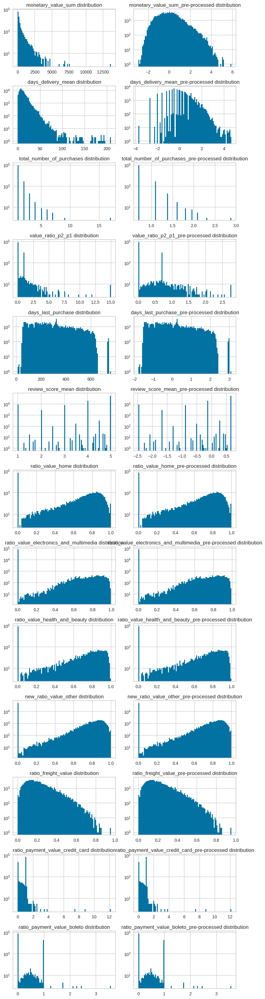

In [12]:
fig, axs = plt.subplots(ncols=2, nrows=X.shape[1], figsize=(8, 13 * 2.5))
for n, ax in enumerate(axs):
    X_col = X.iloc[:, n]
    Xpp_col = Xpp.iloc[:, n]
    ax[0].hist(X_col, bins=100, log=True)
    ax[0].set_title(f'{X_col.name} distribution')
    ax[1].hist(Xpp_col, bins=100, log=True)
    ax[1].set_title(f'{Xpp_col.name} distribution')
plt.tight_layout()
plt.show()    

Satisfying distribution, except for the last two which should not have value over 1.

Some explanations are canceled orders for which payment values was not put to 0, or payment installments which make the customer to pay more than the order cost itself.

That's why I am going to filter for now those values as there are very few. 

In [8]:
Xpp.query('ratio_payment_value_credit_card_pre_processed > 1.5')

,monetary_value_sum_pre_processed,days_delivery_mean_pre_processed,total_number_of_purchases_pre_processed,value_ratio_p2_p1_pre_processed,days_last_purchase_pre_processed,review_score_mean_pre_processed,ratio_value_home_pre_processed,ratio_value_electronics_and_multimedia_pre_processed,ratio_value_health_and_beauty_pre_processed,new_ratio_value_other_pre_processed,ratio_freight_value_pre_processed,ratio_payment_value_credit_card_pre_processed,ratio_payment_value_boleto_pre_processed
customer_unique_id,,,,,,,,,,,,,
043aee247e71edff7045664609f4d806,1.579754,-0.108798,1.386294,0.000000,1.113430,0.142692,0.887127,0.00000,0.000000,0.000000,0.112873,1.703263,0.0
073037acc049d2be44730a7e39836046,-0.500539,-1.198681,1.098612,0.000000,0.104338,-1.293914,0.871513,0.00000,0.000000,0.000000,0.128487,3.008450,0.0
0a5fab743da859b3f10a409bbb132a5a,-1.434219,0.420261,1.098612,0.000000,-0.269157,-0.902112,0.000000,0.00000,0.579252,0.000000,0.420748,7.555491,0.0
0bbb42a9ca8179ccfce14a11d2afe6de,-1.819651,0.303736,1.098612,0.000000,-1.140645,-0.510311,0.396000,0.00000,0.000000,0.000000,0.604000,2.125200,0.0
10d5890ed5e7ec78a7db23b5ac579b17,-1.161026,-0.669622,1.098612,2.772589,-1.317564,-1.293914,0.000000,0.64657,0.000000,0.000000,0.353430,3.445599,0.0
1ba713c8258f756279a049018ce01177,1.512259,0.303736,1.098612,0.000000,-0.046370,-0.902112,0.905893,0.00000,0.000000,0.000000,0.094107,1.547522,0.0
2844216d0982f6ced6f8cb8c2ede4136,-1.772986,-0.459662,1.098612,0.000000,1.198613,-2.469318,0.000000,0.00000,0.000000,0.419231,0.580769,3.803846,0.0
29dc4aeff866d6a940c471a3ea4faef0,-0.528007,0.041065,1.098612,0.000000,1.617975,0.665094,0.000000,0.00000,0.000000,0.821674,0.178326,2.000000,0.0
5192c897072033288df55bd01b0e5737,0.927338,-0.274463,1.098612,2.772589,-1.304459,-0.510311,0.000000,0.00000,0.000000,0.917162,0.082838,1.965784,0.0


X shape :(93322, 13)
Xpp shape :(93322, 13)


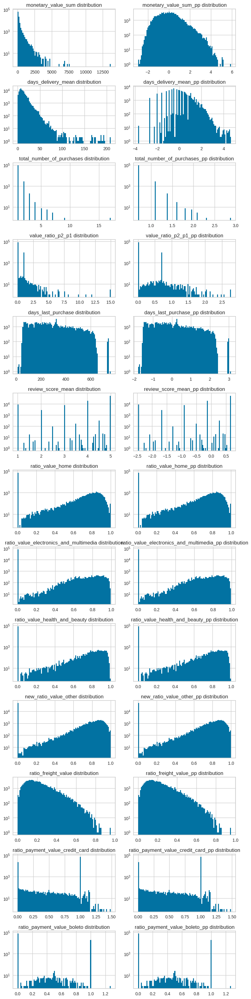

In [9]:
# Pre-processing
X = (clients[all_fts]
     .dropna(axis=0)
     .copy()
     .query('ratio_payment_value_credit_card < 1.5')
     .query('ratio_payment_value_boleto < 1.5'))

print(f'X shape :{X.shape}')
Xpp = pre_processor.fit_transform(X)
Xpp = pd.DataFrame(Xpp,
                   index=X.index,
                   columns=[fts + '_pp' for fts in all_fts])
print(f'Xpp shape :{Xpp.shape}')

# Sampling for computation time and checking 
# if RFM classes are well represented.
n_samples = 10_000
Xspp = Xpp.sample(n_samples)
Xs = X.loc[Xspp.index, :]

# Plotting distributions
fig, axs = plt.subplots(ncols=2, nrows=X.shape[1], figsize=(8, 13*2.5))
for n, ax in enumerate(axs):
    X_col = X.iloc[:, n]
    Xpp_col = Xpp.iloc[:, n]
    ax[0].hist(X_col, bins=100, log=True)
    ax[0].set_title(f'{X_col.name} distribution')
    ax[1].hist(Xpp_col, bins=100, log=True)
    ax[1].set_title(f'{Xpp_col.name} distribution')
plt.tight_layout()
plt.show()    

## 1.2.  [&#9650;](#toc0_) <a id='toc1_2_'></a>t-SNE (finding the right perplexity and guessing the underlying manifold?)

### 1.2.1.  [&#9650;](#toc0_) <a id='toc1_2_1_'></a>On the full dataset sample Xs

15
30
50
70
85
100


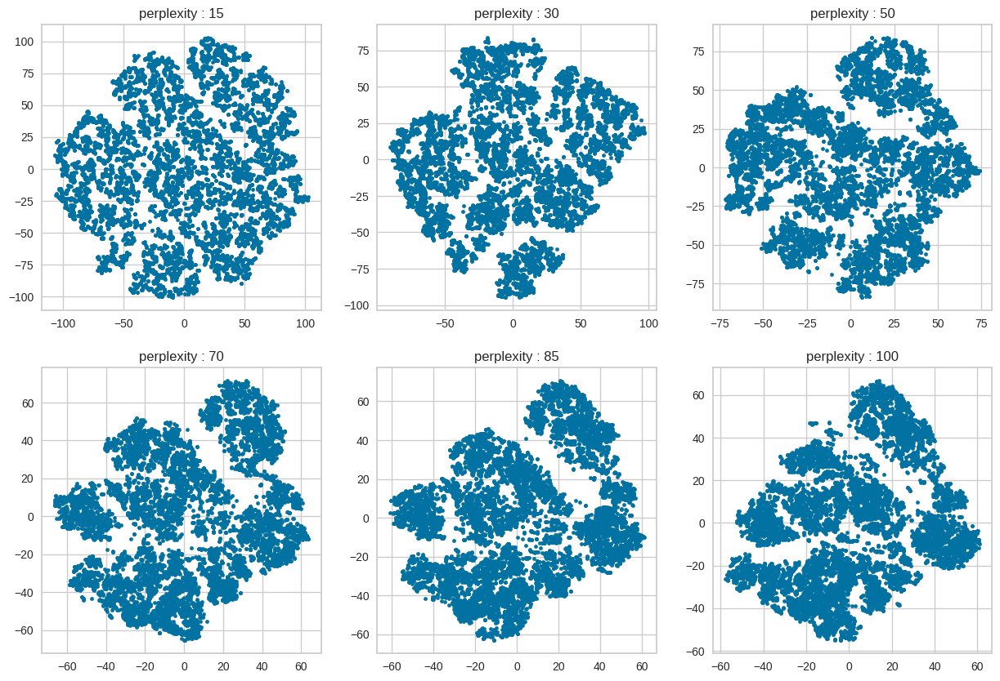

In [28]:
# Plotting results for several perplexities
fig, axes = plt.subplots(2,3, figsize=(15,10))
perplexities = [15, 30, 50, 70, 85, 100]
for perplexity, ax in zip(perplexities, axes.flat):
    print(perplexity)
    tsne = TSNE(n_components=2, perplexity=perplexity)
    Xs_2d = tsne.fit_transform(Xspp)
    ax.scatter(Xs_2d[:, 0], Xs_2d[:, 1], marker='o', s=10)
    ax.set_title(f'perplexity : {perplexity}')
plt.show()    

A nice value for the perplexity here seems to be 85. If what is revealed is correct, we might have 2 main clusters, then one 'denser' cluster, and some very little clusters in margin.

In [ ]:
X_embedded = TSNE(n_components=2, perplexity=85, n_jobs=-1).fit_transform(Xspp)
X_embedded = pd.DataFrame(X_embedded,
                          index=Xs.index,
                          columns=['x','y'])
X_embedded['segment'] = Xs.segment

## 1.3.  [&#9650;](#toc0_) <a id='toc1_3_'></a>t-SNE and PCA dimensionality reduction of Xspp

In [10]:
pca = PCA()
pca.fit(Xpp)
Xspp_pca = pca.transform(Xspp)

tsne = TSNE(n_components=2, perplexity=85)
Xspp_tsne = tsne.fit_transform(Xspp) 

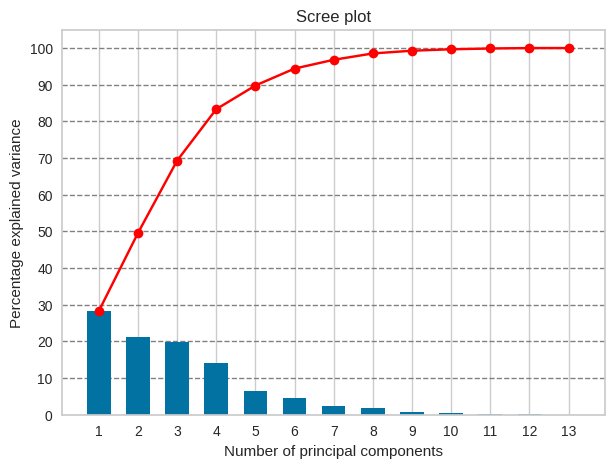

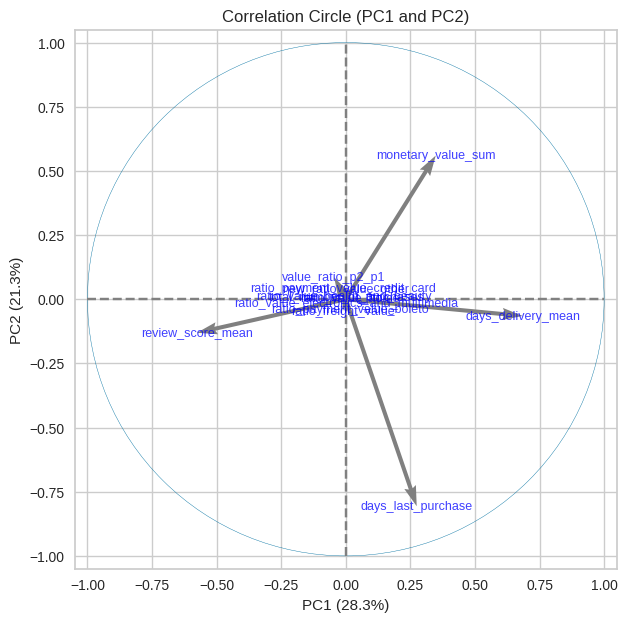

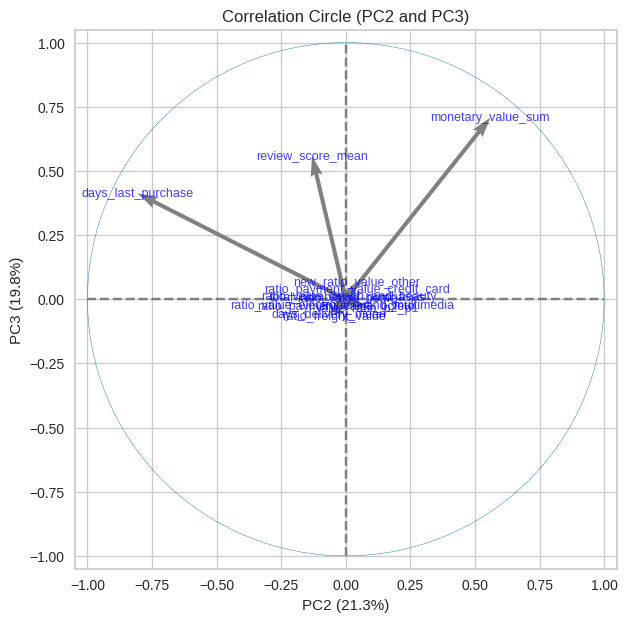

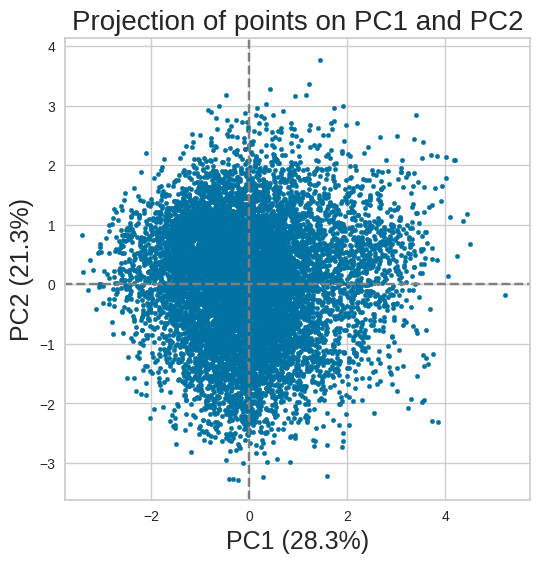

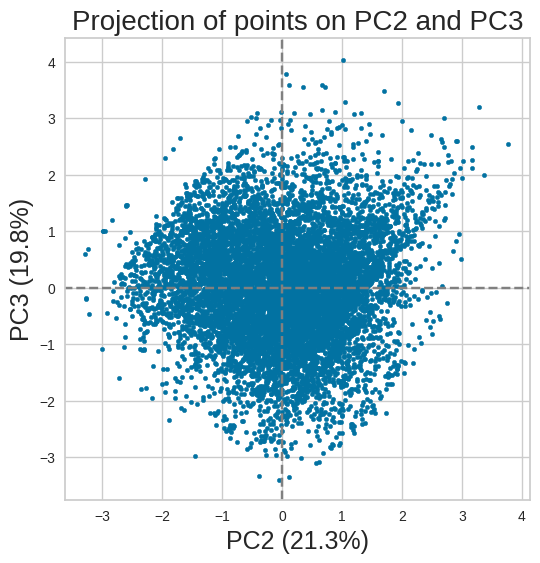

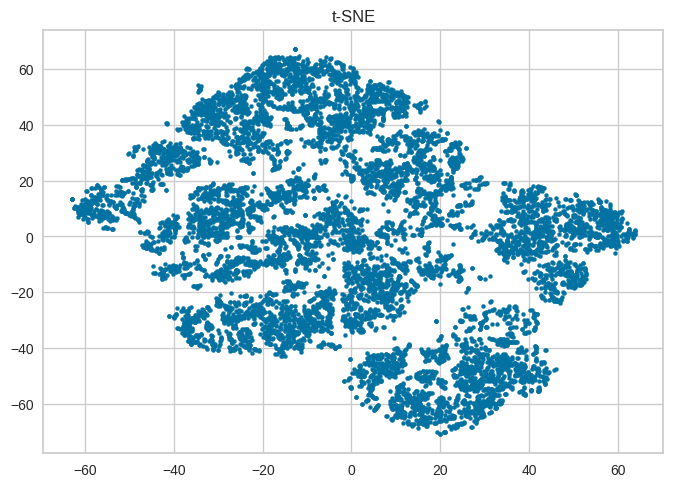

In [11]:
ds.display_scree_plot(pca)
ds.display_correlation_circle(pca, (0, 1), all_fts)
ds.display_correlation_circle(pca, (1, 2), all_fts)
ds.display_factorial_plane_projection(Xspp_pca, pca, (0, 1))
ds.display_factorial_plane_projection(Xspp_pca, pca, (1, 2))
plt.scatter(Xspp_tsne[:,0], Xspp_tsne[:, 1], s=8)
plt.title('t-SNE')
plt.show()

## 1.4.  [&#9650;](#toc0_) <a id='toc1_4_'></a>OPTICS

min_sample : 5


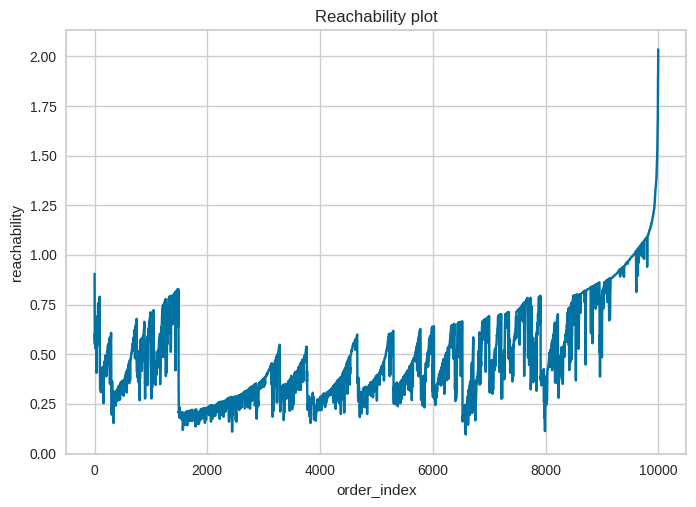

labels : [ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168]
min_sample : 10


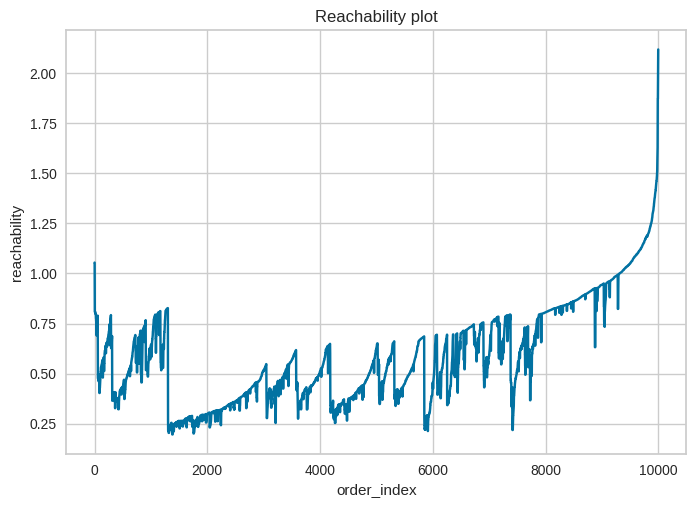

labels : [-1  0  1  2  3  4  5]
min_sample : 15


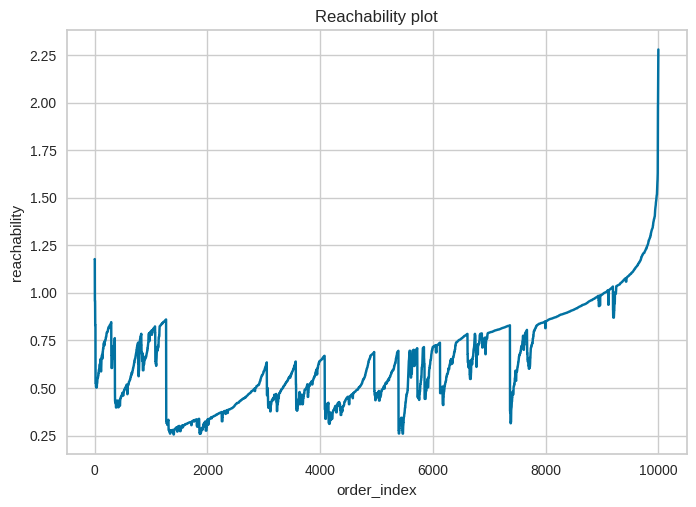

labels : [0]
min_sample : 20


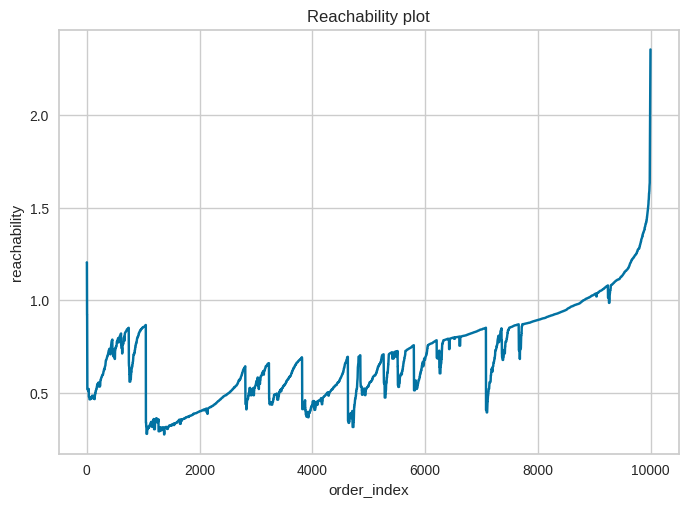

labels : [0]
min_sample : 25


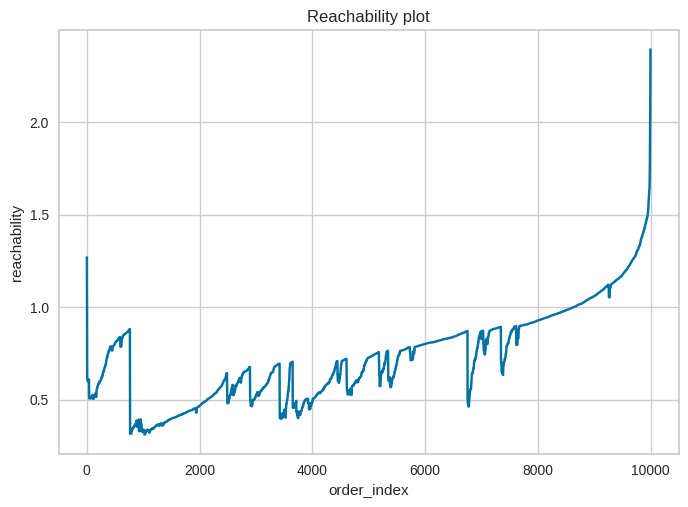

labels : [0]
min_sample : 30


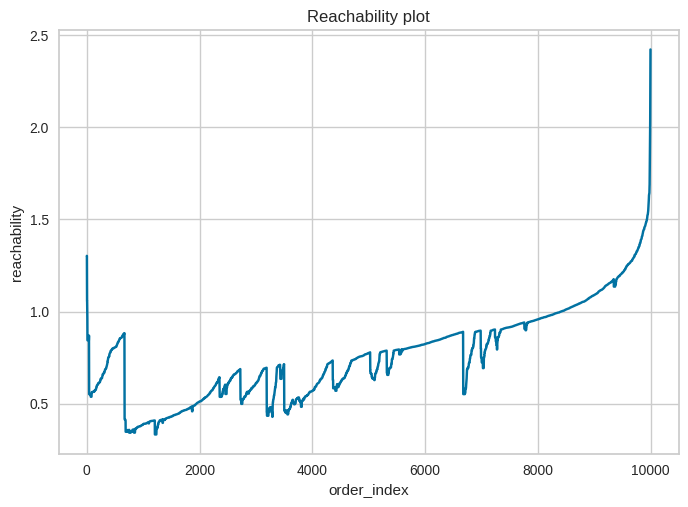

labels : [0]


In [31]:
for min_samples in [5, 10, 15, 20, 25, 30]:
    print(f'min_sample : {min_samples}')
    clusterer = OPTICS(min_samples=min_samples, xi=0.1, max_eps=10)
    clusterer.fit(Xspp)

    reachability = clusterer.reachability_[clusterer.ordering_]
    labels = clusterer.labels_[clusterer.ordering_]
    reach_df = pd.DataFrame({'reachability': reachability})
    reach_df = reach_df.reset_index(names='order_index')

    sns.lineplot(data=reach_df, x='order_index', y='reachability')
    plt.title('Reachability plot')
    plt.show()
    print(f'labels : {np.unique(labels)}')

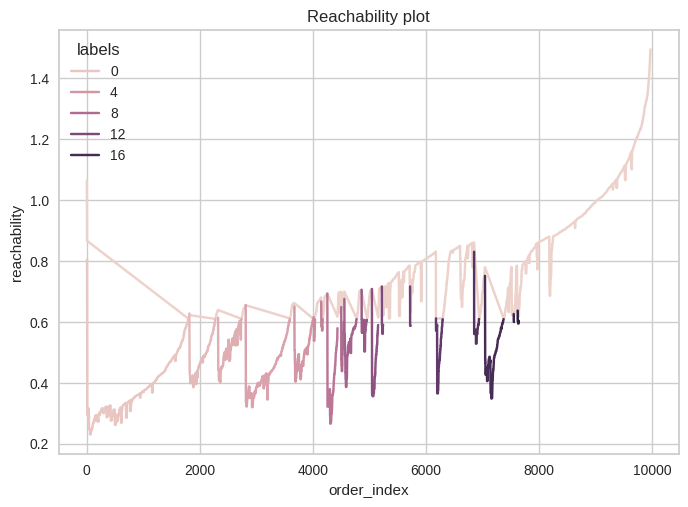

labels : [-1  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18]


In [19]:
clusterer = OPTICS(min_samples=15, max_eps=1.5,
                   cluster_method='dbscan', eps=0.61)
clusterer.fit(Xspp)

label_name = 'OPTICS'
Xs[label_name] = clusterer.labels_
reachability = clusterer.reachability_[clusterer.ordering_]
labels = clusterer.labels_[clusterer.ordering_]
reach_df = pd.DataFrame({'reachability': reachability,
                            'labels': labels})
reach_df = reach_df.reset_index(names='order_index')

sns.lineplot(data=reach_df,
                x='order_index', y='reachability', hue='labels')
plt.title('Reachability plot')
plt.show()
print(f'labels : {np.unique(labels)}')

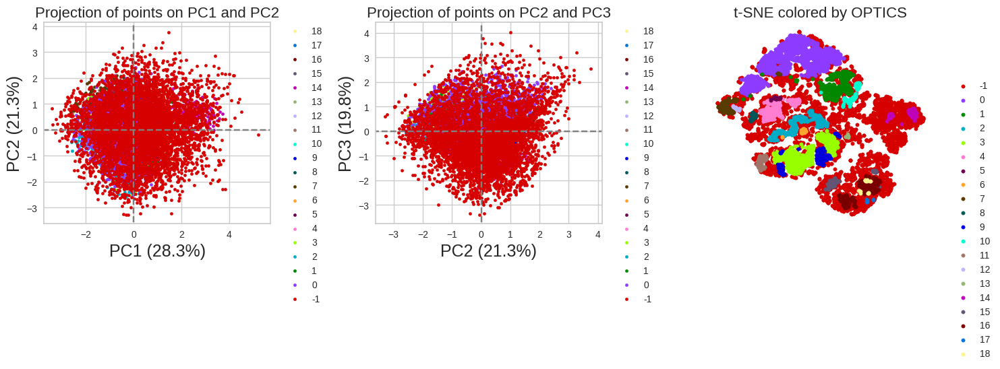

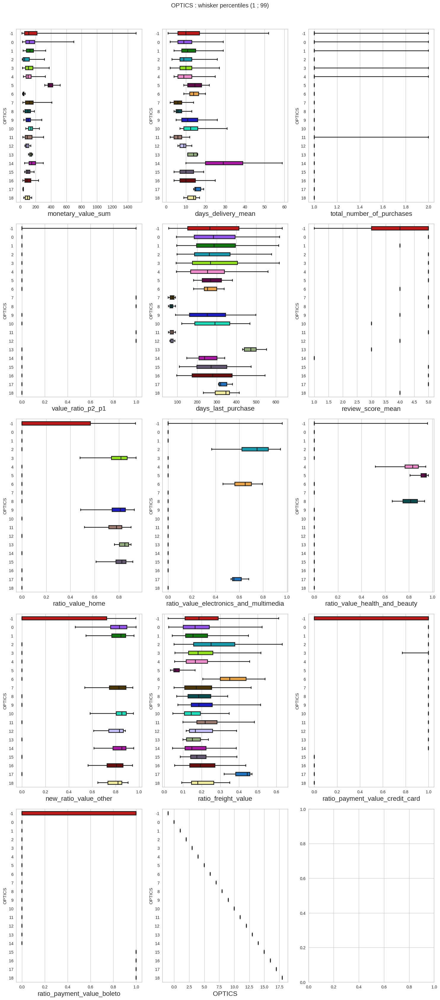

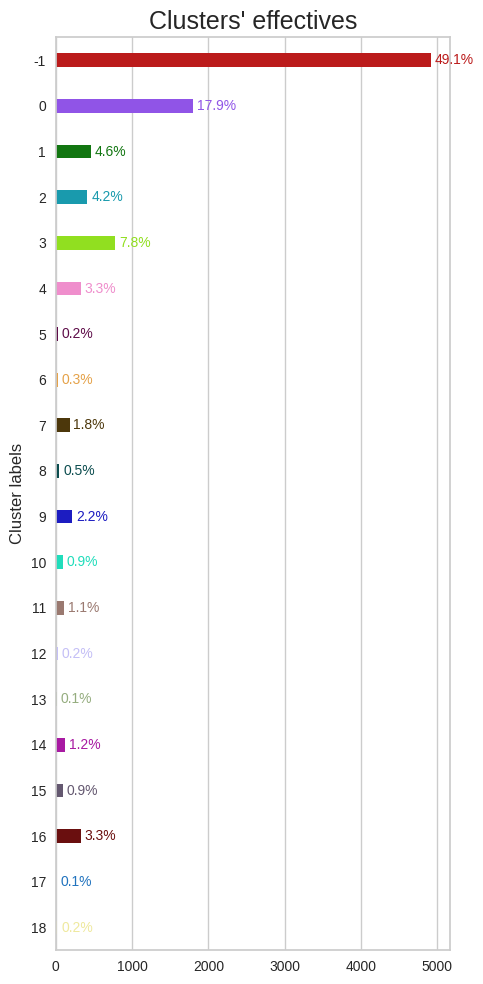

In [13]:
for label_name in ['OPTICS']:
    ds.display_clusters_in_pca_space_and_tsne_embedding(Xspp_pca,
                                                        pca,
                                                        Xspp_tsne,
                                                        Xs[label_name],
                                                        label_name)
    
    ds.display_clusters_comparison(Xs[[*all_fts, label_name]],
                                   label_name, layout=(5, 3))

Here, it is slightly better than what we had in the 2 previous sections but 50% of the dataset remains unclassified (considered as noisy: -1). There is no way to fix this or to consider an higher eps which would induce only one cluster.

Clusters are not spread on the t-SNE.

## 1.5.  [&#9650;](#toc0_) <a id='toc1_5_'></a>Kmeans

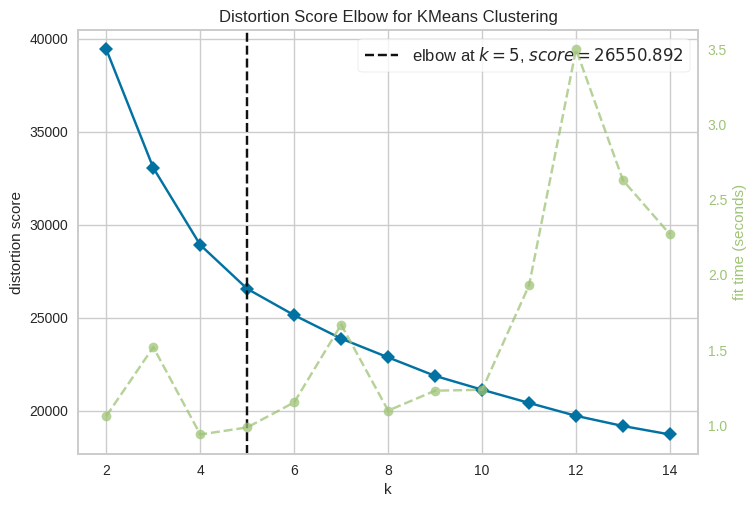

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [38]:
elbow = KElbowVisualizer(KMeans(n_init=10), k=(2,15))
elbow.fit(Xspp)
elbow.show()

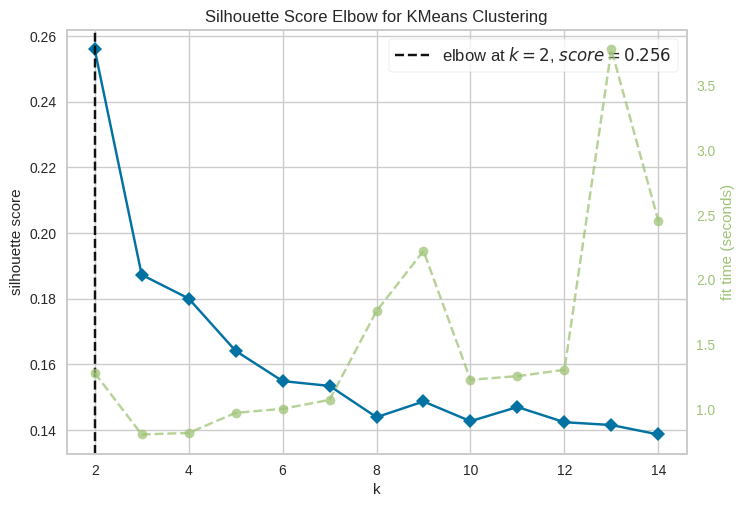

<AxesSubplot: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [36]:
elbow = KElbowVisualizer(KMeans(n_init=10), k=(2, 15), metric='silhouette')
elbow.fit(Xspp)
elbow.show()

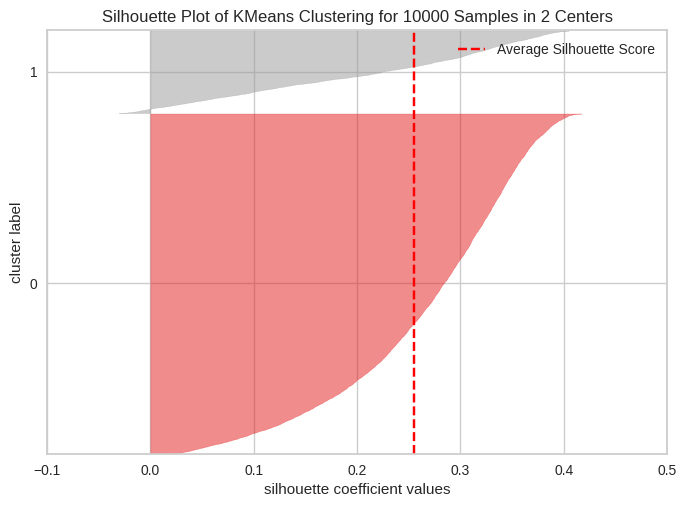

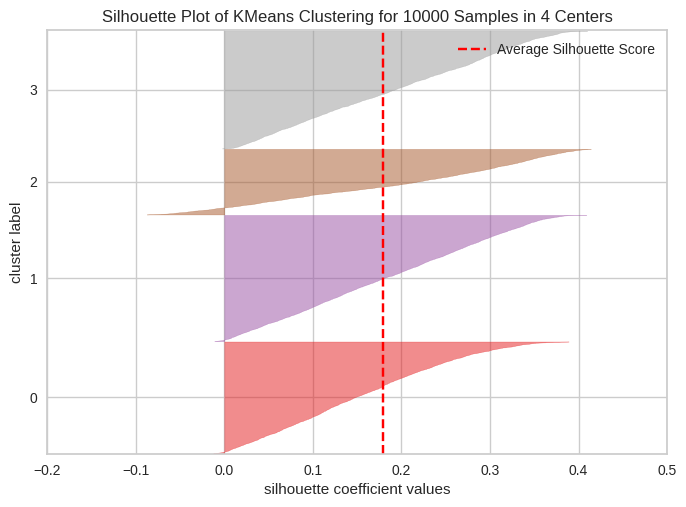

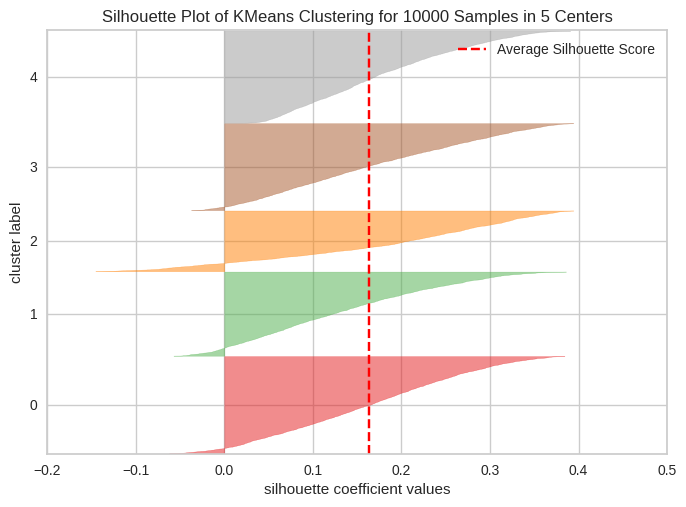

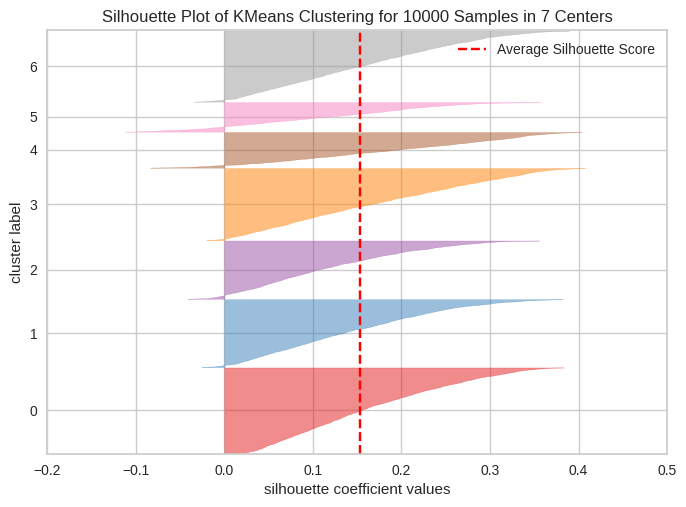

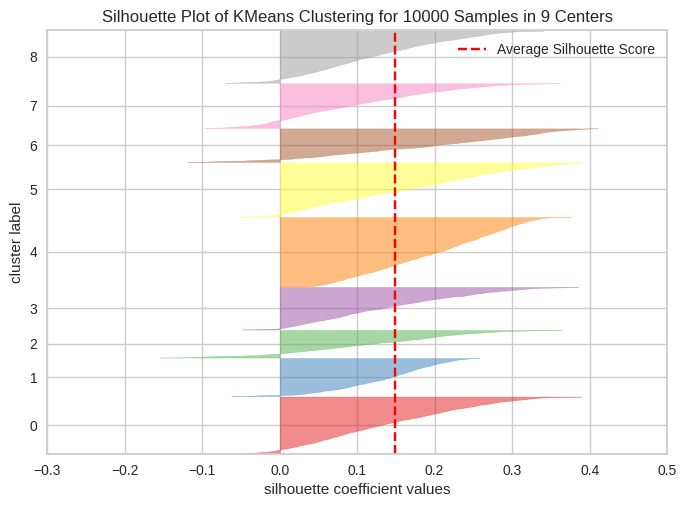

In [9]:
# Display silhouettes values per clusters
# for the best candidates for k.
for n_clusters in [2, 4, 5, 7, 9]:
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    vis = SilhouetteVisualizer(kmeans)
    vis.fit(Xspp)
    vis.show()

In [11]:
kmeans = dict()
kmeans_label_names = []
ks = [2, 3, 4, 5, 6, 7, 9, 11]
for k in ks:
    label_name = 'Kmeans_' + str(k) + 'g'
    kmeans_label_names.append(label_name)
    print(label_name)
    kmeans[k] = KMeans(n_clusters=k, n_init=10)
    # Add labels as columns in X
    X.loc[:, label_name] = kmeans[k].fit_predict(Xpp)

Kmeans_2g
Kmeans_3g
Kmeans_4g
Kmeans_5g
Kmeans_6g
Kmeans_7g
Kmeans_9g
Kmeans_11g


In [12]:
Xs.columns

Index(['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases',
       'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean',
       'ratio_value_home', 'ratio_value_electronics_and_multimedia',
       'ratio_value_health_and_beauty', 'new_ratio_value_other',
       'ratio_freight_value', 'ratio_payment_value_credit_card',
       'ratio_payment_value_boleto'],
      dtype='object')

In [13]:
# Save centroids
ks = [2, 3, 4, 5, 6, 7, 9, 11]
centroids_pp_space = dict()
for k in ks:
    centroids_pp_space[k] = kmeans[k].cluster_centers_

# Results from X in Xs
# Xs = Xs.merge(X, how='left', on='customer_unique_id', validate='1:1')
Xs = X.loc[Xs.index, :]

In [14]:
Xs.columns

Index(['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases',
       'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean',
       'ratio_value_home', 'ratio_value_electronics_and_multimedia',
       'ratio_value_health_and_beauty', 'new_ratio_value_other',
       'ratio_freight_value', 'ratio_payment_value_credit_card',
       'ratio_payment_value_boleto', 'Kmeans_2g', 'Kmeans_3g', 'Kmeans_4g',
       'Kmeans_5g', 'Kmeans_6g', 'Kmeans_7g', 'Kmeans_9g', 'Kmeans_11g'],
      dtype='object')

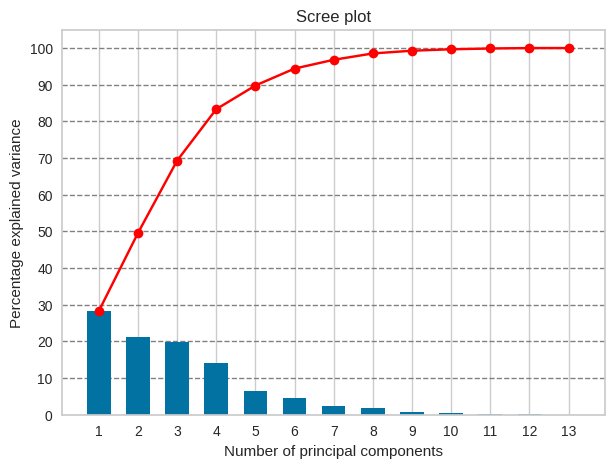

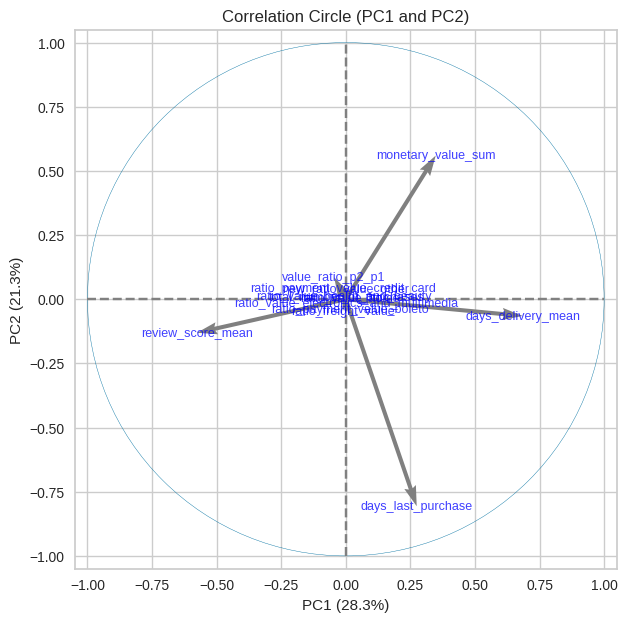

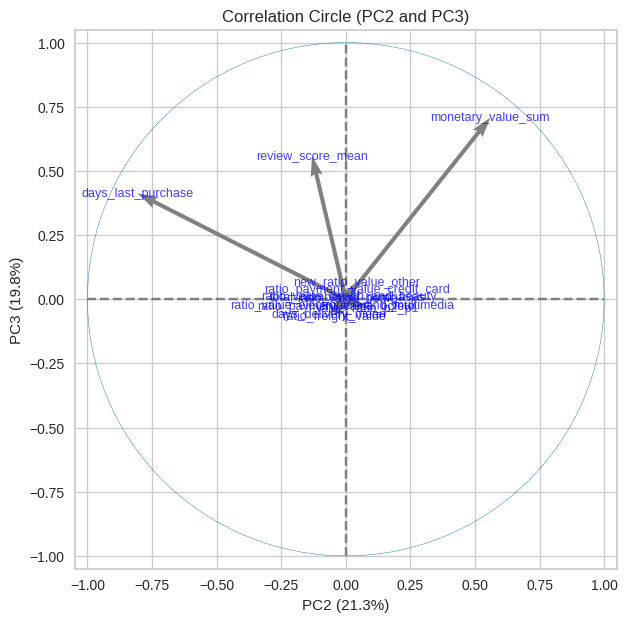

*************
Kmeans_2g


/home/louberehc/miniconda3/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


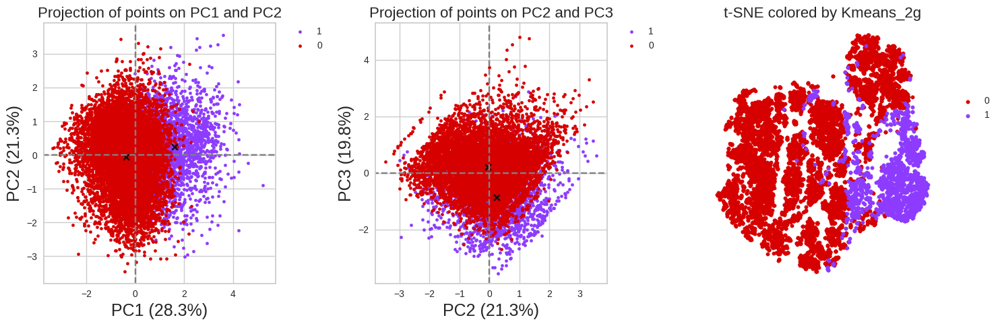

['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases', 'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean', 'ratio_value_home', 'ratio_value_electronics_and_multimedia', 'ratio_value_health_and_beauty', 'new_ratio_value_other', 'ratio_freight_value', 'ratio_payment_value_credit_card', 'ratio_payment_value_boleto', 'Kmeans_2g']


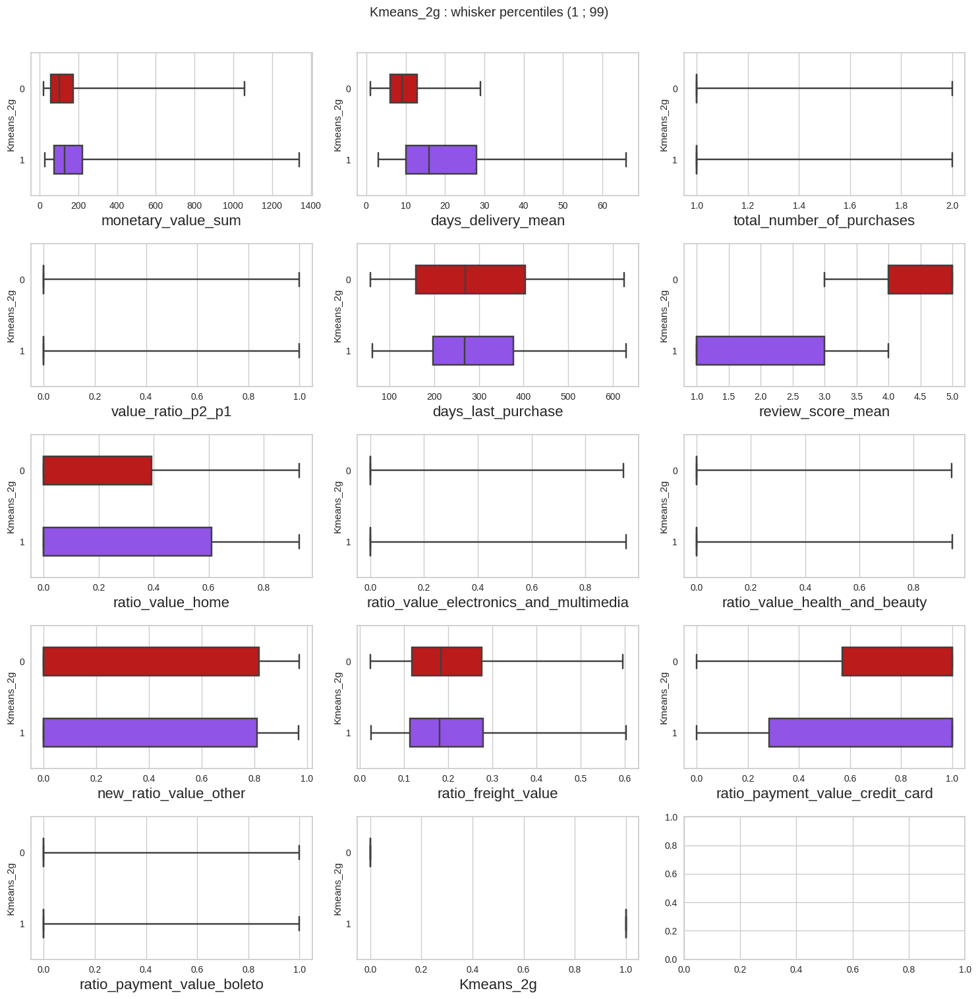

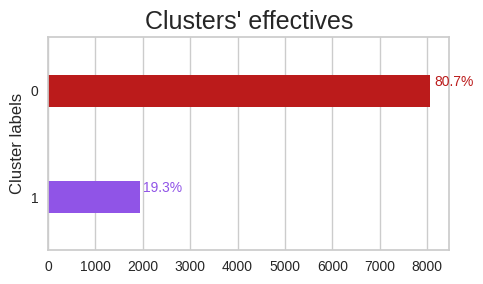

*************
Kmeans_3g


/home/louberehc/miniconda3/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


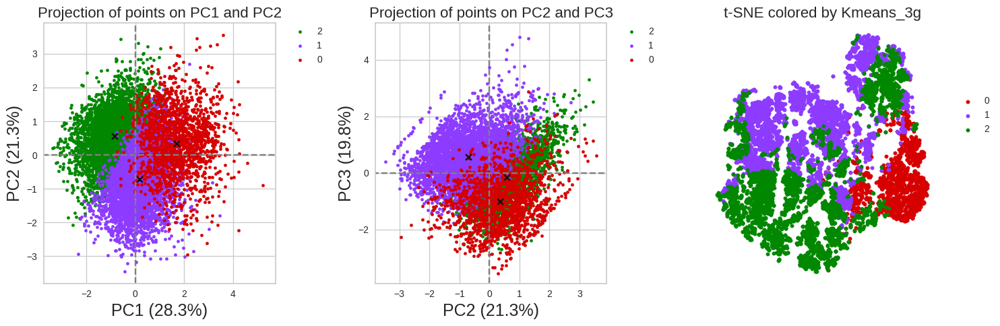

['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases', 'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean', 'ratio_value_home', 'ratio_value_electronics_and_multimedia', 'ratio_value_health_and_beauty', 'new_ratio_value_other', 'ratio_freight_value', 'ratio_payment_value_credit_card', 'ratio_payment_value_boleto', 'Kmeans_3g']


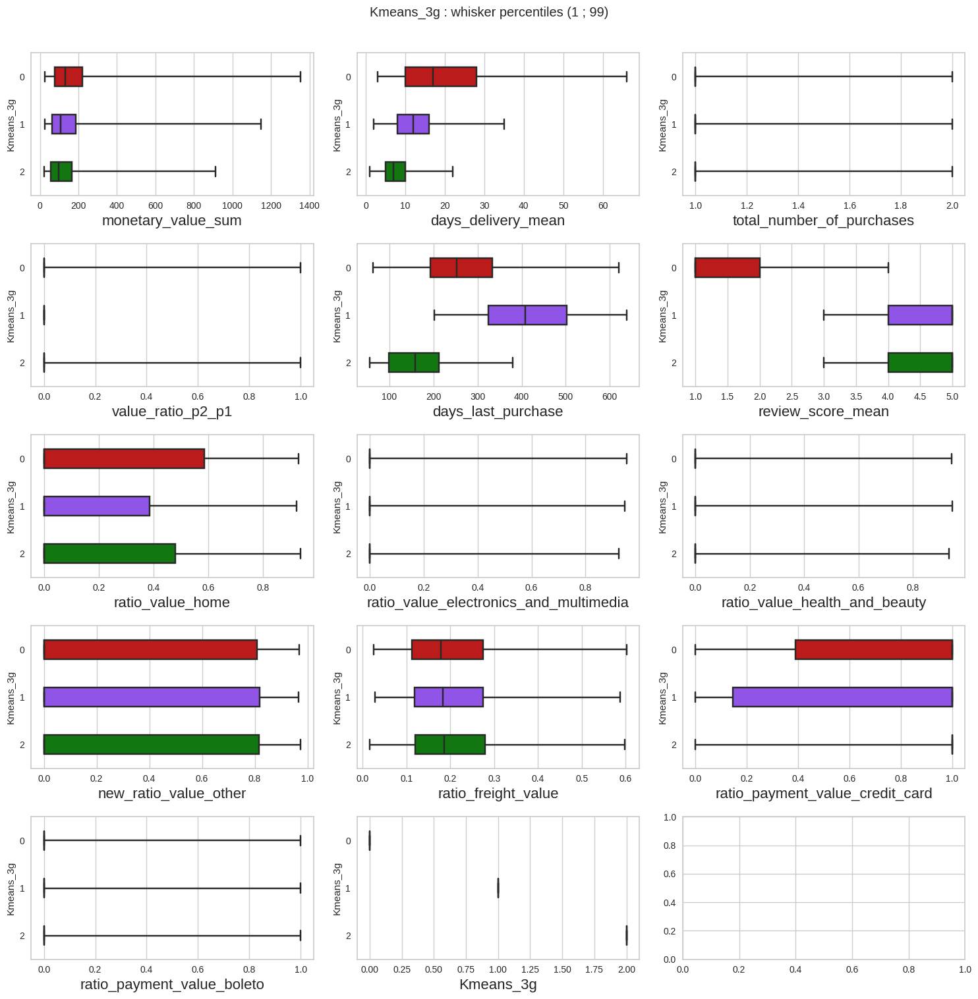

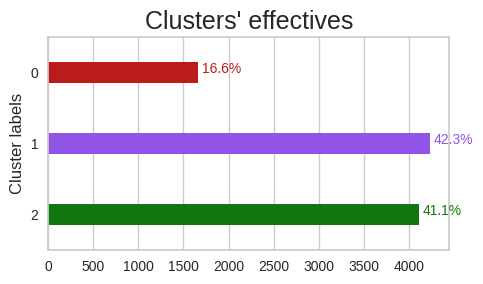

*************
Kmeans_4g


/home/louberehc/miniconda3/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


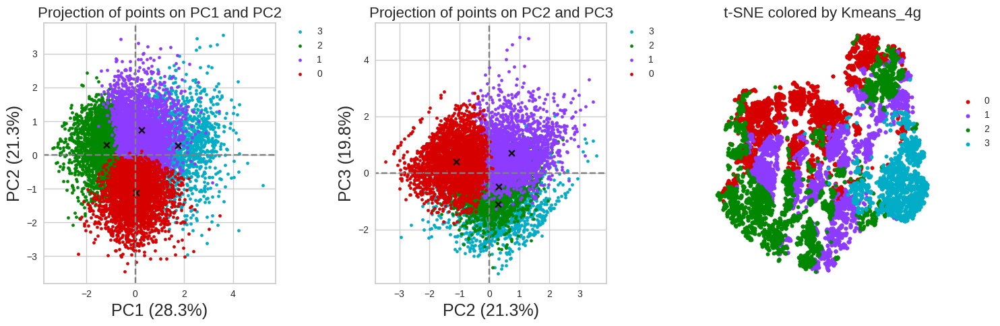

['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases', 'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean', 'ratio_value_home', 'ratio_value_electronics_and_multimedia', 'ratio_value_health_and_beauty', 'new_ratio_value_other', 'ratio_freight_value', 'ratio_payment_value_credit_card', 'ratio_payment_value_boleto', 'Kmeans_4g']


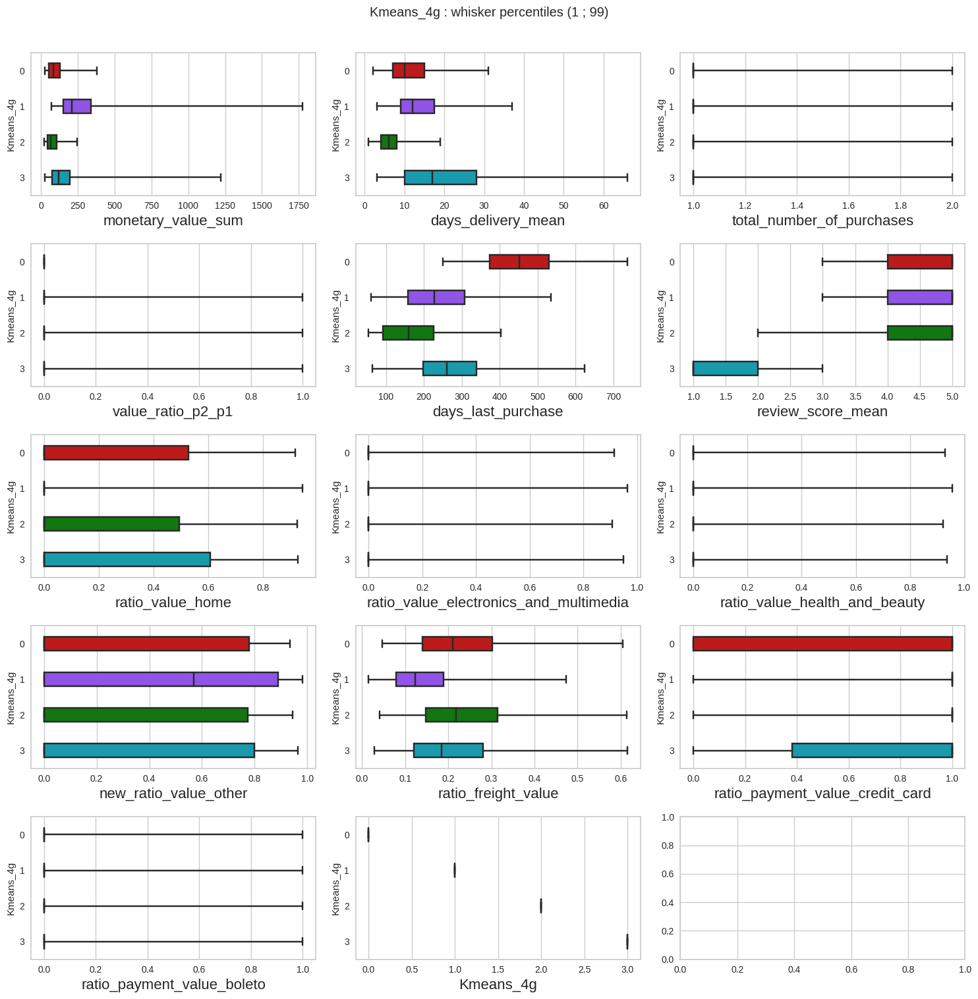

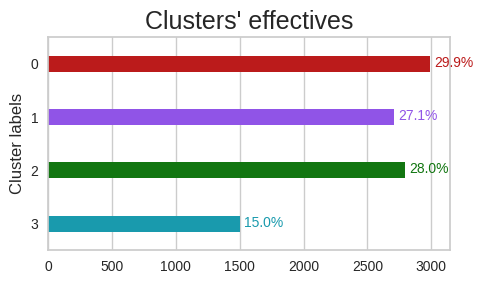

*************
Kmeans_5g


/home/louberehc/miniconda3/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


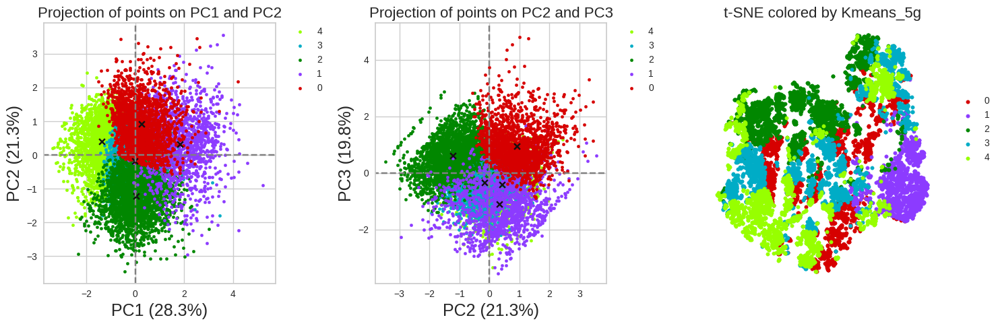

['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases', 'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean', 'ratio_value_home', 'ratio_value_electronics_and_multimedia', 'ratio_value_health_and_beauty', 'new_ratio_value_other', 'ratio_freight_value', 'ratio_payment_value_credit_card', 'ratio_payment_value_boleto', 'Kmeans_5g']


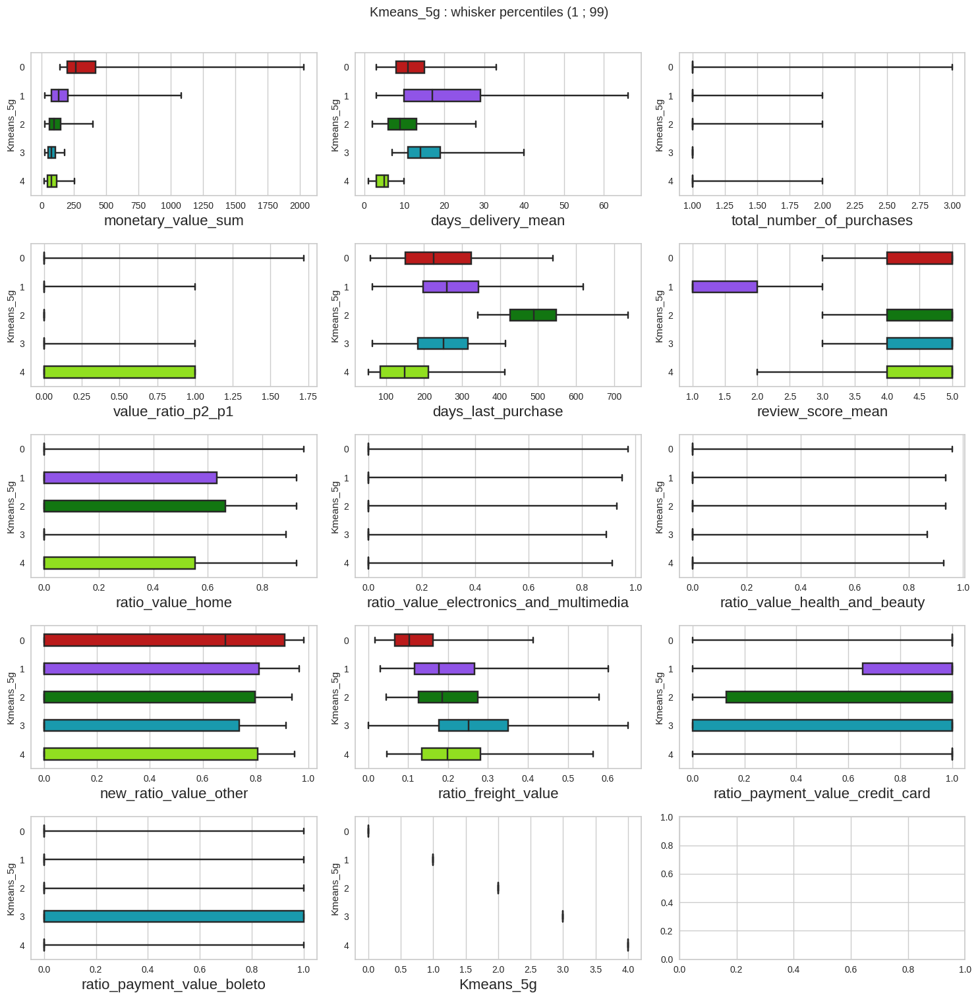

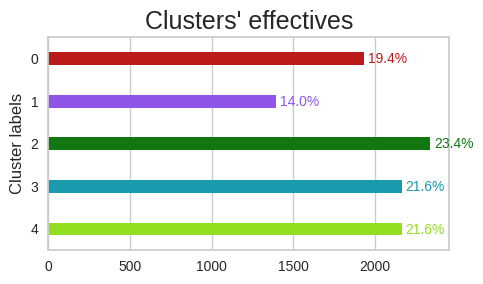

*************
Kmeans_6g


/home/louberehc/miniconda3/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


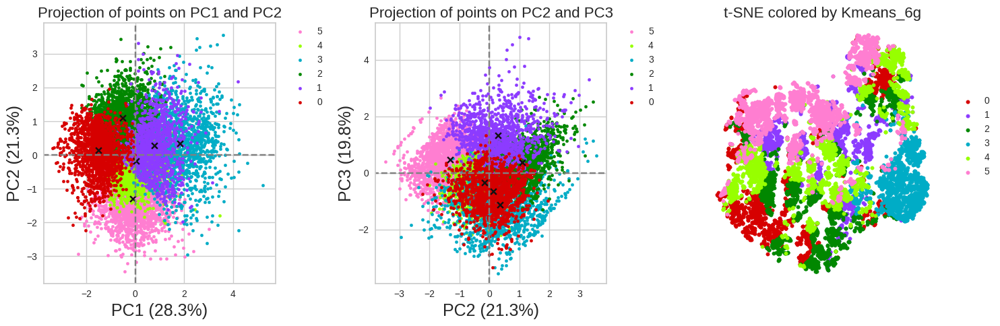

['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases', 'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean', 'ratio_value_home', 'ratio_value_electronics_and_multimedia', 'ratio_value_health_and_beauty', 'new_ratio_value_other', 'ratio_freight_value', 'ratio_payment_value_credit_card', 'ratio_payment_value_boleto', 'Kmeans_6g']


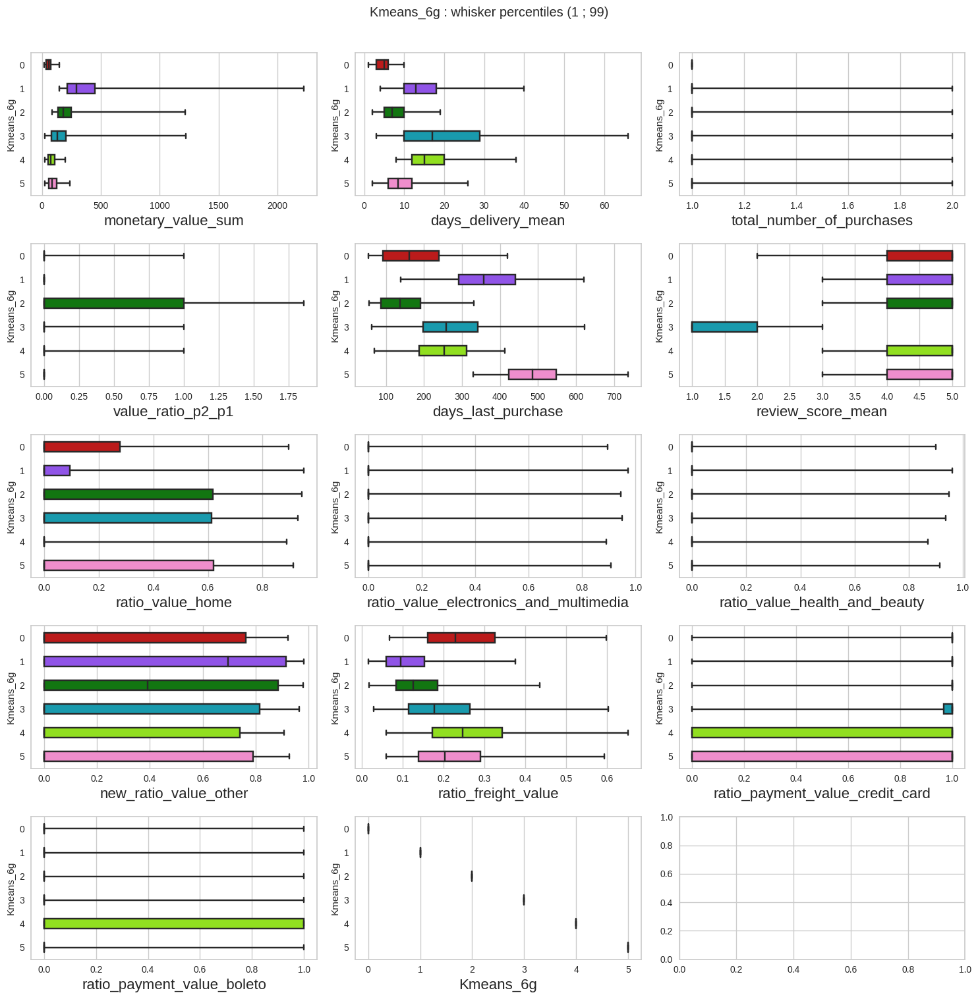

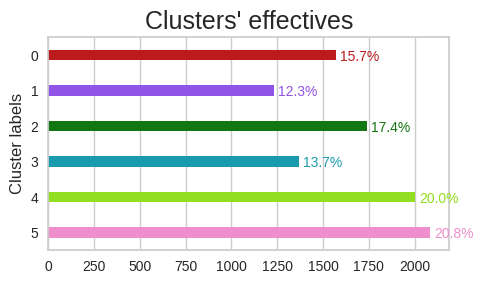

*************
Kmeans_7g


/home/louberehc/miniconda3/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


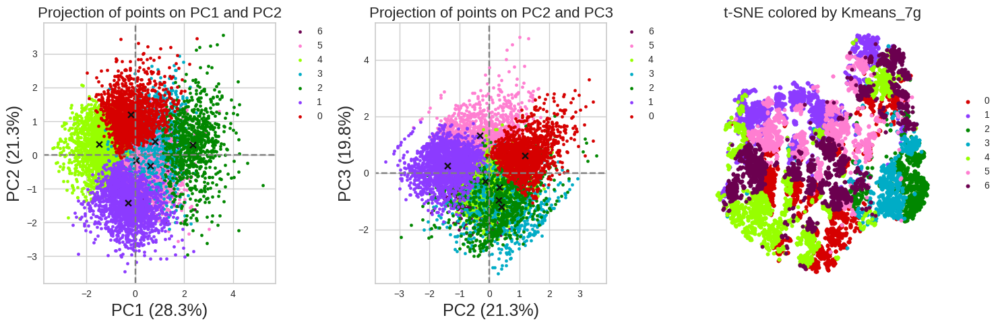

['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases', 'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean', 'ratio_value_home', 'ratio_value_electronics_and_multimedia', 'ratio_value_health_and_beauty', 'new_ratio_value_other', 'ratio_freight_value', 'ratio_payment_value_credit_card', 'ratio_payment_value_boleto', 'Kmeans_7g']


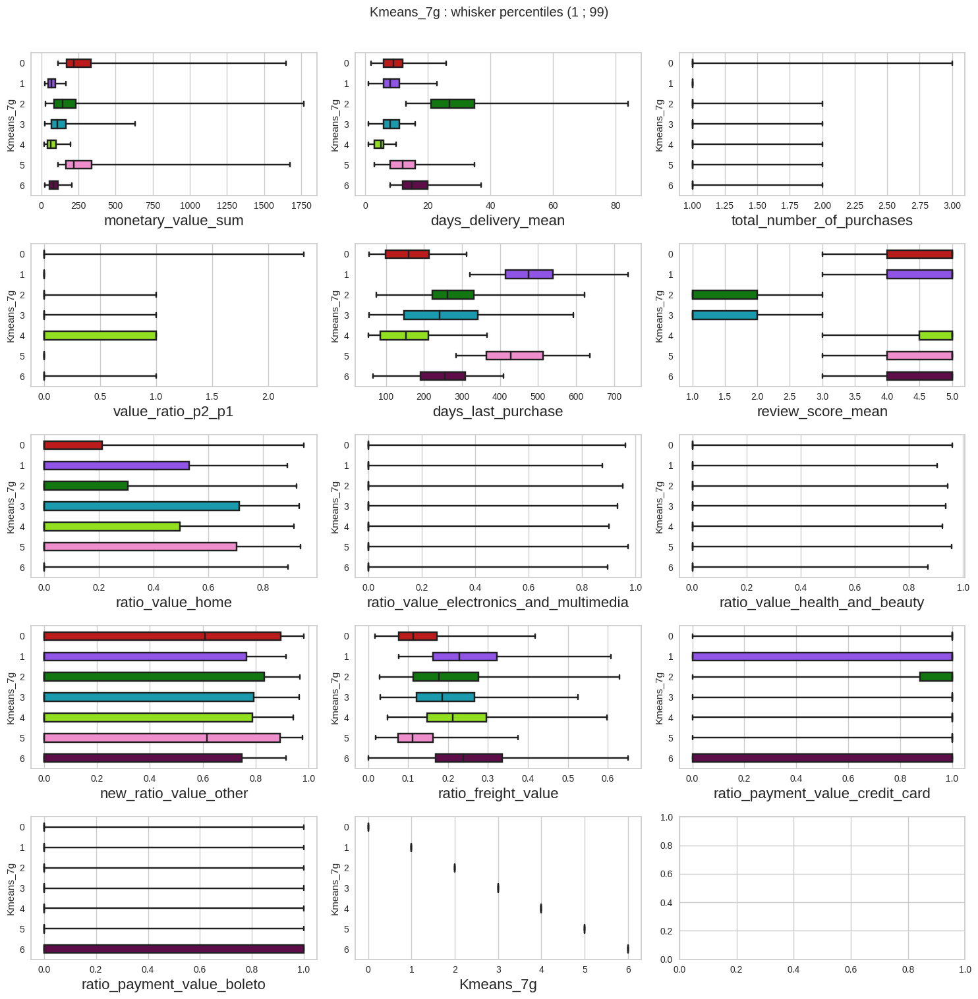

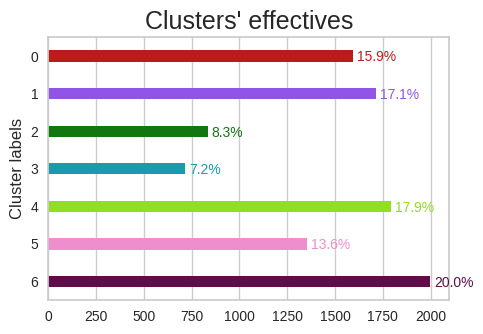

*************
Kmeans_9g


/home/louberehc/miniconda3/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


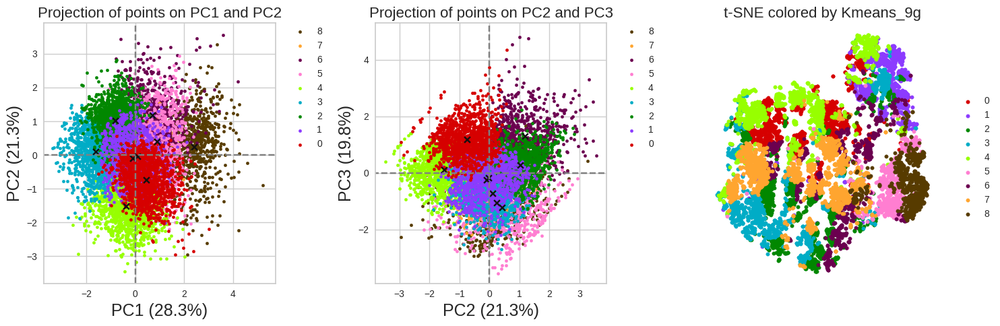

['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases', 'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean', 'ratio_value_home', 'ratio_value_electronics_and_multimedia', 'ratio_value_health_and_beauty', 'new_ratio_value_other', 'ratio_freight_value', 'ratio_payment_value_credit_card', 'ratio_payment_value_boleto', 'Kmeans_9g']


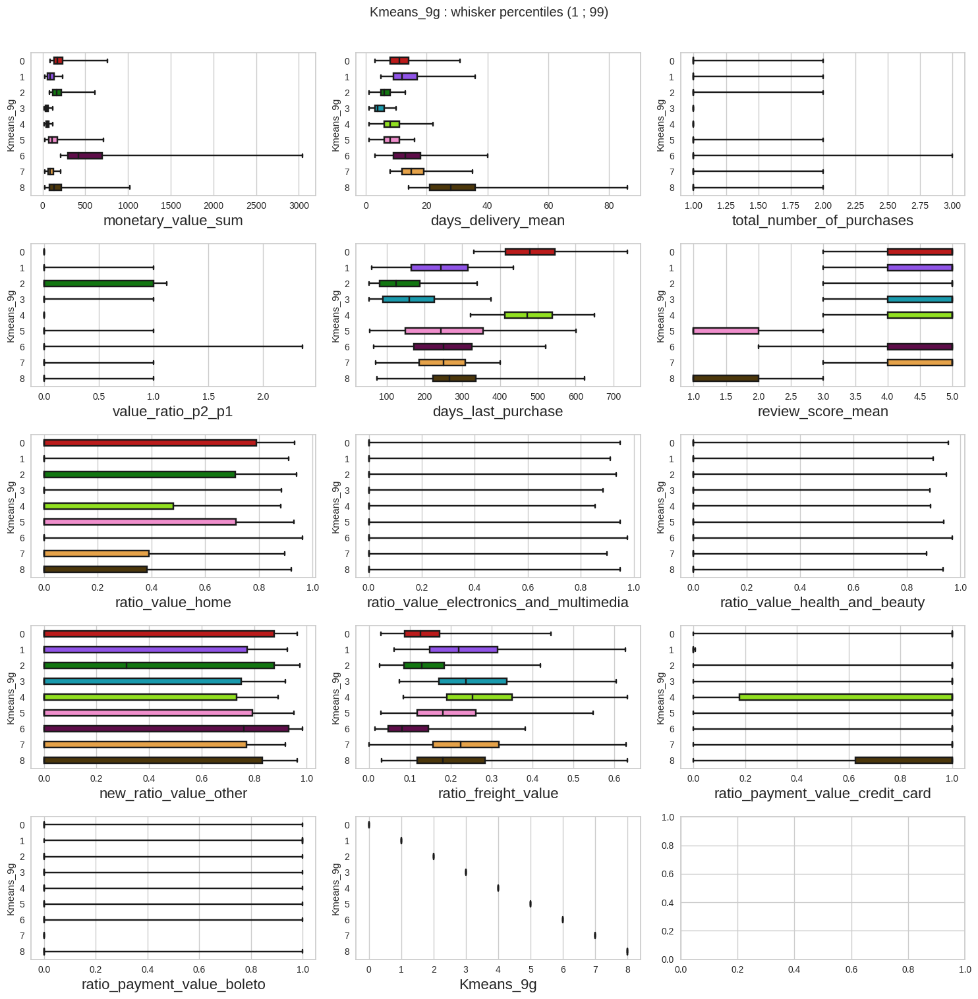

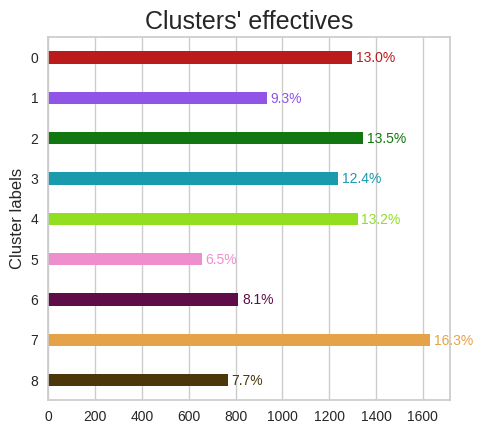

*************
Kmeans_11g


/home/louberehc/miniconda3/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


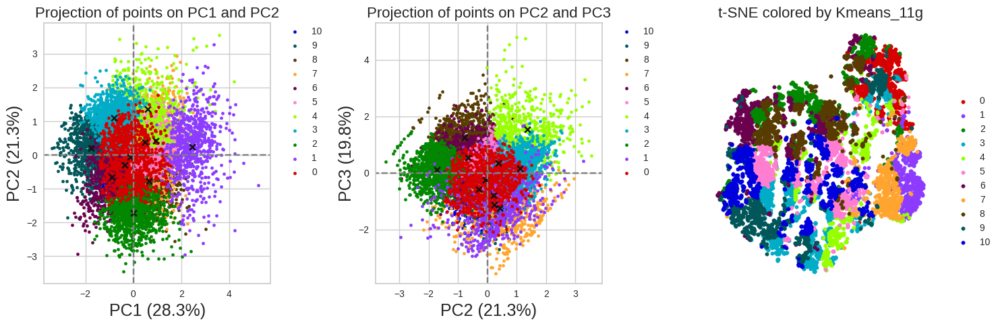

['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases', 'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean', 'ratio_value_home', 'ratio_value_electronics_and_multimedia', 'ratio_value_health_and_beauty', 'new_ratio_value_other', 'ratio_freight_value', 'ratio_payment_value_credit_card', 'ratio_payment_value_boleto', 'Kmeans_11g']


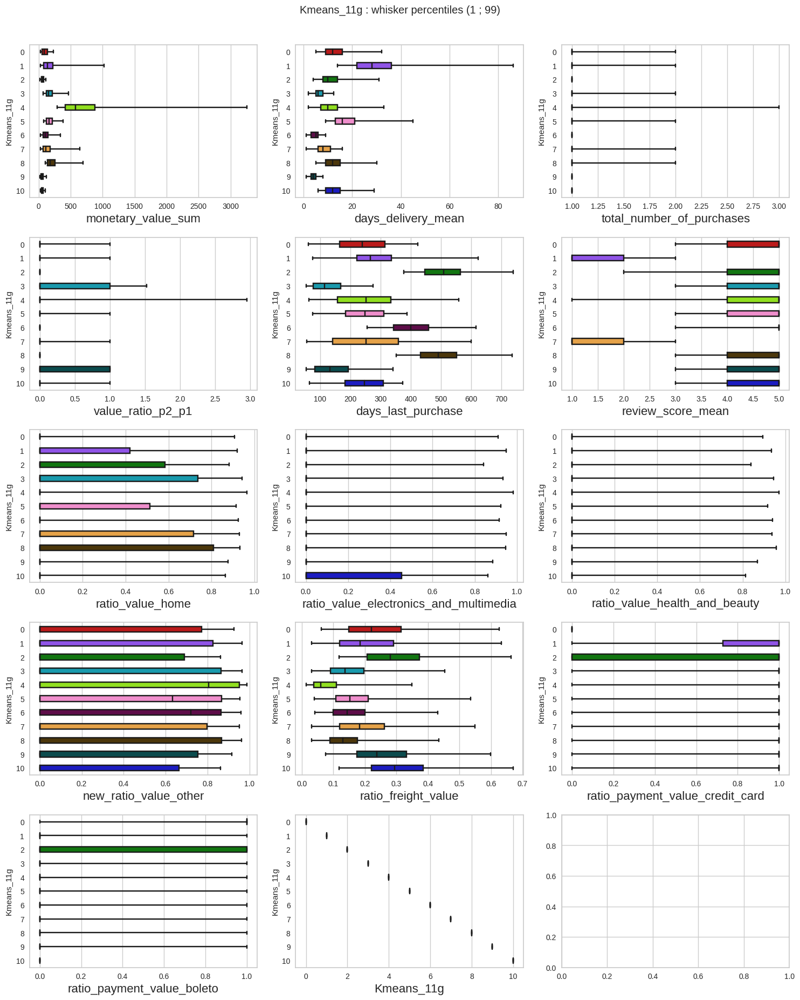

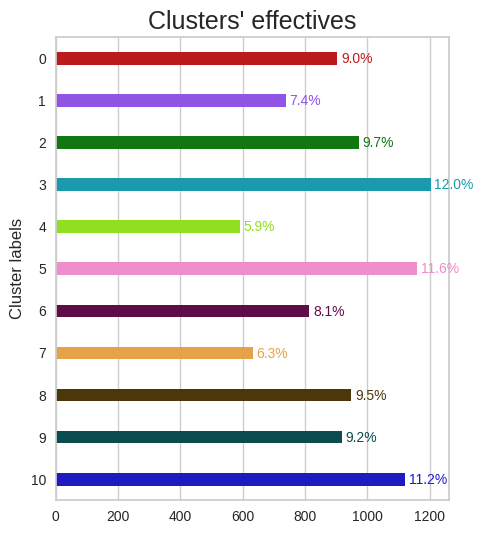

In [15]:
%matplotlib inline

ds.display_scree_plot(pca)
ds.display_correlation_circle(pca, (0, 1), all_fts)
ds.display_correlation_circle(pca, (1, 2), all_fts)

nr = (len(all_fts) // 3) + 1
for label_name in kmeans_label_names:
        print('*************')
        print(label_name)
        label_vec = Xs[label_name]
        # Extract the number of centroids from label_name
        k = int(label_name.split('_')[-1].rstrip('g'))
        ds.display_clusters_in_pca_space_and_tsne_embedding(
            Xspp_pca,
            pca,
            Xspp_tsne,
            label_vec,
            label_name,
            centroids=centroids_pp_space[k]
        )
        print([*all_fts, label_name])
        ds.display_clusters_comparison(Xs[[*all_fts, label_name]],
                                       label_name,
                                       layout=(nr, 3))

## 1.6.  [&#9650;](#toc0_) <a id='toc1_6_'></a>Hierarchical clustering (ward only)

/home/louberehc/miniconda3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


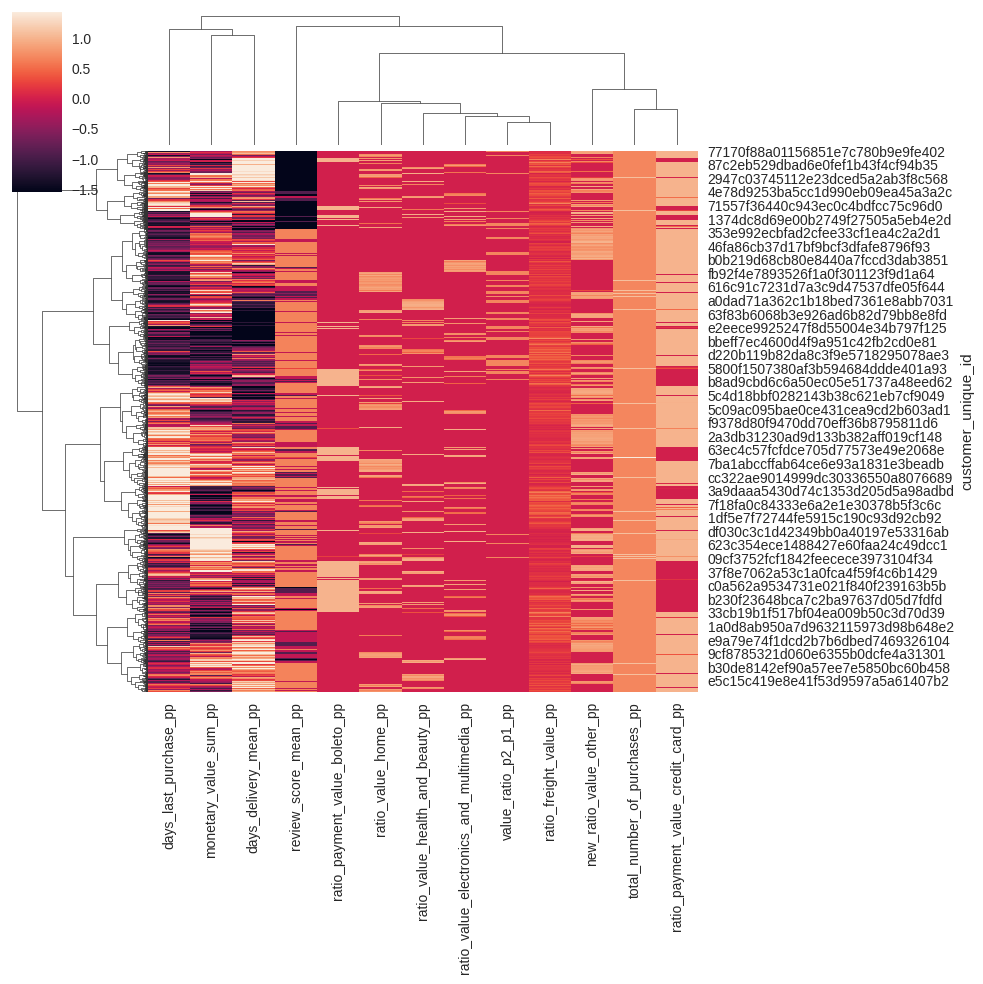

In [44]:
sns.clustermap(Xspp, method='ward', robust=True)
plt.show()

In [13]:
hierarchical_label_names = []
ks = [3, 4, 5, 6, 7, 8, 9, 10, 15]

for k in ks:
    label_name = 'hierarchical_ward_' + str(k) + 'g'
    hierarchical_label_names.append(label_name)
    print(label_name)
    clusterer = AgglomerativeClustering(linkage='ward',
                                        n_clusters=k)
    # Add labels as columns in Xs
    Xs.loc[:, label_name] = clusterer.fit_predict(Xspp)

hierarchical_ward_3g


In [60]:
Xs.columns

Index(['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases',
       'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean',
       'ratio_value_home', 'ratio_value_electronics_and_multimedia',
       'ratio_value_health_and_beauty', 'new_ratio_value_other',
       'ratio_freight_value', 'ratio_payment_value_credit_card',
       'ratio_payment_value_boleto', 'Kmeans_2g', 'Kmeans_3g', 'Kmeans_4g',
       'Kmeans_5g', 'Kmeans_6g', 'Kmeans_7g', 'Kmeans_9g', 'Kmeans_11g',
       'hierarchical_ward_3g', 'hierarchical_ward_5g', 'hierarchical_ward_7g',
       'hierarchical_ward_8g', 'hierarchical_ward_9g', 'hierarchical_ward_10g',
       'OPTICS', 'hierarchical_ward_4g', 'hierarchical_ward_6g',
       'hierarchical_ward_15g'],
      dtype='object')

*************
hierarchical_ward_3g


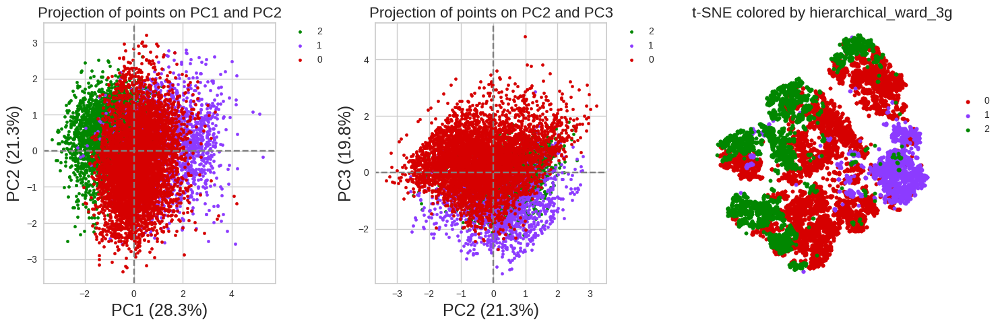

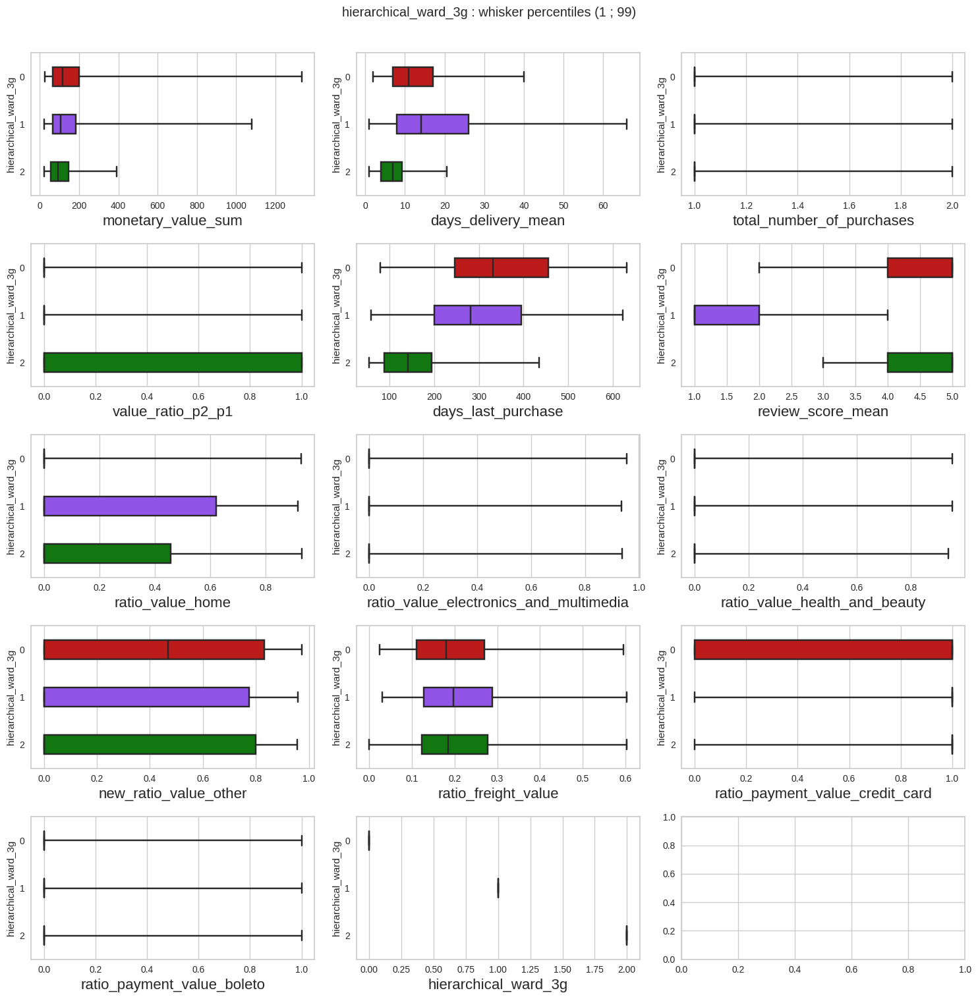

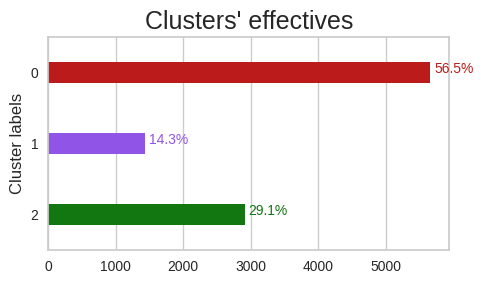

*************
hierarchical_ward_4g


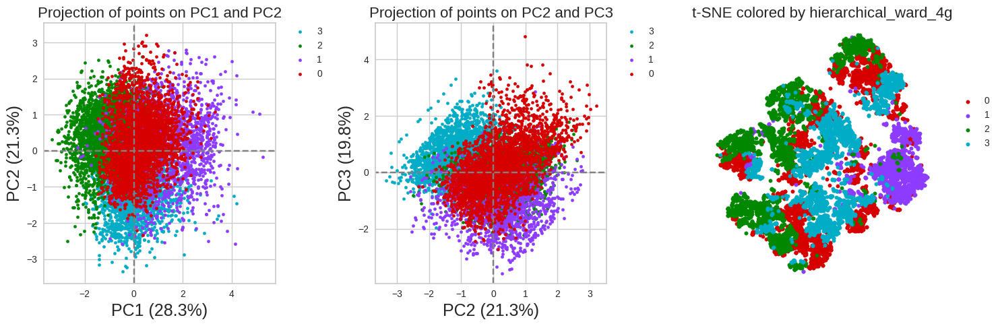

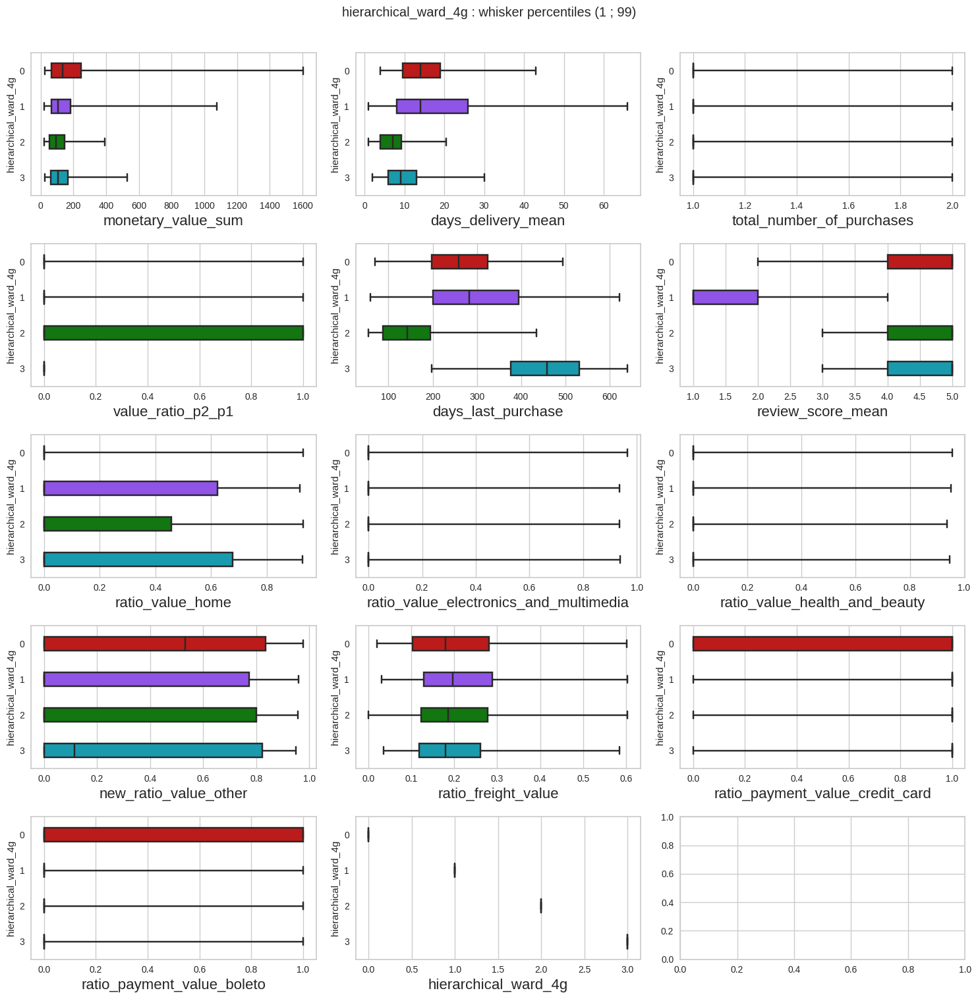

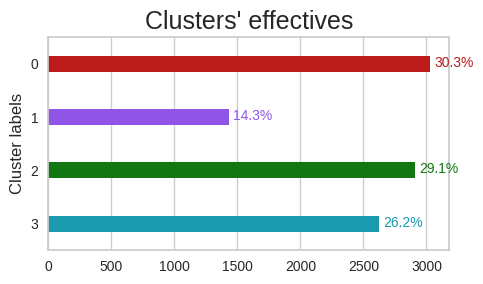

*************
hierarchical_ward_5g


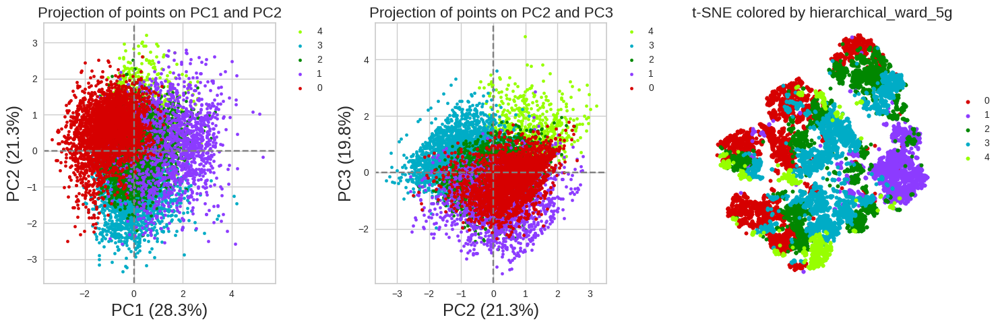

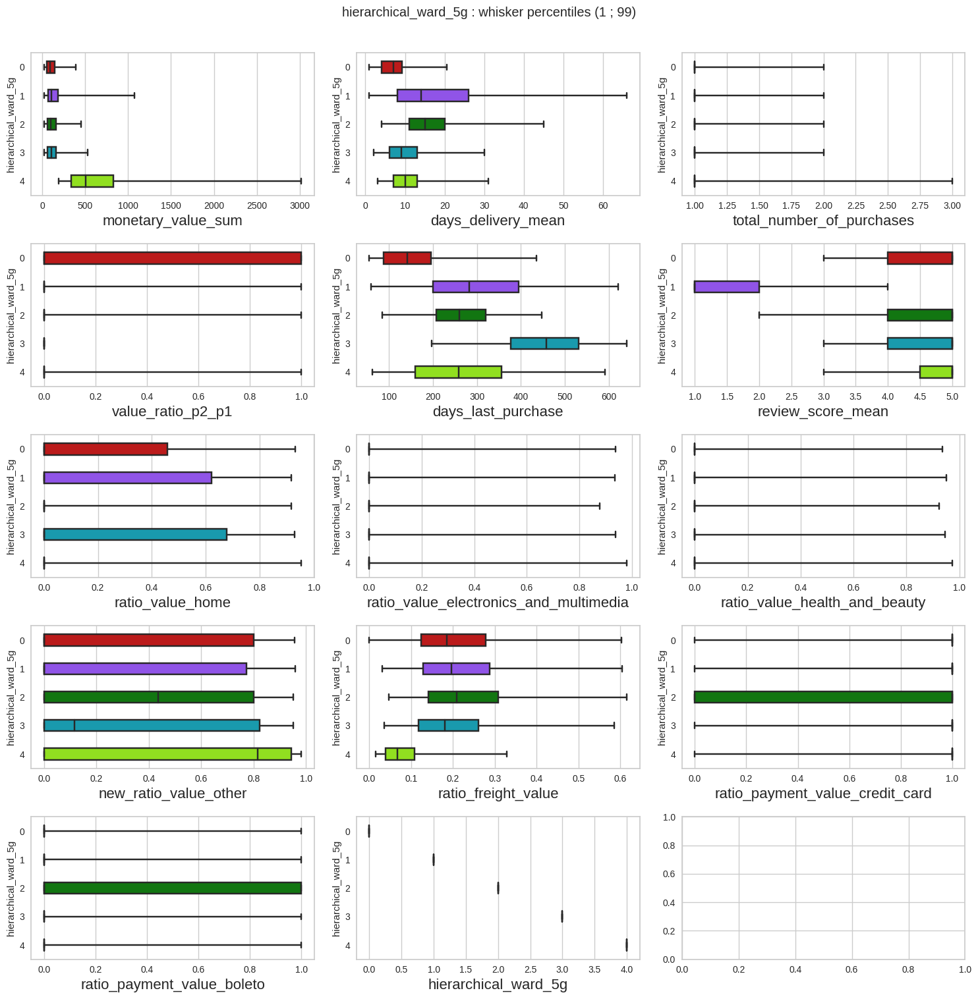

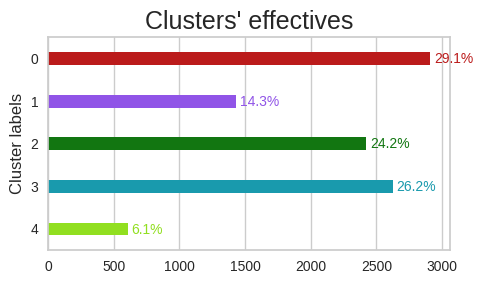

*************
hierarchical_ward_6g


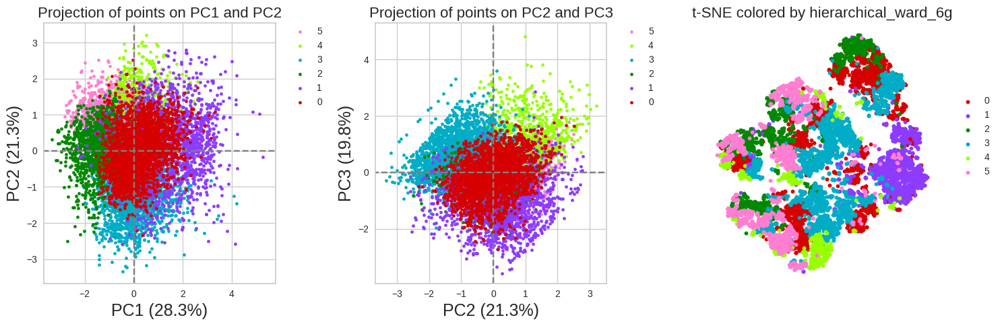

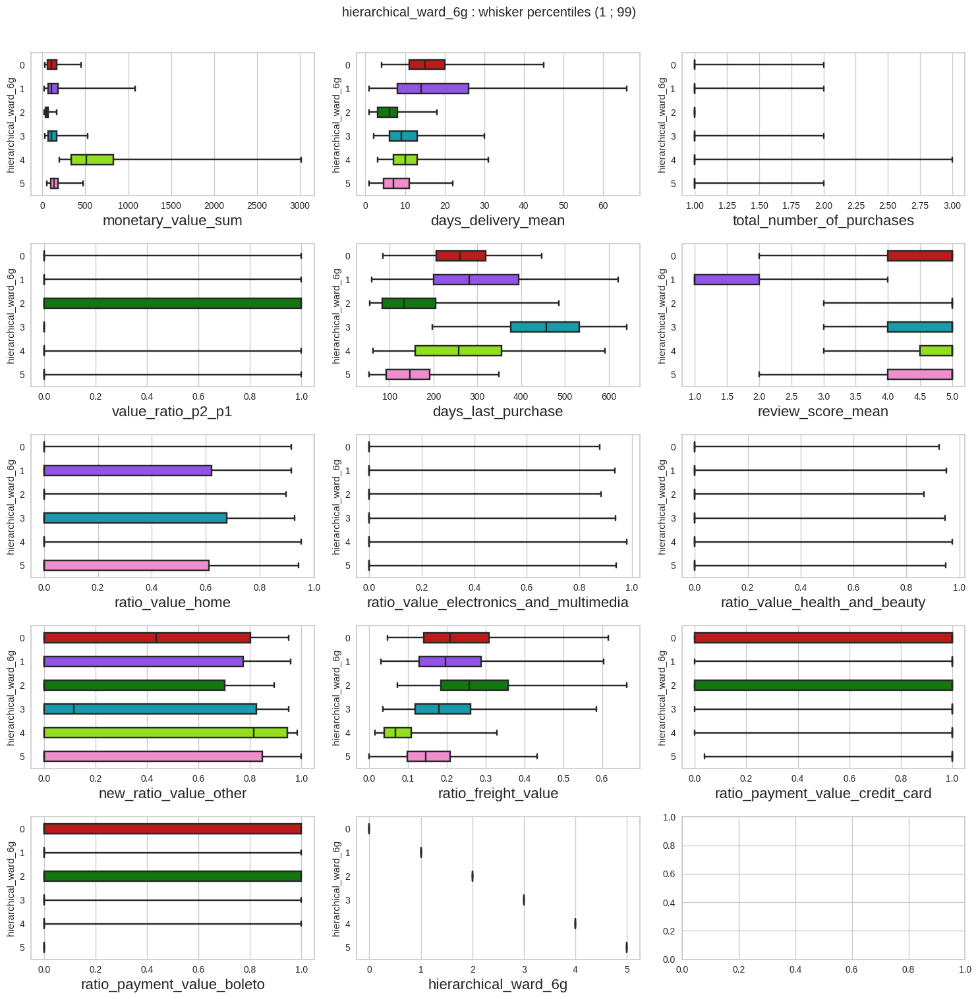

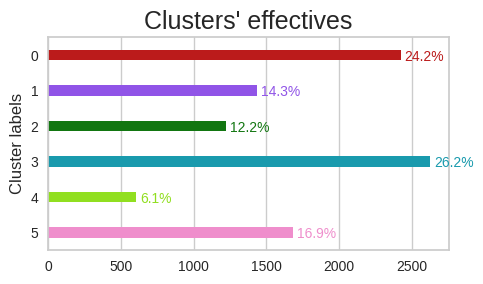

*************
hierarchical_ward_7g


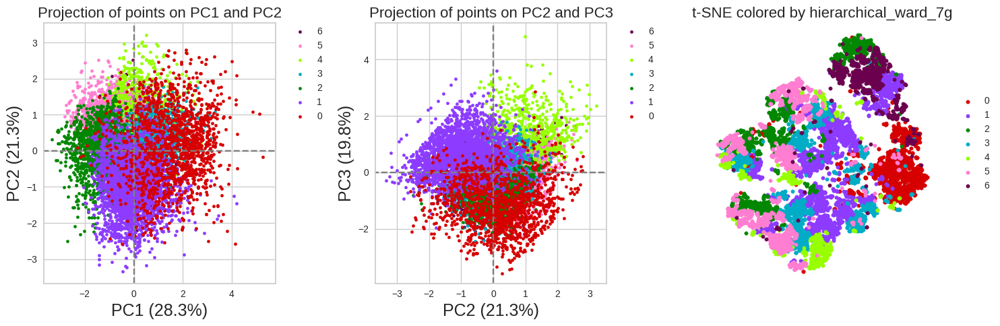

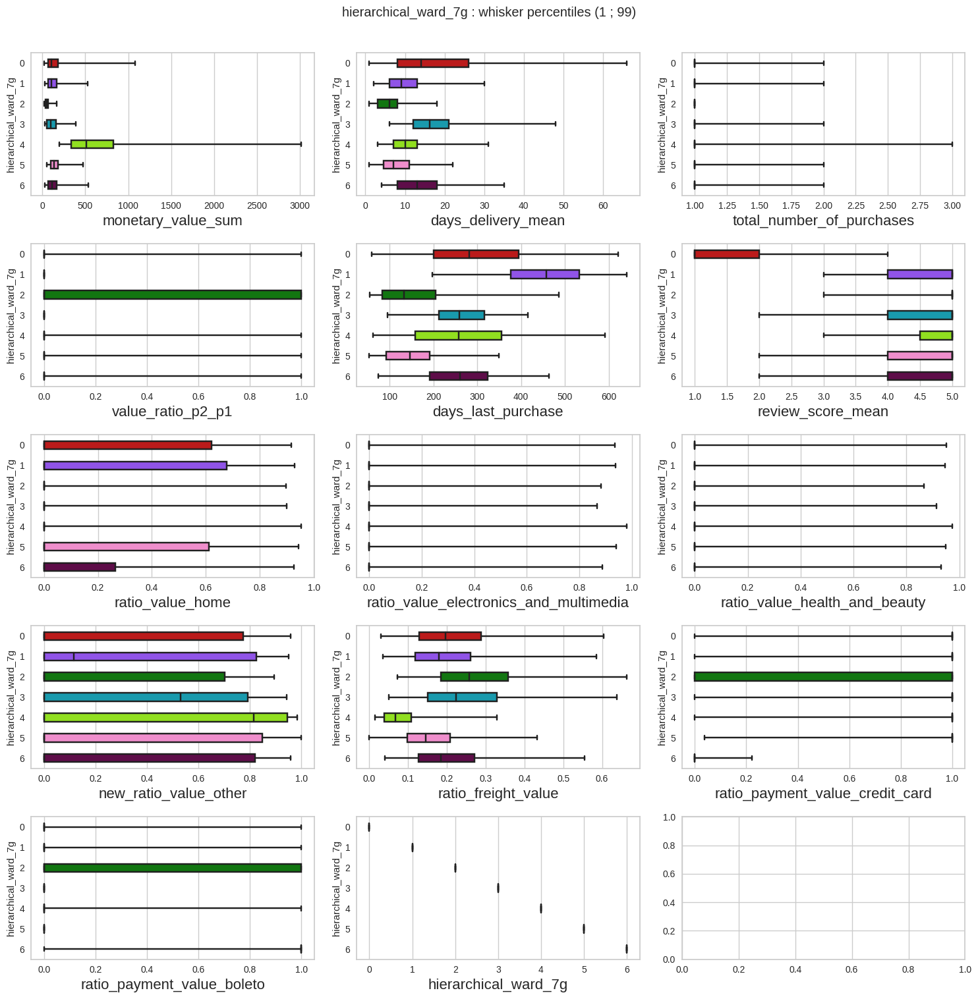

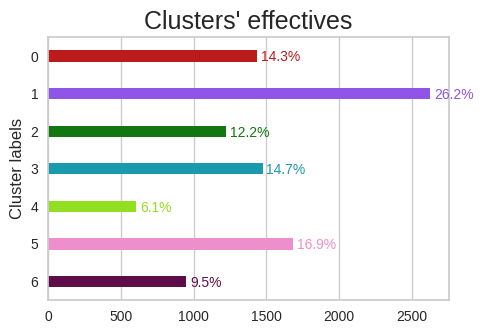

*************
hierarchical_ward_8g


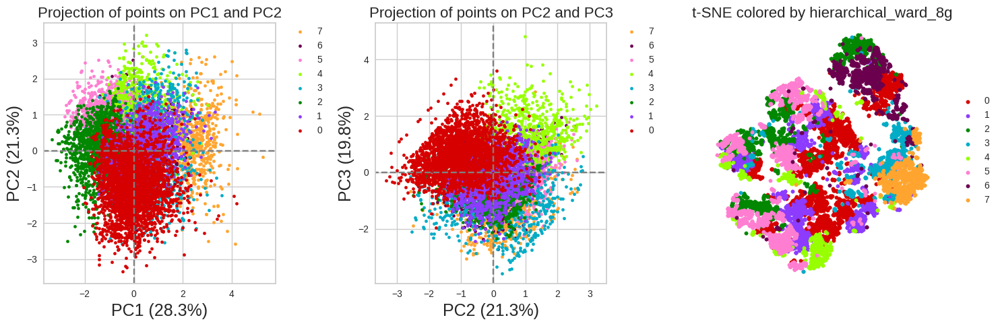

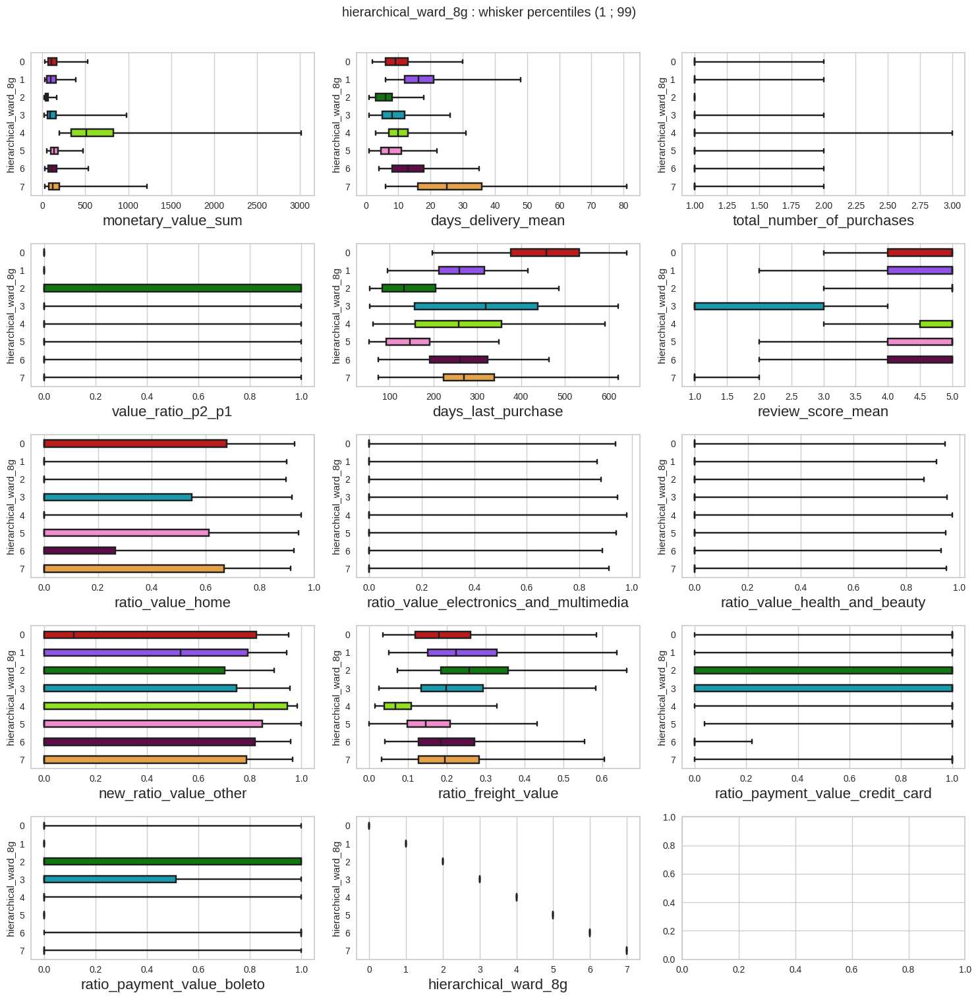

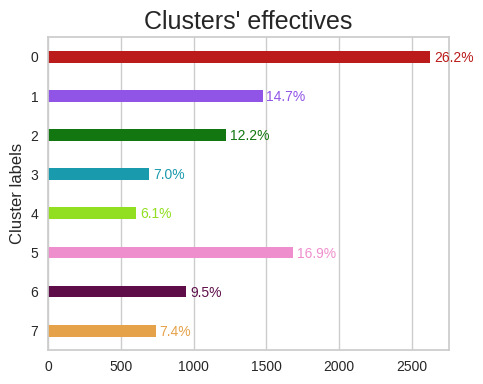

*************
hierarchical_ward_9g


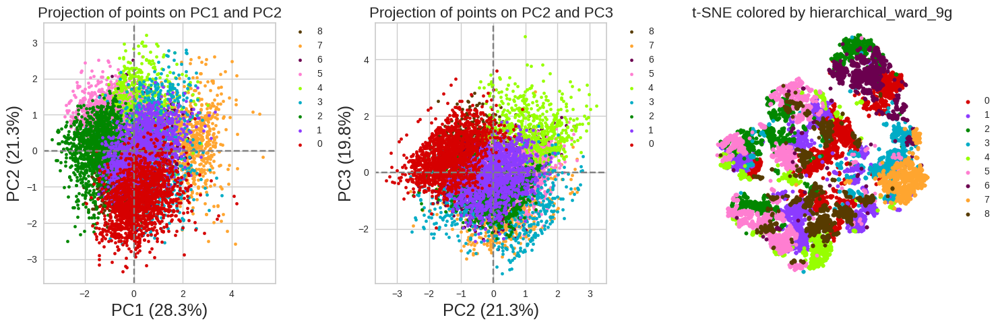

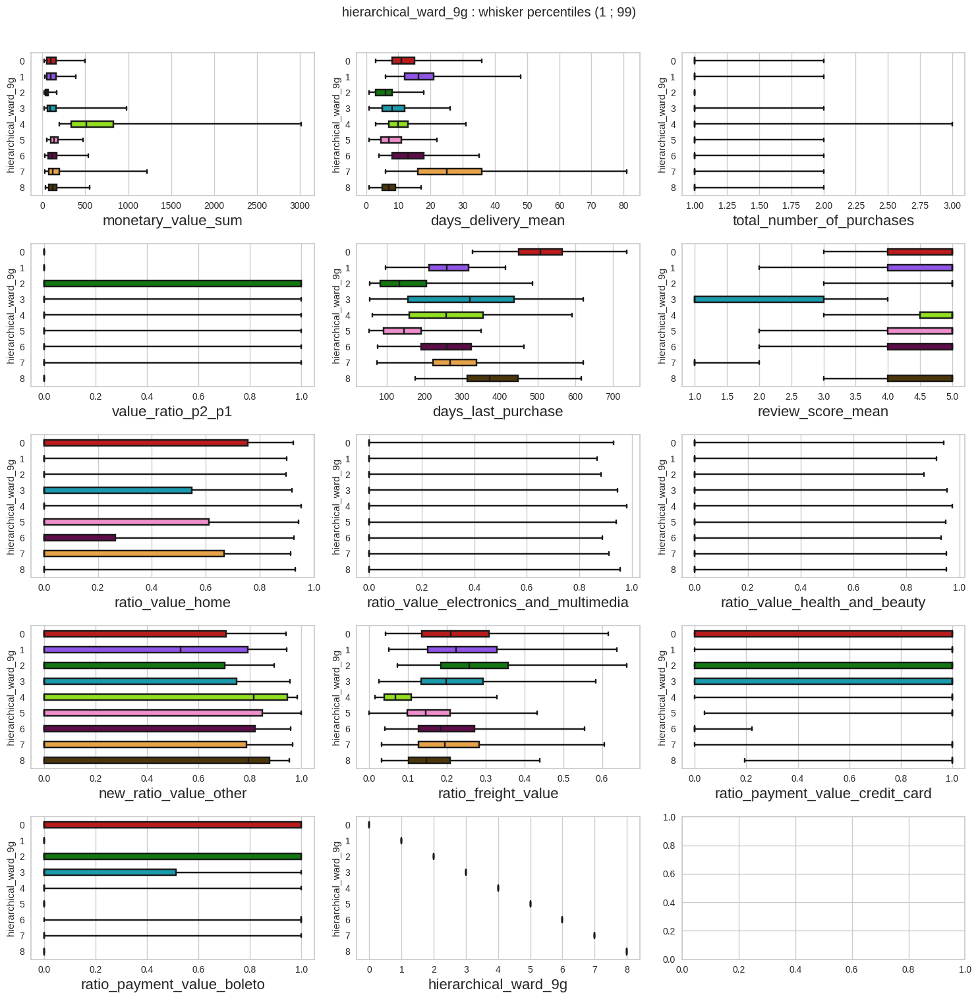

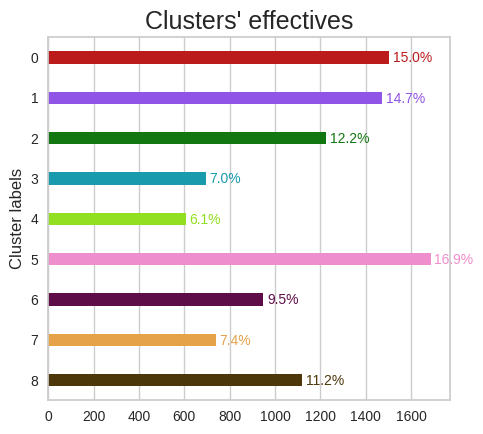

*************
hierarchical_ward_10g


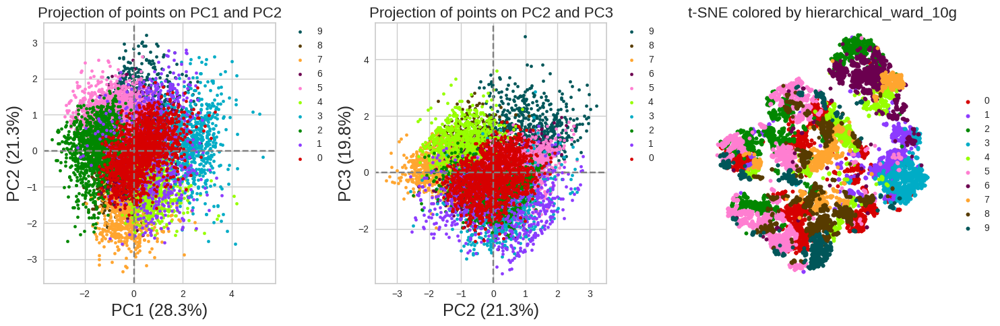

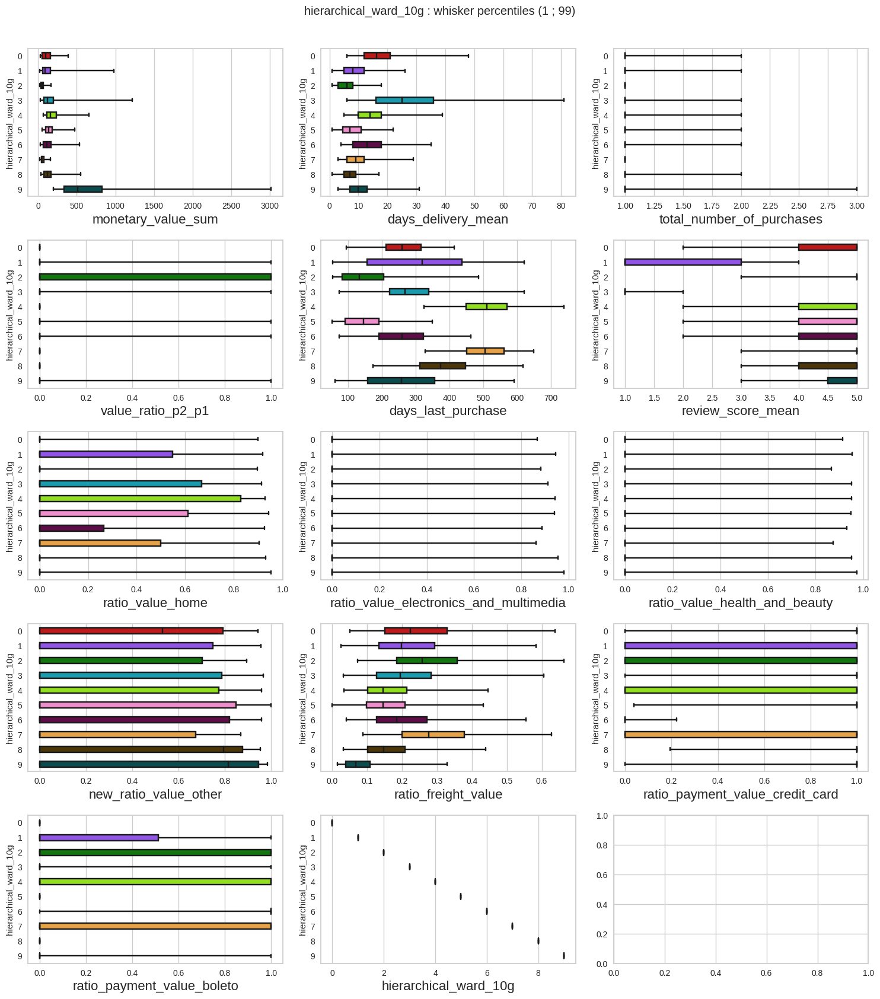

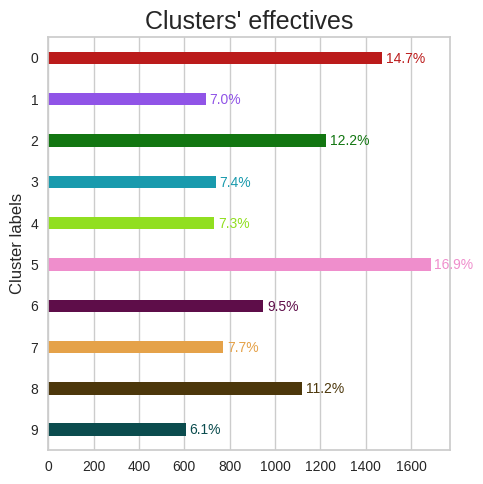

*************
hierarchical_ward_15g


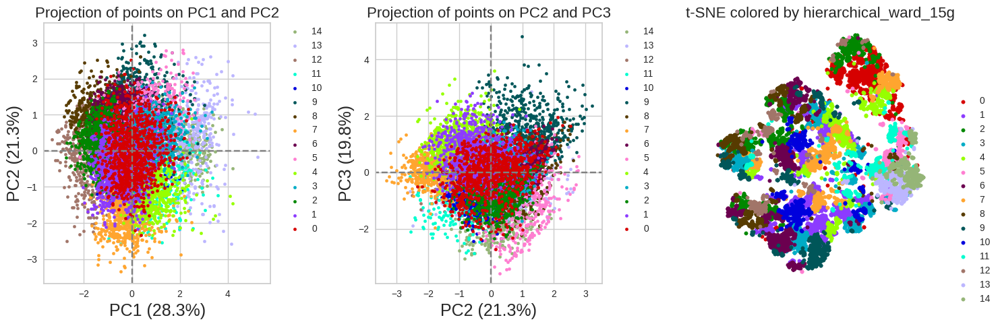

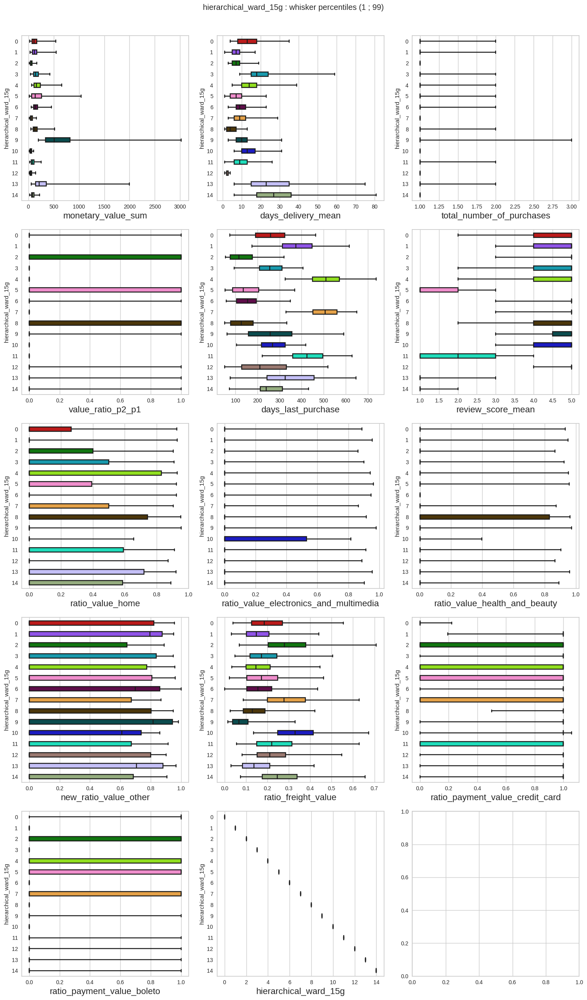

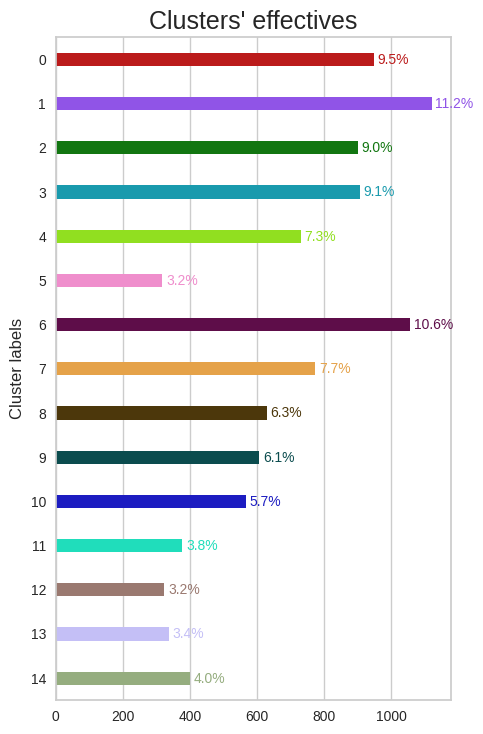

In [61]:
nr = (len(all_fts) // 3) + 1
for label_name in hierarchical_label_names:
        print('*************')
        print(label_name)
        label_vec = Xs[label_name]
        ds.display_clusters_in_pca_space_and_tsne_embedding(Xspp_pca,
                                                            pca,
                                                            Xspp_tsne,
                                                            label_vec,
                                                            label_name)
        
        ds.display_clusters_comparison(Xs[[*all_fts, label_name]], label_name,
                                       layout=(nr, 3))

In [22]:
# hierarchical ward 4g on the entire dataset with connectivity
# for memory reason.
from sklearn.neighbors import kneighbors_graph
knn_graph = kneighbors_graph(Xpp, 50, include_self=False)


In [21]:
knn_graph.shape

(93322, 93322)

In [23]:
k = 4
label_name = 'hierarchical_ward_' + str(k) + 'g_full'
print(label_name)
clusterer = AgglomerativeClustering(linkage='ward',
                                    connectivity=knn_graph,
                                    n_clusters=k)
# Add labels as columns in Xs
X.loc[:, label_name] = clusterer.fit_predict(Xpp)                                    

hierarchical_ward_4g_full


## 1.7.  [&#9650;](#toc0_) <a id='toc1_7_'></a>Clustering models scores

In [20]:
Xs.columns

Index(['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases',
       'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean',
       'ratio_value_home', 'ratio_value_electronics_and_multimedia',
       'ratio_value_health_and_beauty', 'new_ratio_value_other',
       'ratio_freight_value', 'ratio_payment_value_credit_card',
       'ratio_payment_value_boleto', 'Kmeans_2g', 'Kmeans_3g', 'Kmeans_4g',
       'Kmeans_5g', 'Kmeans_6g', 'Kmeans_7g', 'Kmeans_9g', 'Kmeans_11g',
       'hierarchical_ward_3g', 'hierarchical_ward_4g', 'hierarchical_ward_5g',
       'hierarchical_ward_6g', 'hierarchical_ward_7g', 'hierarchical_ward_8g',
       'hierarchical_ward_9g', 'hierarchical_ward_10g',
       'hierarchical_ward_15g', 'OPTICS'],
      dtype='object')

### 1.7.1.  [&#9650;](#toc0_) <a id='toc1_7_1_'></a>Silhouette means

In [21]:
label_names = ['Kmeans_2g', 'Kmeans_3g', 'Kmeans_4g',
               'Kmeans_5g', 'Kmeans_6g', 'Kmeans_7g', 'Kmeans_9g',
               'Kmeans_11g', 'hierarchical_ward_3g', 'hierarchical_ward_4g',
               'hierarchical_ward_5g', 'hierarchical_ward_6g',
               'hierarchical_ward_7g', 'hierarchical_ward_8g',
               'hierarchical_ward_9g', 'hierarchical_ward_10g',
               'hierarchical_ward_15g', 'OPTICS',]  

silhouettes = []
for label_name in label_names:
    print(label_name)
    silhouettes.append(silhouette_score(Xs[all_fts], Xs[label_name]))

Kmeans_2g
Kmeans_3g
Kmeans_4g
Kmeans_5g
Kmeans_6g
Kmeans_7g
Kmeans_9g
Kmeans_11g
hierarchical_ward_3g
hierarchical_ward_4g
hierarchical_ward_5g
hierarchical_ward_6g
hierarchical_ward_7g
hierarchical_ward_8g
hierarchical_ward_9g
hierarchical_ward_10g
hierarchical_ward_15g
OPTICS


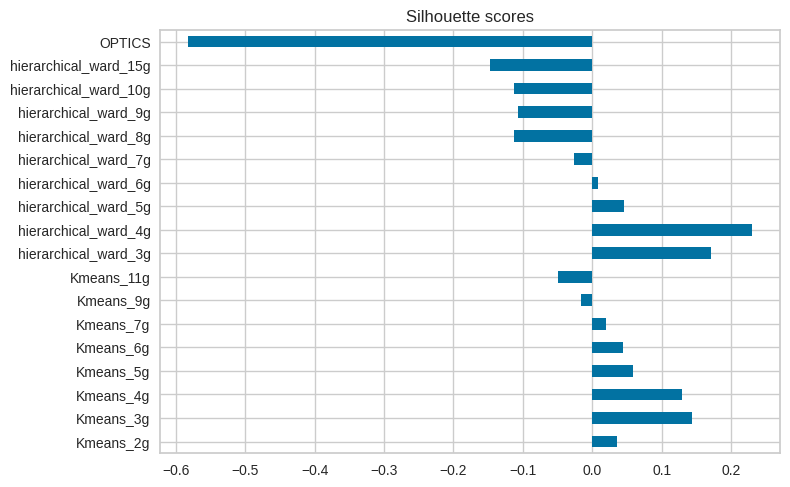

In [22]:
silhouettes_df = pd.DataFrame(silhouettes, index=label_names)
silhouettes_df.plot(kind='barh', legend=False, title='Silhouette scores')
plt.show()

### 1.7.2.  [&#9650;](#toc0_) <a id='toc1_7_2_'></a>calinski_harabasz_score

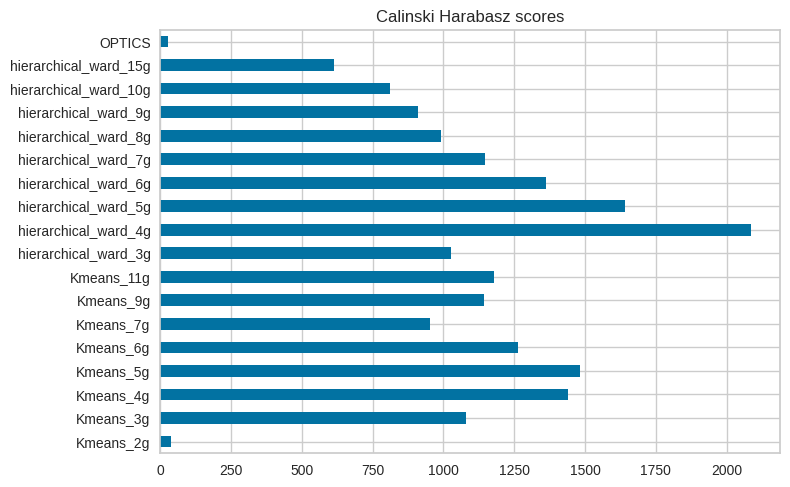

In [23]:
calinski_harabasz = []
for label_name in label_names:
    calinski_harabasz.append(calinski_harabasz_score(Xs[all_fts], Xs[label_name]))

(pd.DataFrame(calinski_harabasz, index=label_names)
.plot(kind='barh', legend=False, title='Calinski Harabasz scores'))
plt.show()

### 1.7.3.  [&#9650;](#toc0_) <a id='toc1_7_3_'></a>Davies_Bouldin

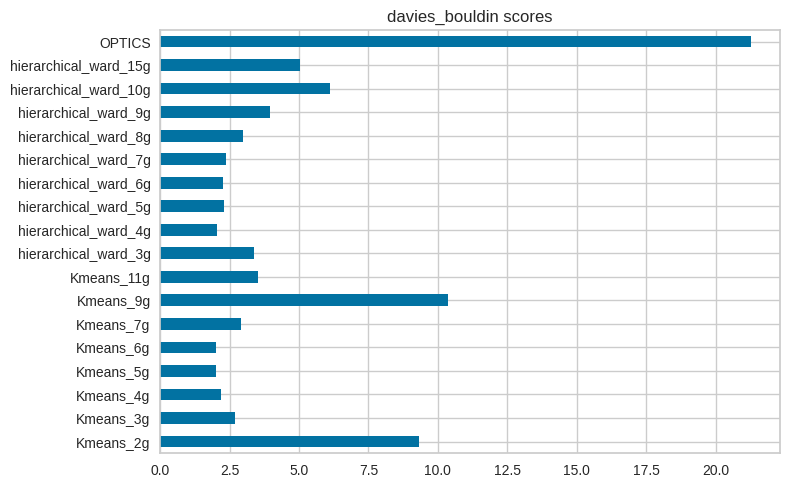

In [24]:
davies_bouldin = []
for label_name in label_names:
    davies_bouldin.append(davies_bouldin_score(Xs[all_fts], Xs[label_name]))

(pd.DataFrame(davies_bouldin, index=label_names)
.plot(kind='barh', legend=False, title='davies_bouldin scores'))
plt.show()

## 1.8.  [&#9650;](#toc0_) <a id='toc1_8_'></a>Conclusions

Kmeans and hierarchical clustering around 3-6 groups give the best technical scores. Hierarchical being slightly better?

The idea of that project is to give a decent clustering in order to launch marketing campaigns and improve the platform incomes.

Thus, I feel like going a bit further and see what are the differences for 5 to 7 groups for both models, and choose the most informative one according to me.


****** Kmeans_5g ******


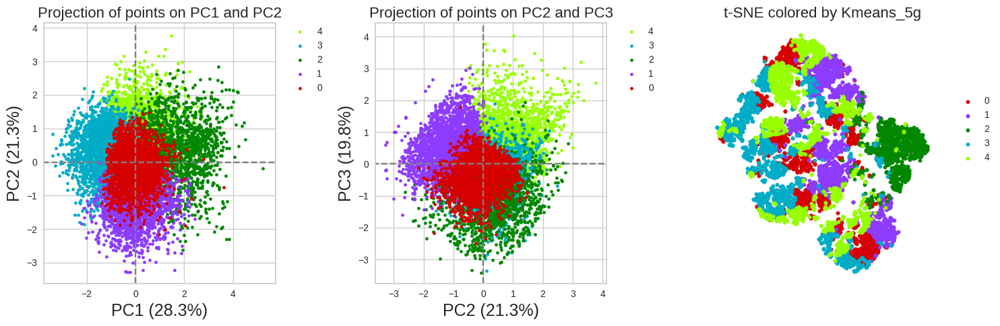

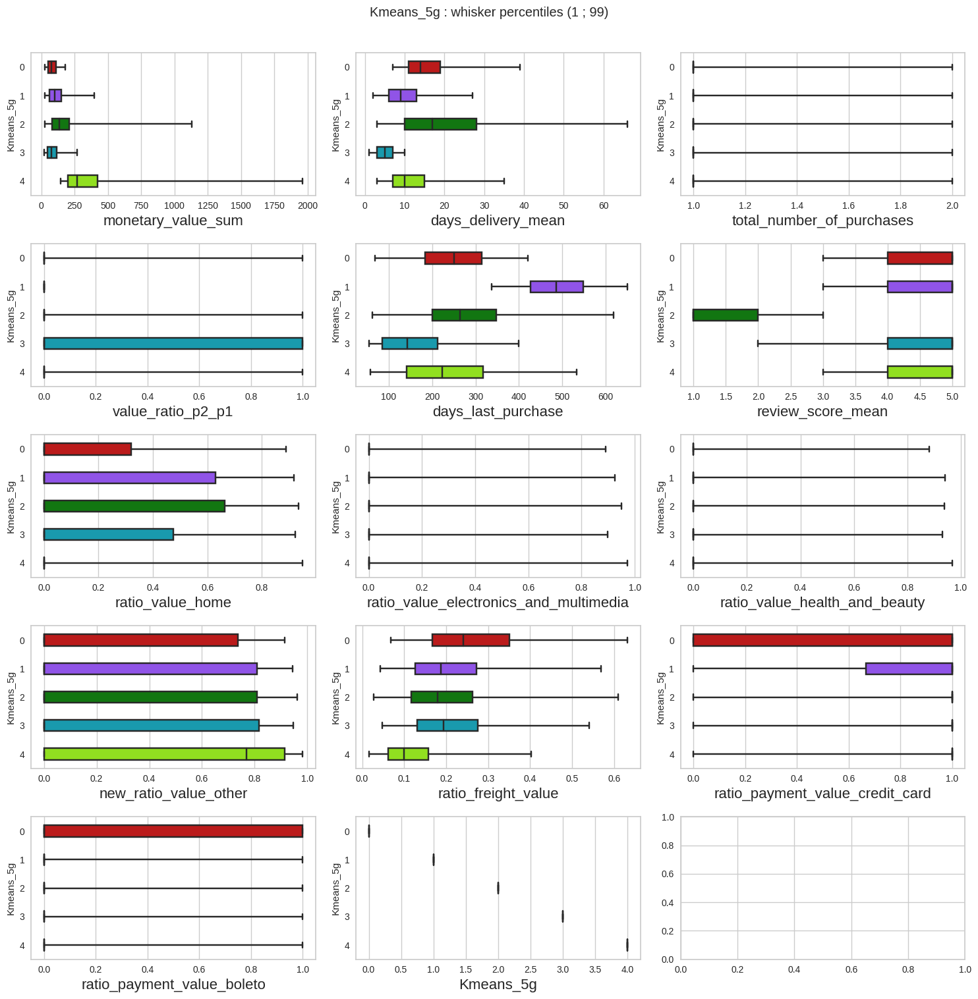

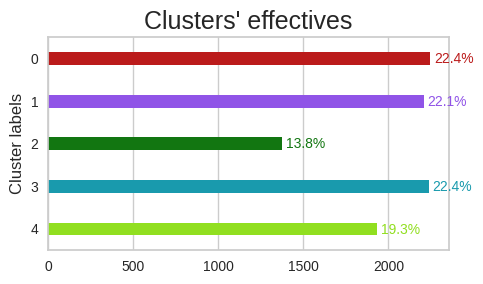

****** Kmeans_6g ******


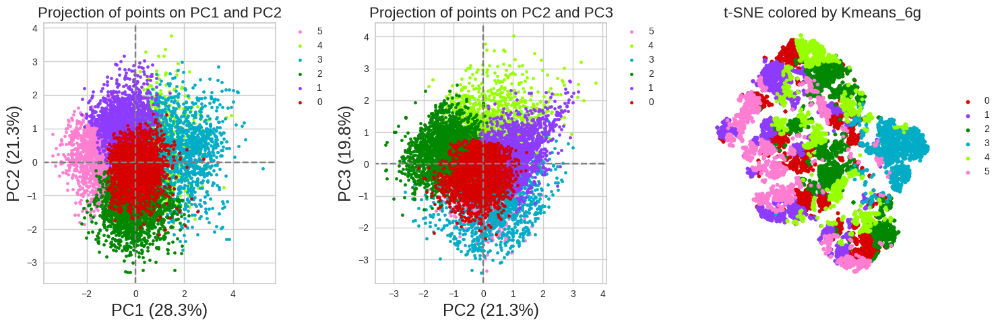

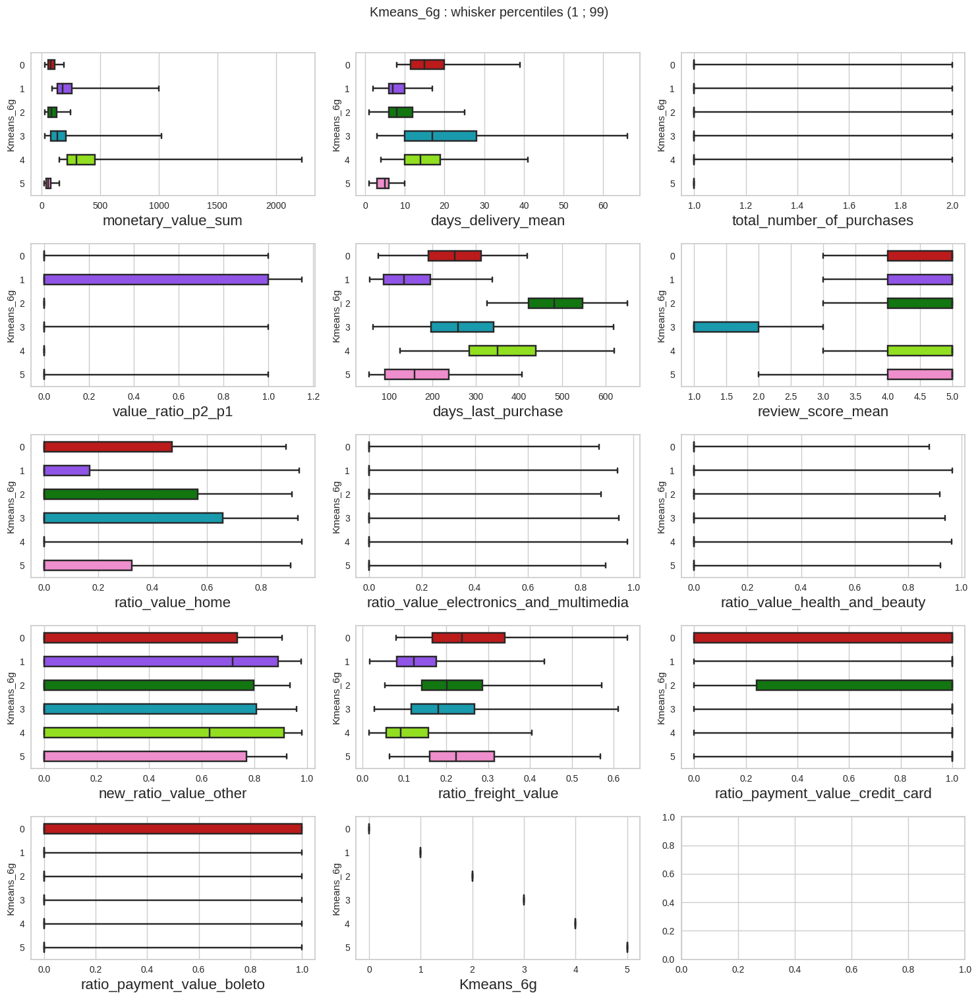

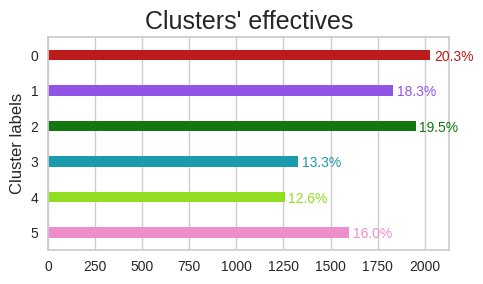

****** Kmeans_7g ******


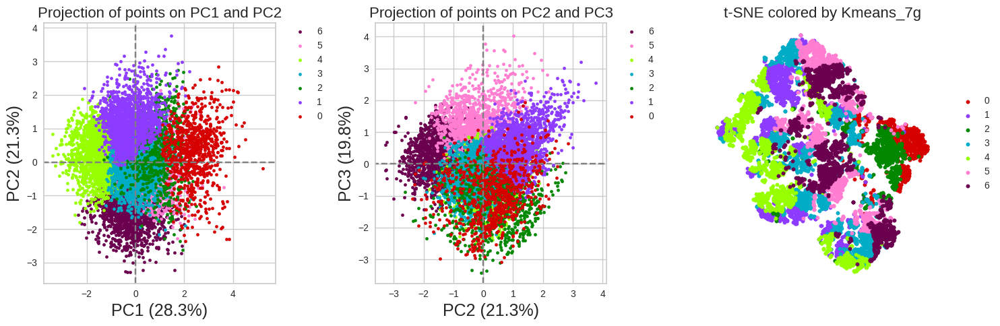

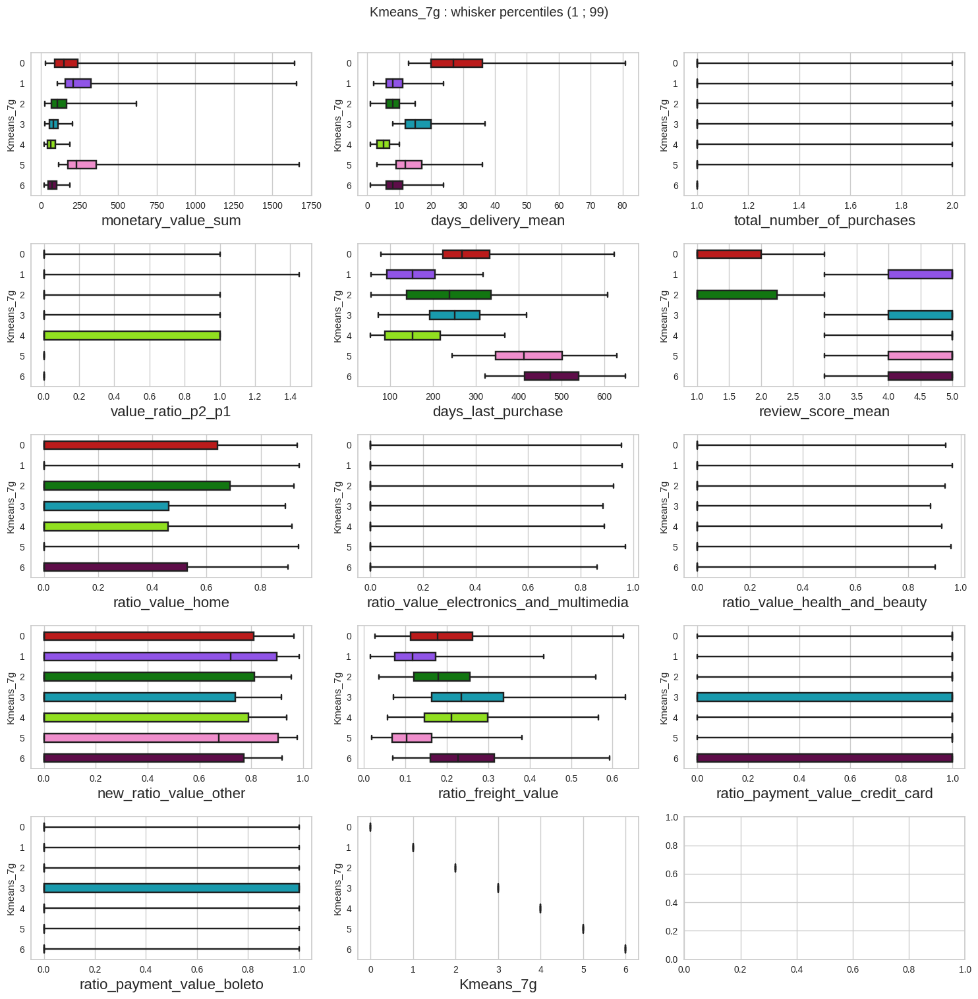

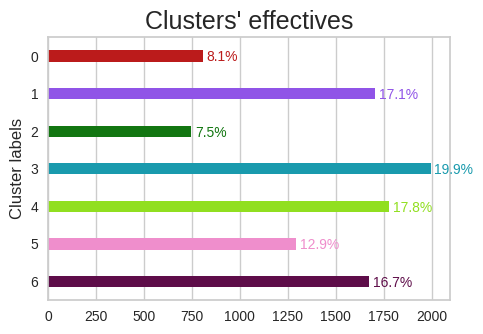

****** hierarchical_ward_4g ******


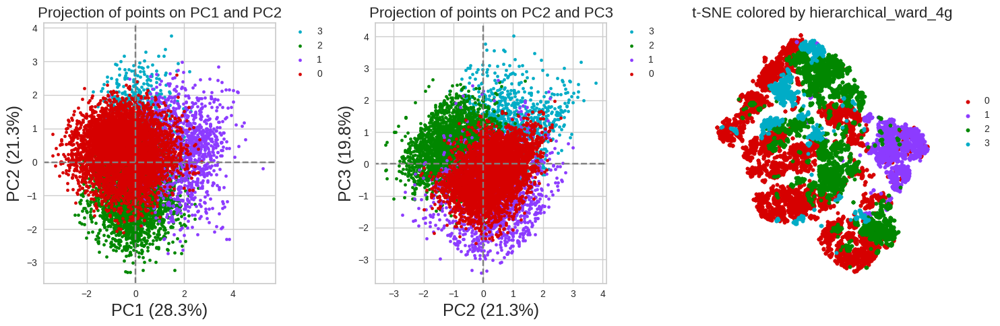

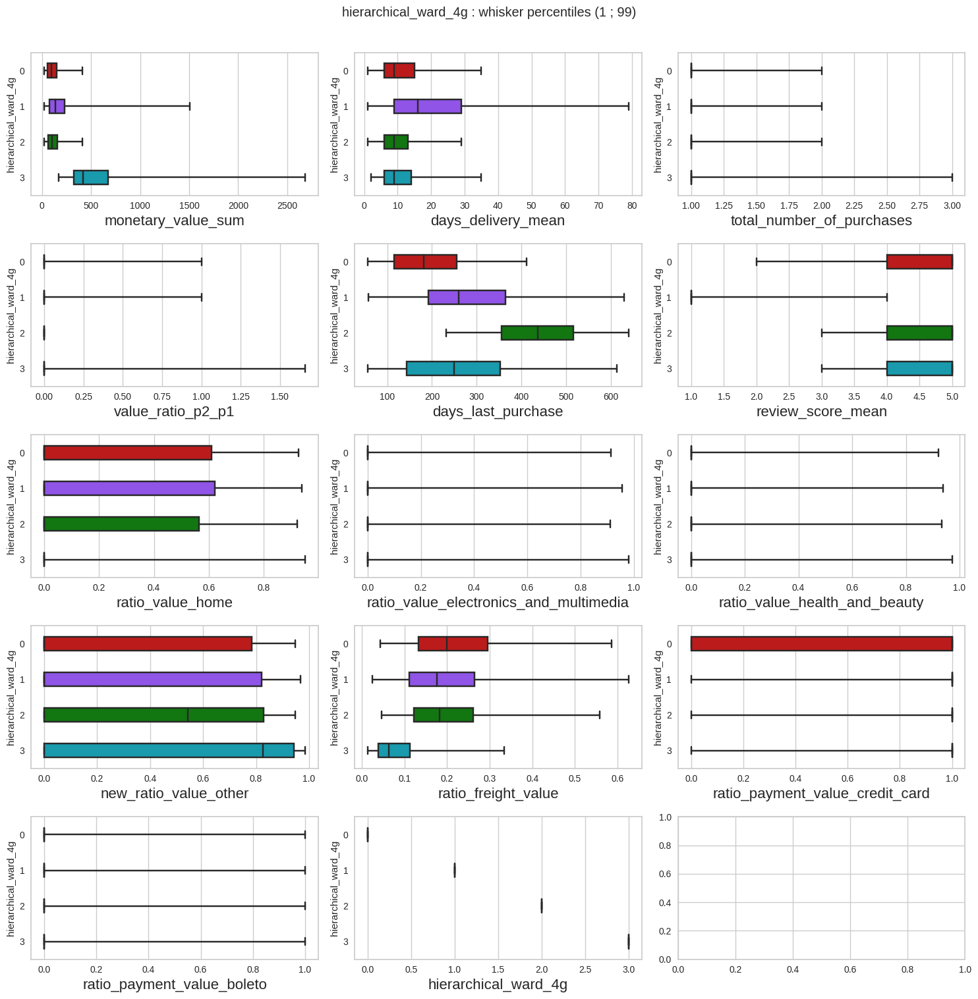

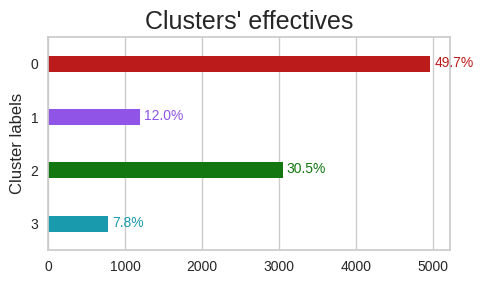

****** hierarchical_ward_5g ******


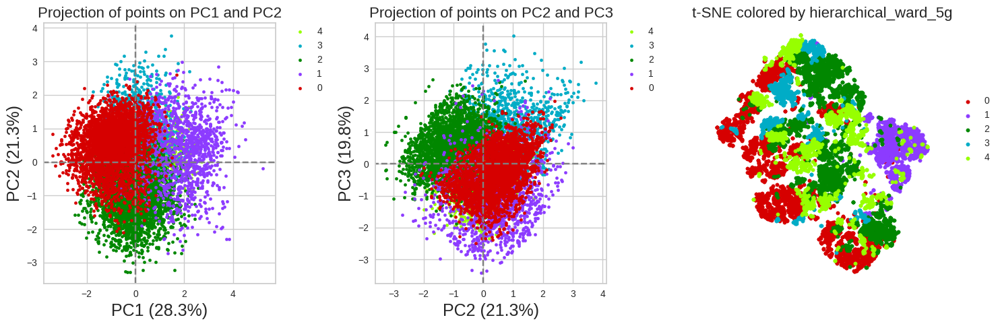

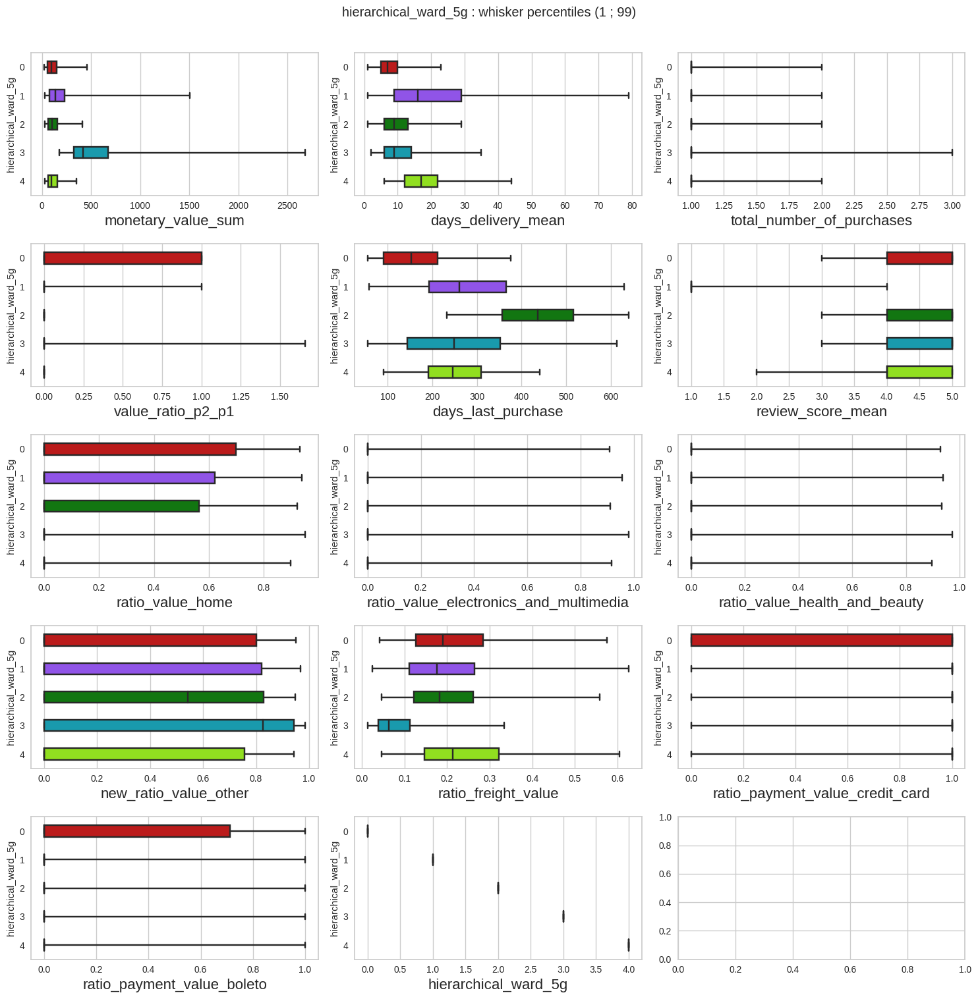

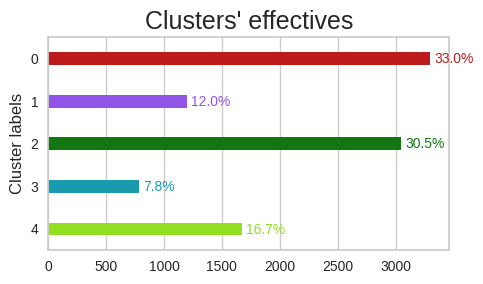

****** hierarchical_ward_6g ******


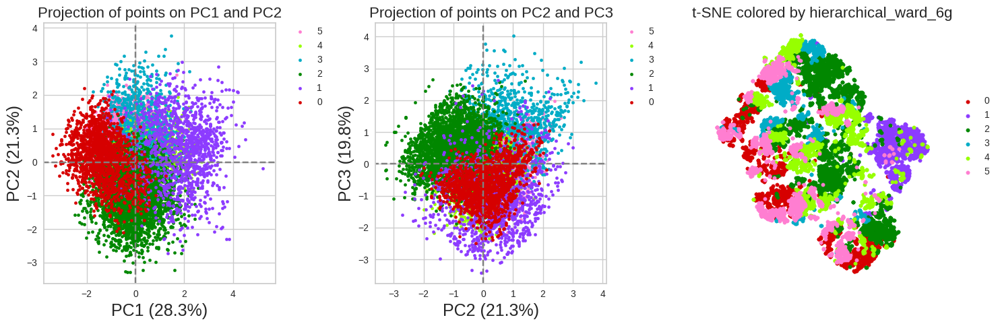

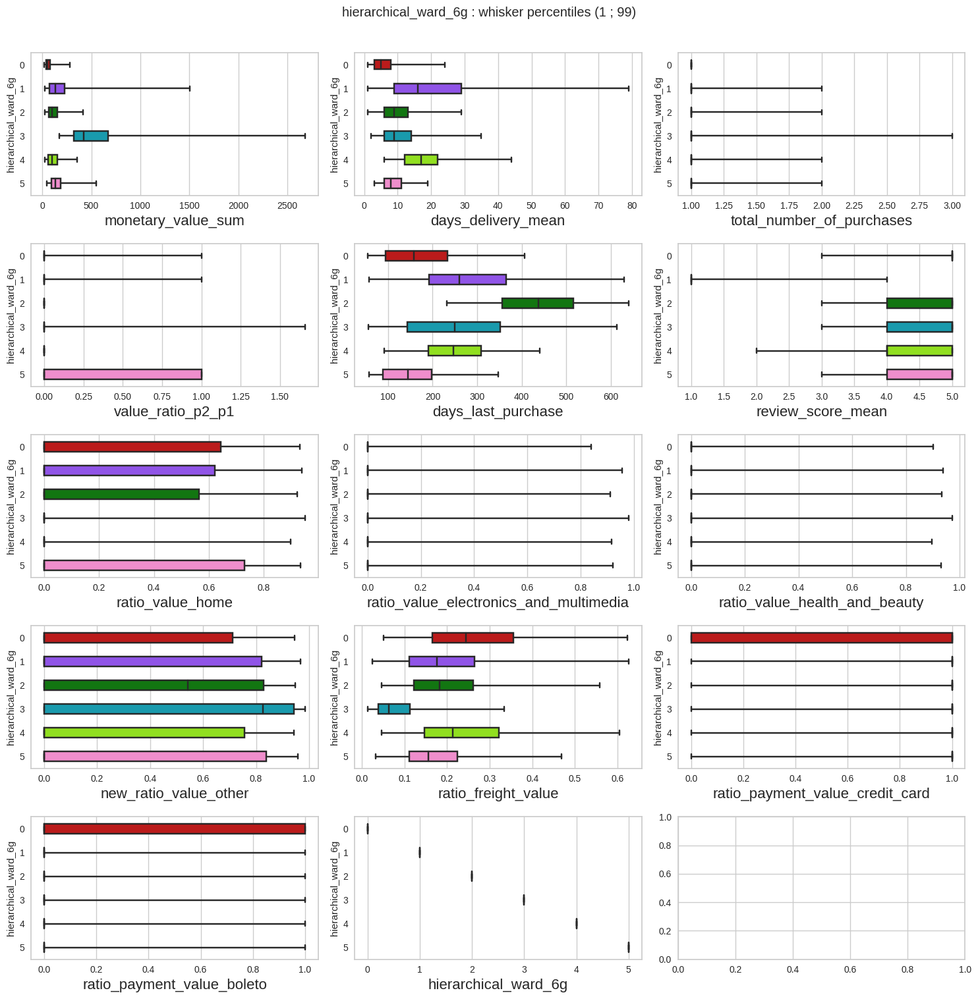

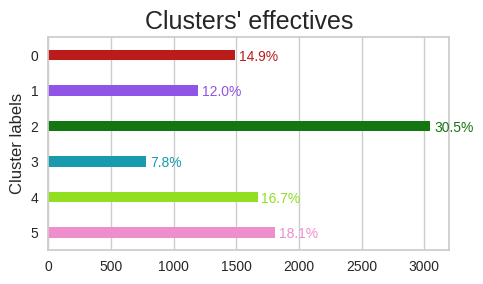

****** hierarchical_ward_7g ******


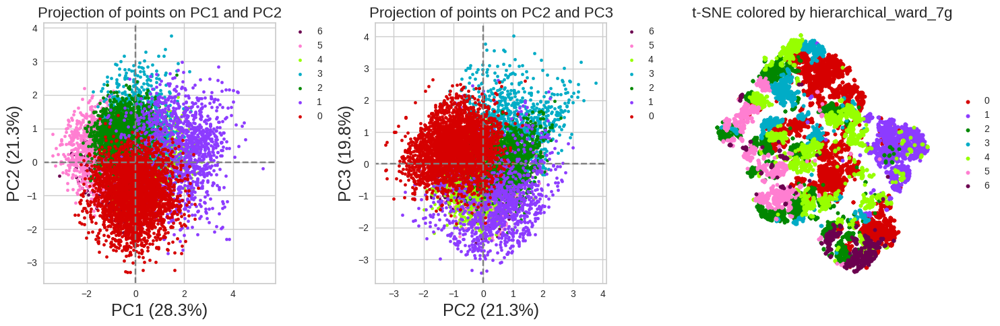

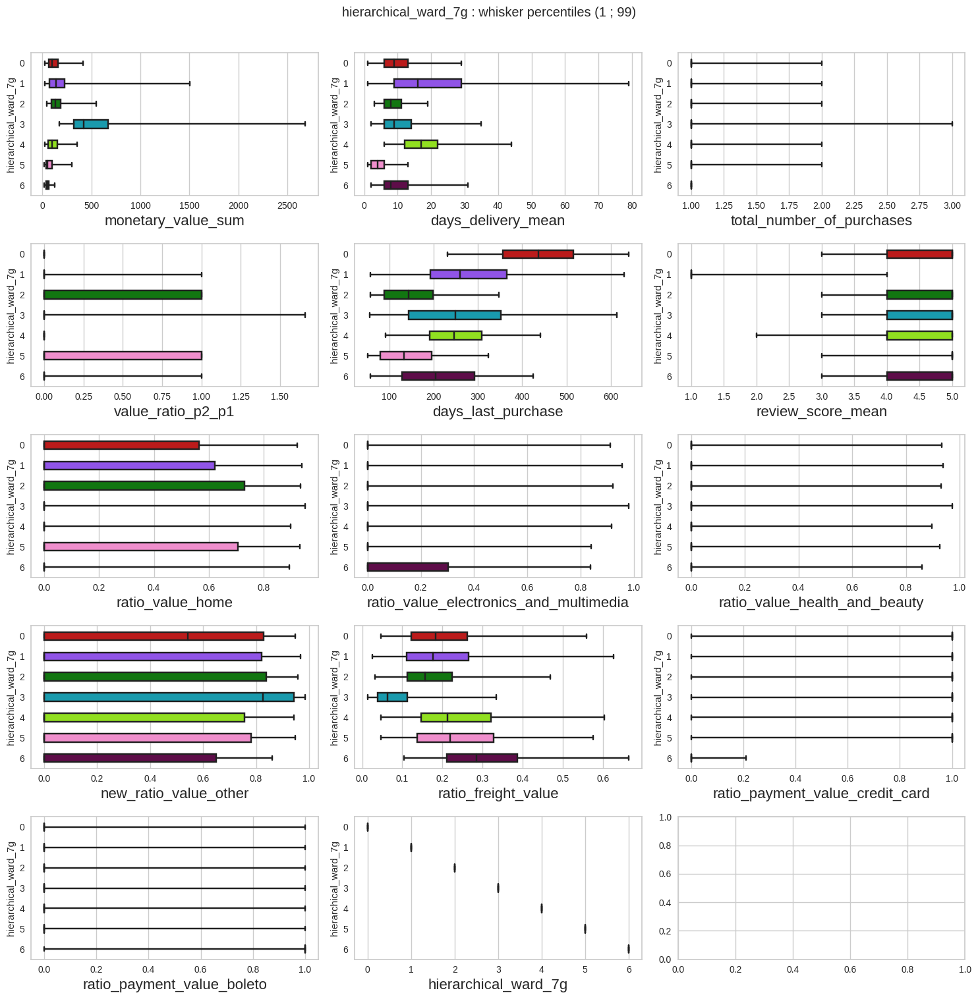

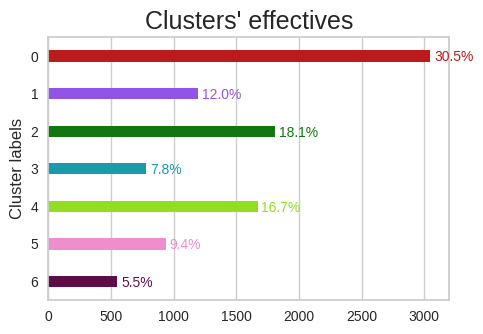

In [28]:
top_clusterers = ['Kmeans_5g',
                  'Kmeans_6g',
                  'Kmeans_7g',
                  'hierarchical_ward_4g',
                  'hierarchical_ward_5g',
                  'hierarchical_ward_6g',
                  'hierarchical_ward_7g']

nr = (len(all_fts) // 3) + 1
for label_name in top_clusterers:
    print(f'****** {label_name} ******')
    label_vec = Xs[label_name]
    ds.display_clusters_in_pca_space_and_tsne_embedding(Xspp_pca,
                                                        pca,
                                                        Xspp_tsne,
                                                        label_vec,
                                                        label_name)
    ds.display_clusters_comparison(Xs[[*all_fts, label_name]], label_name,
                                   layout=(nr, 3))

Note on those clusters :

Hierarchical 4 :
- does not catch dynamic people
- catches very well very unsatisfied people
- catches important customers (high value)
- catches ‘dead’ satisfied customers
- catching a group of people paying with several means.

hierarchical 5:
-same as 4 but catches a bit better a group of dynamic people 

hierarchical 6:
- no more information

hier 7 :
-catches people paying with boleto

then the choice is to be made between 4 and 5 groups

*** 
Kmeans 5
- catches a bit of dynamic people (low value)
- catches unsatisfied people (but less dramatic than hierarchical)
- catches important customers (high value)
- catches ‘dead’ satisfied customers
- catching a group of people paying with several means.

Kmeans 6
-not as rich as Kmeans7

Kmeans7
- interesting because it shows 2 groups of unsatisfied people (long delivery and short)
- split long inactive customers into 2 groups (high and low values)
- identifies high value with more recent and more dynamic
***

At that point, I want to :
- select Hierarchical 4, Kmeans 5 and 7;
- compute them on the full dataset
- evaluate stability of the models across runs. 

Just before that, I want to simplify the number of inputs to compare results.

### 1.8.1.  [&#9650;](#toc0_) <a id='toc1_8_1_'></a>Comparisons for the entire dataset

****** Kmeans_5g ******


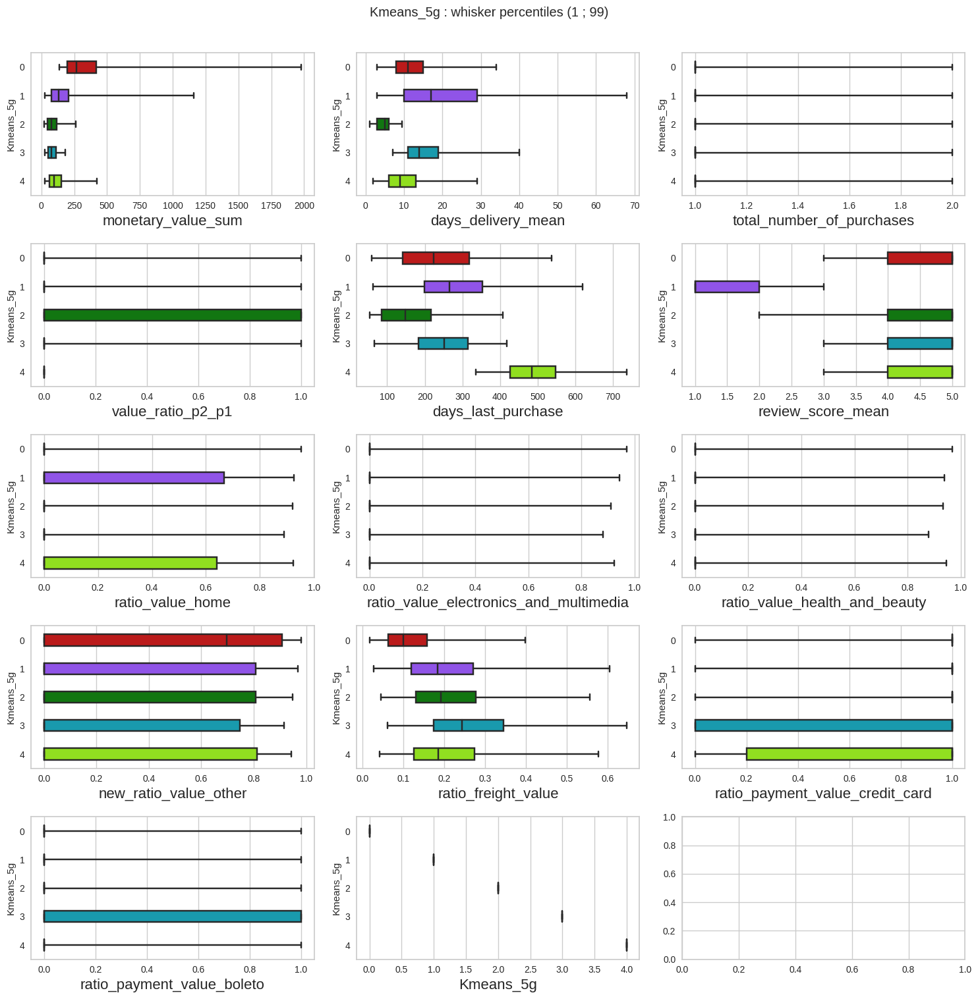

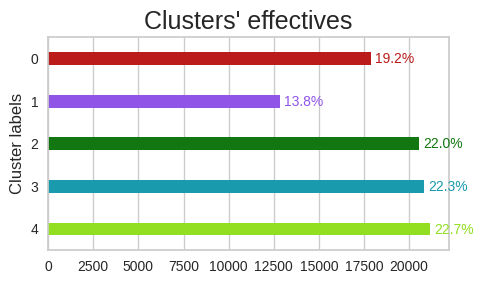

****** Kmeans_7g ******


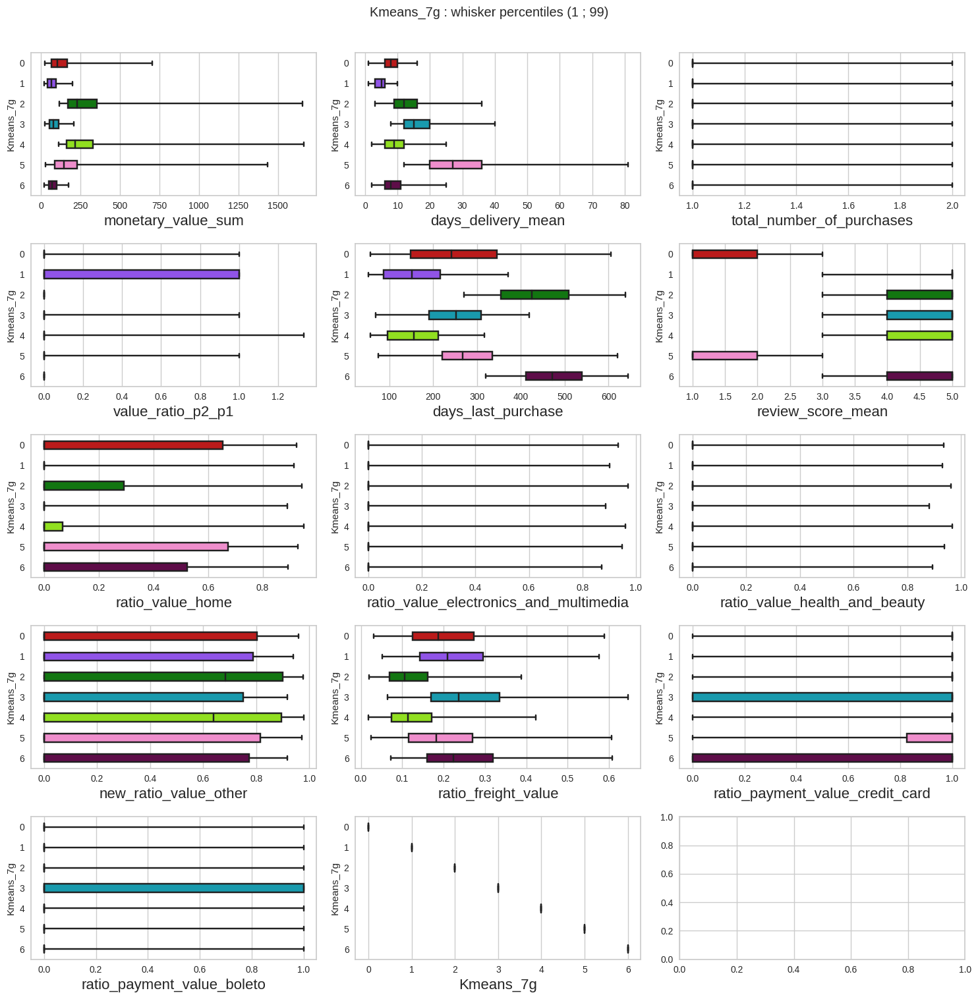

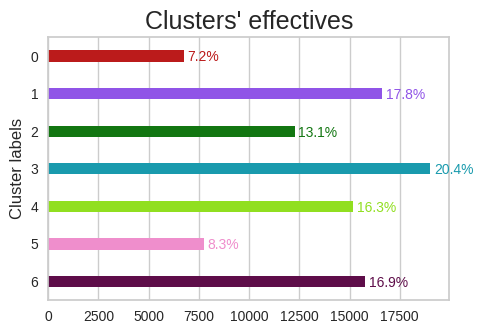

****** hierarchical_ward_4g_full ******


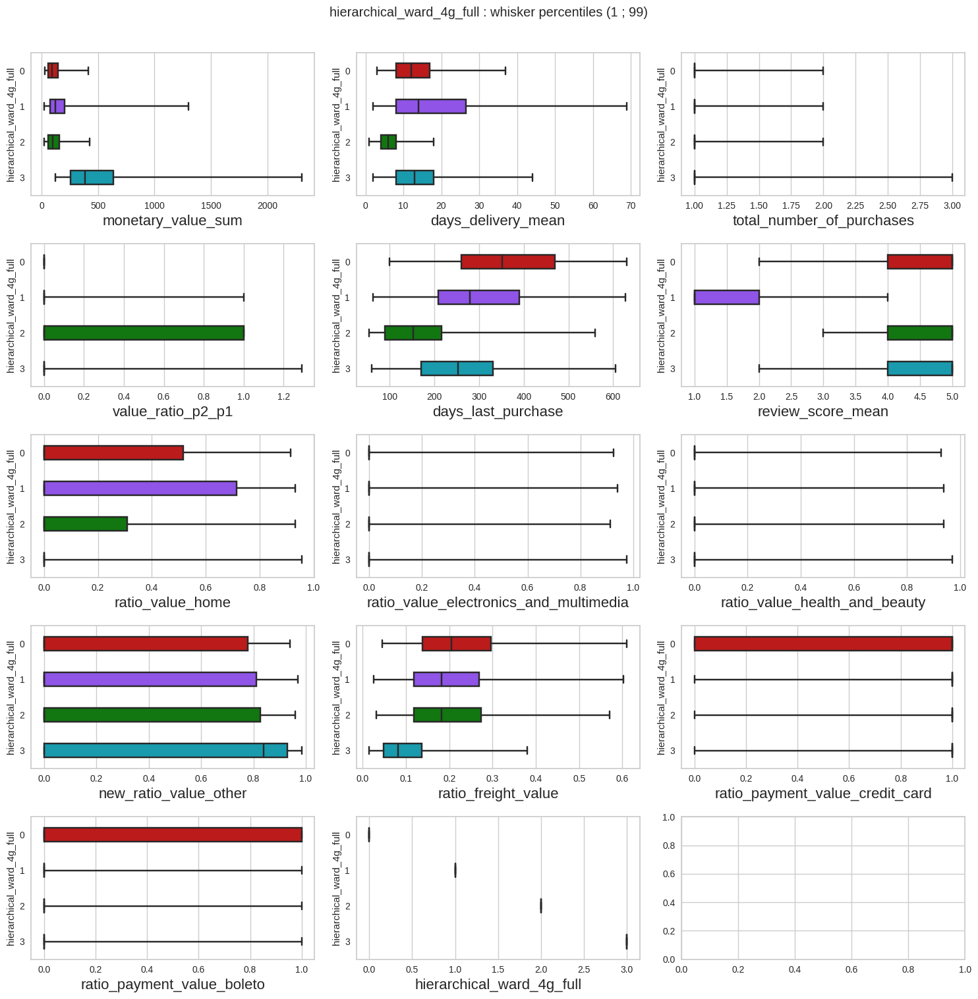

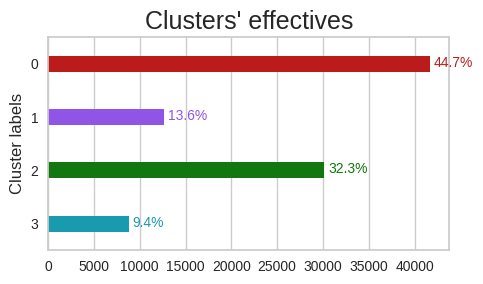

In [24]:
top_clusterers = ['Kmeans_5g',
                  'Kmeans_7g',
                  'hierarchical_ward_4g_full',
                 ]

nr = (len(all_fts) // 3) + 1
for label_name in top_clusterers:
    print(f'****** {label_name} ******')
    ds.display_clusters_comparison(X[[*all_fts, label_name]], label_name,
                                   layout=(nr, 3))

### 1.8.2.  [&#9650;](#toc0_) <a id='toc1_8_2_'></a>Plotting centroids value and faking it for the hierarchical clustering

In [42]:
centroids_5g = pd.DataFrame(centroids_pp_space[5],
                            index=['centroid_'+ str(k) for k in range(5)],
                            columns=Xpp.columns)
centroids_5g = centroids_5g.reset_index()
centroids_7g = pd.DataFrame(centroids_pp_space[7], 
                            index=['centroid_'+ str(k) for k in range(7)],
                            columns=Xpp.columns)
centroids_7g = centroids_7g.reset_index()

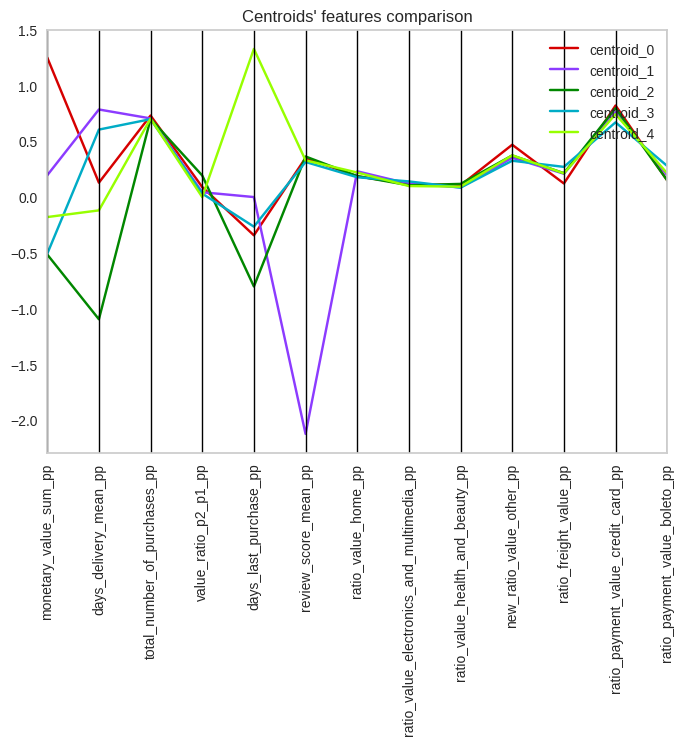

In [49]:
from pandas.plotting import parallel_coordinates


parallel_coordinates(centroids_5g, 'index', color=ds.pal)
plt.xticks(rotation = 90)
plt.title("Centroids' features comparison")
plt.show()

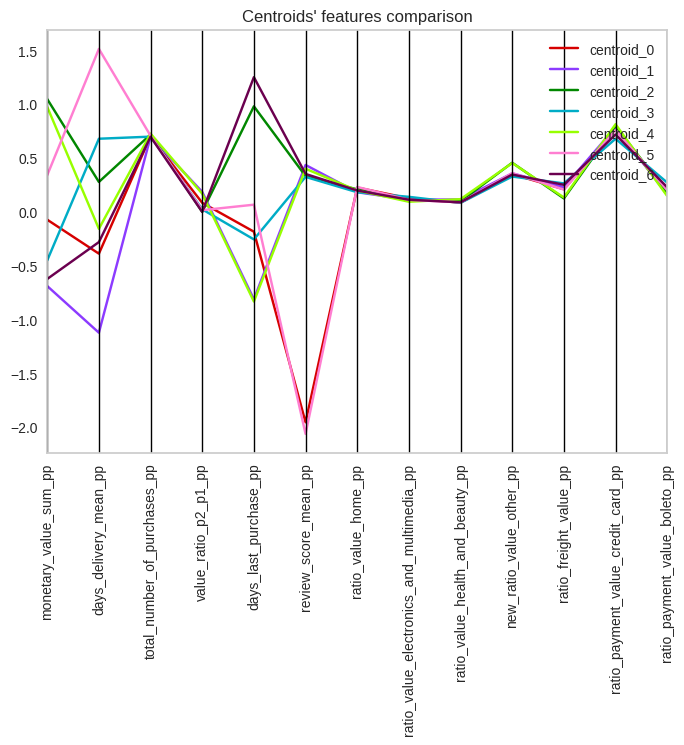

In [61]:
parallel_coordinates(centroids_7g, 'index', color=ds.pal)
plt.xticks(rotation = 90) 
plt.title("Centroids' features comparison")
plt.show()

In [50]:
X.columns

Index(['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases',
       'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean',
       'ratio_value_home', 'ratio_value_electronics_and_multimedia',
       'ratio_value_health_and_beauty', 'new_ratio_value_other',
       'ratio_freight_value', 'ratio_payment_value_credit_card',
       'ratio_payment_value_boleto', 'Kmeans_2g', 'Kmeans_3g', 'Kmeans_4g',
       'Kmeans_5g', 'Kmeans_6g', 'Kmeans_7g', 'Kmeans_9g', 'Kmeans_11g',
       'hierarchical_ward_4g_full'],
      dtype='object')

In [59]:
# 'centroids for the hierarchical clustering'
fake_centroid = pd.DataFrame()
for k in range(4):
    df = X.query('hierarchical_ward_4g_full == @k').loc[:, all_fts]
    fake_centroid[f'centroid_{k}'] = df.mean()
fake_centroid_pp = pre_processor.transform(fake_centroid.T)
fake_centroid_pp = pd.DataFrame(fake_centroid_pp,
                             index=fake_centroid.columns,
                             columns=fake_centroid.index)
fake_centroid_pp = fake_centroid_pp.reset_index()
fake_centroid_pp

,index,monetary_value_sum,days_delivery_mean,total_number_of_purchases,value_ratio_p2_p1,days_last_purchase,review_score_mean,ratio_value_home,ratio_value_electronics_and_multimedia,ratio_value_health_and_beauty,new_ratio_value_other,ratio_freight_value,ratio_payment_value_credit_card,ratio_payment_value_boleto
0,centroid_0,0.020443,0.483211,0.704742,0.004142,0.520481,0.288491,0.201223,0.136948,0.091130,0.340249,0.230450,0.698802,0.257254
1,centroid_1,0.652593,0.991693,0.707315,0.060453,0.104444,-2.097979,0.253619,0.105149,0.078576,0.355383,0.207273,0.791670,0.168048
2,centroid_2,0.069611,-0.577841,0.708641,0.237237,-0.719170,0.407638,0.196630,0.094690,0.113171,0.387808,0.207701,0.793472,0.150223
3,centroid_3,1.913215,0.581829,0.749057,0.108104,-0.152549,0.251222,0.115112,0.105449,0.113183,0.561248,0.105009,0.847370,0.136362


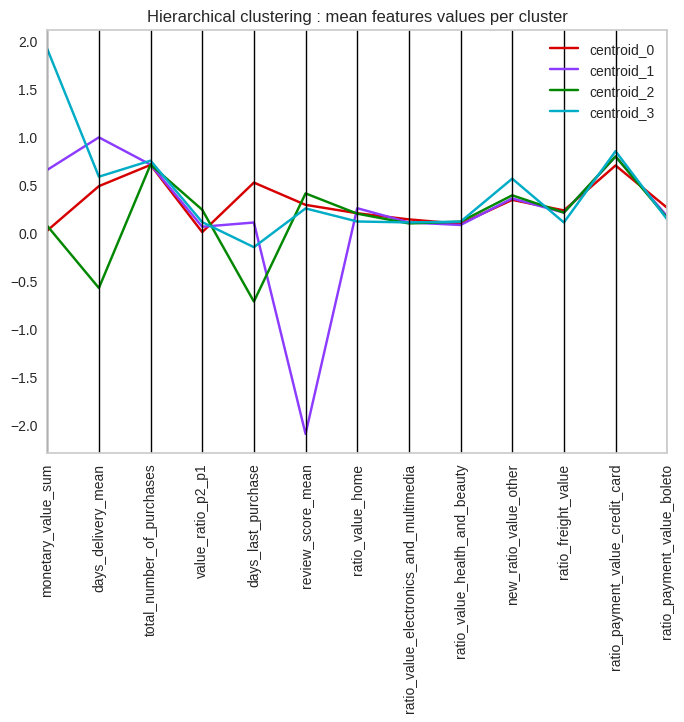

In [62]:
parallel_coordinates(fake_centroid_pp, 'index', color=ds.pal)
plt.xticks(rotation = 90) 
plt.title('Hierarchical clustering : mean features values per cluster')
plt.show()

### 1.8.3.  [&#9650;](#toc0_) <a id='toc1_8_3_'></a>Giving a description of labels in Kmeans models

*For the Kmeans_5g* :
    
0 - Best customers (high value). 

1 - Unsatisfied customers.

2 - Active customers (small values).

3 - On the verge to be less active (long delivery compared to 2).

4 - Small values and inactive customers.

***
*For the Kmeans_7g* :

0 : Unsatisfied customers with short deliveries (product problem?).

1 : Active customer, most satisfied, spend small values.

2 : Old inactive important customers.

3 : Small values, we are starting to lose them. had experimented a quite long delivery time.

4 : Recent important customers.

5 : Unsatisfied customers with long deliveries.

6 : Inactive customers who spent small values.

***
remark :

- Some comments on the values spent per categories and payments can also be done, but it is not black and white.






# 2.  [&#9650;](#toc0_) <a id='toc2_'></a>Reducing the inputs ?

In [36]:
new_fts = ['monetary_value_sum_pp', 'days_delivery_mean_pp',
           'value_ratio_p2_p1_pp', 'total_number_of_purchases_pp',
           'days_last_purchase_pp', 'review_score_mean_pp']

Xspp2 = Xspp.loc[:, new_fts]

In [39]:
new_fts_not_pp = [ft.rstrip('_p') for ft in new_fts]
new_fts_not_pp

['monetary_value_sum',
 'days_delivery_mean',
 'value_ratio_p2_p1',
 'total_number_of_purchases',
 'days_last_purchase',
 'review_score_mean']

In [34]:
ks = [4, 5, 6, 7]
for k in ks:
    label_name = 'Kmeans_' + str(k) + 'g_less_input'
    kmeans_label_names.append(label_name)
    print(label_name)
    # Add labels as columns in Xs
    Xs.loc[:, label_name] = KMeans(n_clusters=k, n_init=10).fit_predict(Xspp2)
    
    label_name = 'hierarchical_ward' + str(k) + 'g_less_input'
    print(label_name)
    # Add labels as columns in Xs
    Xs.loc[:, label_name] = (AgglomerativeClustering(linkage='ward',
                                                     n_clusters=k)
                             .fit_predict(Xspp2))
    
    

Kmeans_4g_less_input
hierarchical_ward4g_less_input
Kmeans_5g_less_input
hierarchical_ward5g_less_input
Kmeans_6g_less_input
hierarchical_ward6g_less_input
Kmeans_7g_less_input
hierarchical_ward7g_less_input


In [35]:
Xs.columns

Index(['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases',
       'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean',
       'ratio_value_home', 'ratio_value_electronics_and_multimedia',
       'ratio_value_health_and_beauty', 'new_ratio_value_other',
       'ratio_freight_value', 'ratio_payment_value_credit_card',
       'ratio_payment_value_boleto', 'Kmeans_2g', 'Kmeans_3g', 'Kmeans_4g',
       'Kmeans_5g', 'Kmeans_6g', 'Kmeans_7g', 'Kmeans_9g', 'Kmeans_11g',
       'hierarchical_ward_3g', 'hierarchical_ward_4g', 'hierarchical_ward_5g',
       'hierarchical_ward_6g', 'hierarchical_ward_7g', 'hierarchical_ward_8g',
       'hierarchical_ward_9g', 'hierarchical_ward_10g',
       'hierarchical_ward_15g', 'OPTICS', 'Kmeans_4g_less_input',
       'hierarchical_ward4g_less_input', 'Kmeans_5g_less_input',
       'hierarchical_ward5g_less_input', 'Kmeans_6g_less_input',
       'hierarchical_ward6g_less_input', 'Kmeans_7g_less_input',
       'hierarchical_ward7

Kmeans_4g
Kmeans_5g
Kmeans_6g
Kmeans_7g
hierarchical_ward_4g
hierarchical_ward_5g
hierarchical_ward_6g
hierarchical_ward_7g
Kmeans_4g_less_input
Kmeans_5g_less_input
Kmeans_6g_less_input
Kmeans_7g_less_input
hierarchical_ward4g_less_input
hierarchical_ward5g_less_input
hierarchical_ward6g_less_input
hierarchical_ward7g_less_input


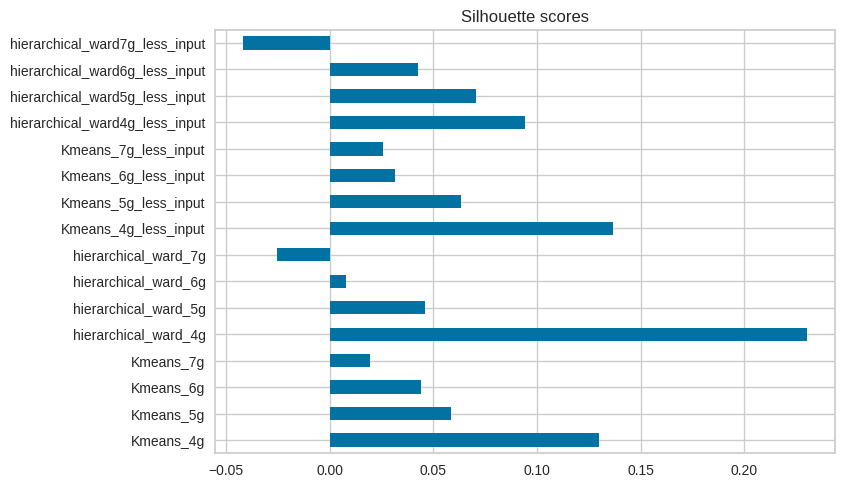

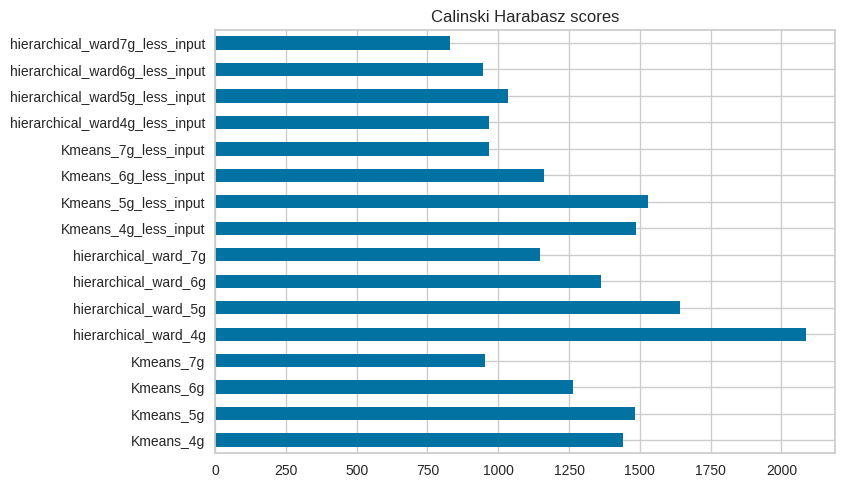

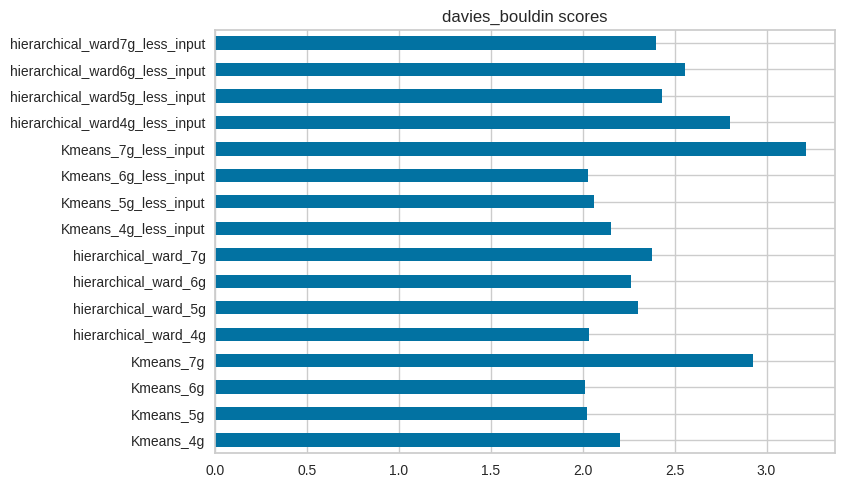

In [41]:
label_names = ['Kmeans_4g', 'Kmeans_5g', 'Kmeans_6g', 'Kmeans_7g', 
               'hierarchical_ward_4g', 'hierarchical_ward_5g',
               'hierarchical_ward_6g', 'hierarchical_ward_7g', 
               'Kmeans_4g_less_input',
               'Kmeans_5g_less_input',
               'Kmeans_6g_less_input',
               'Kmeans_7g_less_input',
               'hierarchical_ward4g_less_input',
               'hierarchical_ward5g_less_input',
               'hierarchical_ward6g_less_input',
               'hierarchical_ward7g_less_input']
               

silhouettes = []
calinski_harabasz = []
davies_bouldin = []

for label_name in label_names:
    print(label_name)
    silhouettes.append(silhouette_score(Xs[new_fts_not_pp], Xs[label_name]))
    calinski_harabasz.append(calinski_harabasz_score(Xs[new_fts_not_pp], Xs[label_name]))
    davies_bouldin.append(davies_bouldin_score(Xs[new_fts_not_pp], Xs[label_name]))
    
silhouettes_df = pd.DataFrame(silhouettes, index=label_names)
silhouettes_df.plot(kind='barh', legend=False, title='Silhouette scores')
plt.show()

(pd.DataFrame(calinski_harabasz, index=label_names)
.plot(kind='barh', legend=False, title='Calinski Harabasz scores'))
plt.show()

(pd.DataFrame(davies_bouldin, index=label_names)
.plot(kind='barh', legend=False, title='davies_bouldin scores'))
plt.show()
    

Scores were not decreasing so I am going to evaluate stability on the results of the third section

# 3.  [&#9650;](#toc0_) <a id='toc3_'></a>Top clusterers stability

## 3.1.  [&#9650;](#toc0_) <a id='toc3_1_'></a>Running 20 times each clustering model

In [12]:
Xspp.head()

,monetary_value_sum_pp,days_delivery_mean_pp,total_number_of_purchases_pp,value_ratio_p2_p1_pp,days_last_purchase_pp,review_score_mean_pp,ratio_value_home_pp,ratio_value_electronics_and_multimedia_pp,ratio_value_health_and_beauty_pp,new_ratio_value_other_pp,ratio_freight_value_pp,ratio_payment_value_credit_card_pp,ratio_payment_value_boleto_pp
customer_unique_id,,,,,,,,,,,,,
b0af01f9dffde5df4749042a8ef0c77d,-1.336002,-2.001803,0.693147,0.0,-0.596713,0.664925,0.000000,0.0,0.0,0.798398,0.201602,1.0,0.0
1e85ad2cf60fcd8b3668f0f9a403e846,1.190353,-0.108803,0.693147,0.0,0.798954,0.664925,0.000000,0.0,0.0,0.946856,0.053144,0.0,1.0
b301c5f01b5580a005e77435e073db77,1.542361,-0.108803,0.693147,0.0,-0.446007,0.664925,0.000000,0.0,0.0,0.938239,0.061761,1.0,0.0
b457be6b6697fceb8d4863c876f7a6cc,-0.279437,0.041052,0.693147,0.0,-0.806390,0.664925,0.782229,0.0,0.0,0.000000,0.217771,1.0,0.0
4b979b432abe14a88cd0cde893952677,1.180937,-0.364331,1.098612,0.0,0.595829,0.664925,0.000000,0.0,0.0,0.816744,0.183256,1.0,0.0


In [23]:
clusterers = {
    'hierarchical_ward_4g': AgglomerativeClustering(linkage='ward',
                                                    n_clusters=4),
    'Kmeans_5g': KMeans(n_clusters=5, n_init=10),
    'Kmeans_7g': KMeans(n_clusters=7, n_init=10)
}

# Run n_iter times the 3 models and store labels in Xs.
n_iter = 20
for clusterer_name, clusterer in clusterers.items():
    print(clusterer_name)
    for k in range(n_iter):
        print(k)
        label_name = clusterer_name + '_run' + str(k)
        Xs.loc[:, label_name] = clusterer.fit_predict(Xspp)
    

hierarchical_ward_4g
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
Kmeans_5g
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
Kmeans_7g
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [24]:
Xs.columns

Index(['monetary_value_sum', 'days_delivery_mean', 'total_number_of_purchases',
       'value_ratio_p2_p1', 'days_last_purchase', 'review_score_mean',
       'ratio_value_home', 'ratio_value_electronics_and_multimedia',
       'ratio_value_health_and_beauty', 'new_ratio_value_other',
       'ratio_freight_value', 'ratio_payment_value_credit_card',
       'ratio_payment_value_boleto', 'hierarchical_ward_4g_run0',
       'hierarchical_ward_4g_run1', 'hierarchical_ward_4g_run2',
       'hierarchical_ward_4g_run3', 'hierarchical_ward_4g_run4',
       'hierarchical_ward_4g_run5', 'hierarchical_ward_4g_run6',
       'hierarchical_ward_4g_run7', 'hierarchical_ward_4g_run8',
       'hierarchical_ward_4g_run9', 'hierarchical_ward_4g_run10',
       'hierarchical_ward_4g_run11', 'hierarchical_ward_4g_run12',
       'hierarchical_ward_4g_run13', 'hierarchical_ward_4g_run14',
       'hierarchical_ward_4g_run15', 'hierarchical_ward_4g_run16',
       'hierarchical_ward_4g_run17', 'hierarchical_ward_4

In [25]:
ward_cols = ['hierarchical_ward_4g_run0',
             'hierarchical_ward_4g_run1', 'hierarchical_ward_4g_run2',
             'hierarchical_ward_4g_run3', 'hierarchical_ward_4g_run4',
             'hierarchical_ward_4g_run5', 'hierarchical_ward_4g_run6',
             'hierarchical_ward_4g_run7', 'hierarchical_ward_4g_run8',
             'hierarchical_ward_4g_run9', 'hierarchical_ward_4g_run10',
             'hierarchical_ward_4g_run11', 'hierarchical_ward_4g_run12',
             'hierarchical_ward_4g_run13', 'hierarchical_ward_4g_run14',
             'hierarchical_ward_4g_run15', 'hierarchical_ward_4g_run16',
             'hierarchical_ward_4g_run17', 'hierarchical_ward_4g_run18',
             'hierarchical_ward_4g_run19']
ward_df = Xs.loc[:, ward_cols]
ward_df.head()

,hierarchical_ward_4g_run0,hierarchical_ward_4g_run1,hierarchical_ward_4g_run2,hierarchical_ward_4g_run3,hierarchical_ward_4g_run4,hierarchical_ward_4g_run5,hierarchical_ward_4g_run6,hierarchical_ward_4g_run7,hierarchical_ward_4g_run8,hierarchical_ward_4g_run9,hierarchical_ward_4g_run10,hierarchical_ward_4g_run11,hierarchical_ward_4g_run12,hierarchical_ward_4g_run13,hierarchical_ward_4g_run14,hierarchical_ward_4g_run15,hierarchical_ward_4g_run16,hierarchical_ward_4g_run17,hierarchical_ward_4g_run18,hierarchical_ward_4g_run19
customer_unique_id,,,,,,,,,,,,,,,,,,,,
b0af01f9dffde5df4749042a8ef0c77d,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
1e85ad2cf60fcd8b3668f0f9a403e846,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
b301c5f01b5580a005e77435e073db77,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3
b457be6b6697fceb8d4863c876f7a6cc,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
4b979b432abe14a88cd0cde893952677,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3,3


In [26]:
kmeans_5g_cols = ['Kmeans_5g_run0', 'Kmeans_5g_run1',
                  'Kmeans_5g_run2', 'Kmeans_5g_run3', 'Kmeans_5g_run4', 
                  'Kmeans_5g_run5', 'Kmeans_5g_run6', 'Kmeans_5g_run7', 
                  'Kmeans_5g_run8', 'Kmeans_5g_run9',
                  'Kmeans_5g_run10', 'Kmeans_5g_run11', 'Kmeans_5g_run12',
                  'Kmeans_5g_run13', 'Kmeans_5g_run14', 'Kmeans_5g_run15',
                  'Kmeans_5g_run16', 'Kmeans_5g_run17', 'Kmeans_5g_run18',
                  'Kmeans_5g_run19']

kmeans_5g_df = Xs.loc[:, kmeans_5g_cols]
kmeans_5g_df.head()

,Kmeans_5g_run0,Kmeans_5g_run1,Kmeans_5g_run2,Kmeans_5g_run3,Kmeans_5g_run4,Kmeans_5g_run5,Kmeans_5g_run6,Kmeans_5g_run7,Kmeans_5g_run8,Kmeans_5g_run9,Kmeans_5g_run10,Kmeans_5g_run11,Kmeans_5g_run12,Kmeans_5g_run13,Kmeans_5g_run14,Kmeans_5g_run15,Kmeans_5g_run16,Kmeans_5g_run17,Kmeans_5g_run18,Kmeans_5g_run19
customer_unique_id,,,,,,,,,,,,,,,,,,,,
b0af01f9dffde5df4749042a8ef0c77d,4,4,3,1,1,1,1,3,0,1,0,0,1,2,4,0,2,3,0,3
1e85ad2cf60fcd8b3668f0f9a403e846,0,0,0,0,3,2,4,0,1,3,1,2,4,0,0,2,1,0,4,4
b301c5f01b5580a005e77435e073db77,0,0,0,0,3,2,4,0,1,3,1,2,4,0,0,2,1,0,4,4
b457be6b6697fceb8d4863c876f7a6cc,3,1,4,3,4,3,3,4,2,2,2,1,3,4,2,1,0,1,1,0
4b979b432abe14a88cd0cde893952677,0,0,0,0,3,2,4,0,1,3,1,2,4,0,0,2,1,0,4,4


In [27]:
kmeans_7g_cols = ['Kmeans_7g_run0', 'Kmeans_7g_run1',
                  'Kmeans_7g_run2', 'Kmeans_7g_run3', 'Kmeans_7g_run4', 
                  'Kmeans_7g_run5', 'Kmeans_7g_run6', 'Kmeans_7g_run7', 
                  'Kmeans_7g_run8', 'Kmeans_7g_run9',
                  'Kmeans_7g_run10', 'Kmeans_7g_run11', 'Kmeans_7g_run12',
                  'Kmeans_7g_run13', 'Kmeans_7g_run14', 'Kmeans_7g_run15',
                  'Kmeans_7g_run16', 'Kmeans_7g_run17', 'Kmeans_7g_run18',
                  'Kmeans_7g_run19']

kmeans_7g_df = Xs.loc[:, kmeans_7g_cols]
display(kmeans_7g_df.head())
kmeans_7g_df.shape

,Kmeans_7g_run0,Kmeans_7g_run1,Kmeans_7g_run2,Kmeans_7g_run3,Kmeans_7g_run4,Kmeans_7g_run5,Kmeans_7g_run6,Kmeans_7g_run7,Kmeans_7g_run8,Kmeans_7g_run9,Kmeans_7g_run10,Kmeans_7g_run11,Kmeans_7g_run12,Kmeans_7g_run13,Kmeans_7g_run14,Kmeans_7g_run15,Kmeans_7g_run16,Kmeans_7g_run17,Kmeans_7g_run18,Kmeans_7g_run19
customer_unique_id,,,,,,,,,,,,,,,,,,,,
b0af01f9dffde5df4749042a8ef0c77d,3,0,3,0,0,5,5,2,5,4,1,0,3,3,5,1,6,3,5,1
1e85ad2cf60fcd8b3668f0f9a403e846,5,3,2,2,3,1,6,4,3,2,0,6,1,6,4,0,3,0,2,4
b301c5f01b5580a005e77435e073db77,0,4,1,6,6,2,1,5,4,6,5,2,5,2,1,5,1,2,6,0
b457be6b6697fceb8d4863c876f7a6cc,1,6,5,4,5,3,4,0,0,1,4,1,2,5,2,2,5,5,0,6
4b979b432abe14a88cd0cde893952677,5,3,2,2,3,1,6,4,3,2,0,6,1,6,4,0,3,0,2,4


(10000, 20)

## 3.2.  [&#9650;](#toc0_) <a id='toc3_2_'></a>ARI scores between all pairs of runs for each model (distribution and dispersion)

In [28]:
import itertools

for model in ['ward', 'kmeans_5g', 'kmeans_7g']:
    print(model)
    df = eval(model + '_df')
    ARI_list = []
    for comb in itertools.combinations(df.columns, 2):
        ARI_list.append(adjusted_rand_score(df[comb[0]], df[comb[1]]))
        
    exec(model + '_ARIs = ARI_list')

ward
kmeans_5g
kmeans_7g


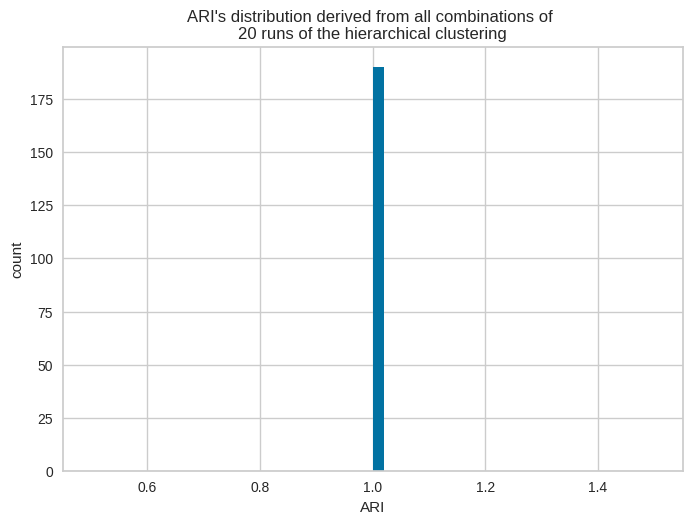

In [29]:
pd.Series(ward_ARIs).hist(bins=50)
plt.title("ARI's distribution derived from all combinations of \n"
          "20 runs of the hierarchical clustering")
plt.xlabel("ARI")
plt.ylabel("count")
plt.show()

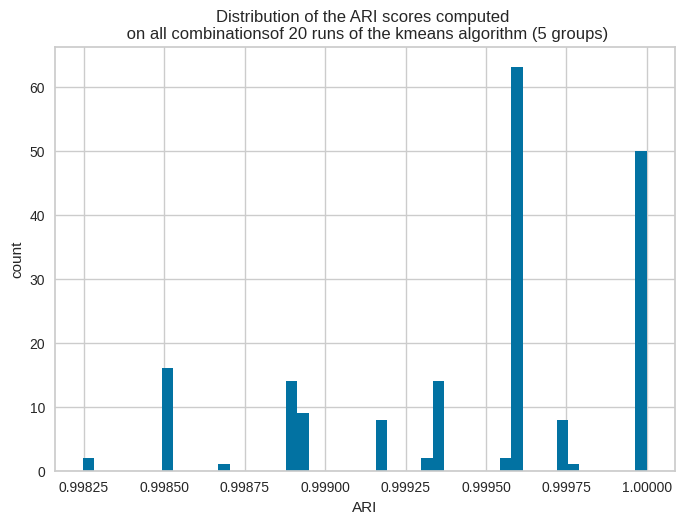

In [30]:
pd.Series(kmeans_5g_ARIs).hist(bins=50)
plt.title('Distribution of the ARI scores computed \n on all combinations'
          'of 20 runs of the kmeans algorithm (5 groups)')
plt.xlabel("ARI")
plt.ylabel("count")
plt.show()

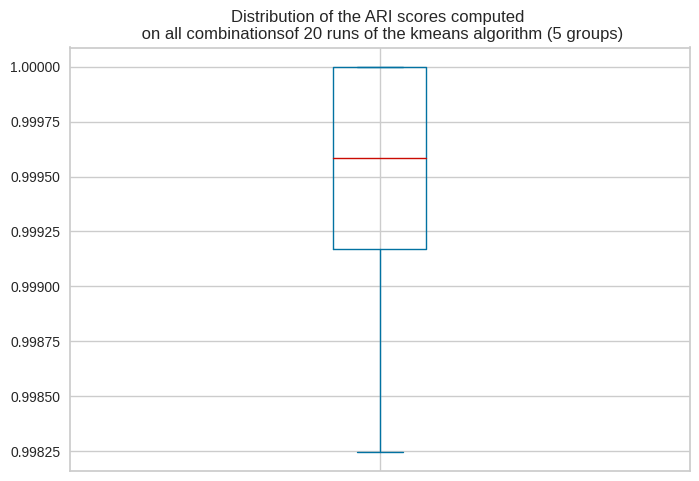

In [31]:
pd.Series(kmeans_5g_ARIs).plot.box()
plt.title('Distribution of the ARI scores computed \n on all combinations'
          'of 20 runs of the kmeans algorithm (5 groups)')
plt.show()

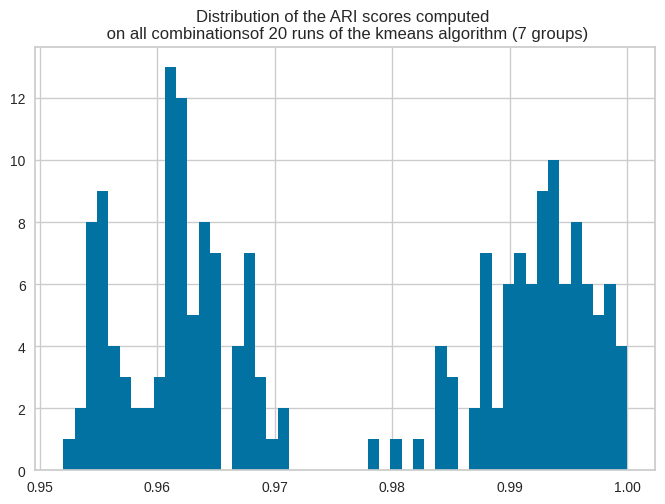

In [32]:
pd.Series(kmeans_7g_ARIs).hist(bins=50)
plt.title('Distribution of the ARI scores computed \n on all combinations'
          'of 20 runs of the kmeans algorithm (7 groups)')
plt.show()

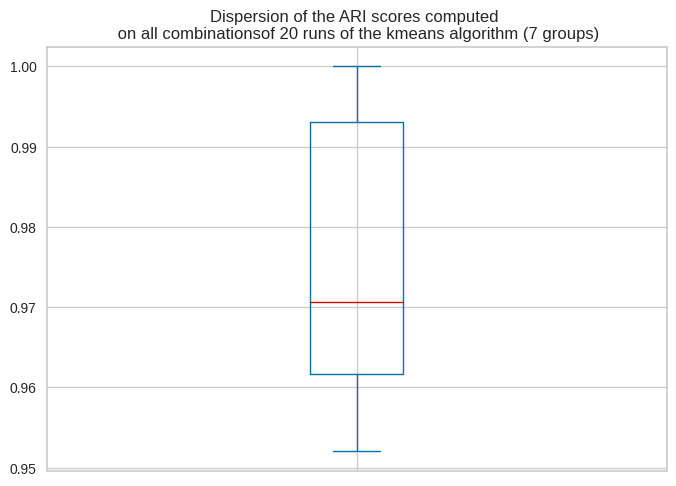

In [33]:
pd.Series(kmeans_7g_ARIs).plot.box()
plt.title('Dispersion of the ARI scores computed \n on all combinations'
          'of 20 runs of the kmeans algorithm (7 groups)')
plt.show()

Even though the Kmeans_7g interpretation was promising, the look at its stability is a clear drawback. 

Indeed, the ARI scores distribution shows that is quite likely that labels change while we run the algorithm on the same dataset multiple times, thus leading to difficulty to explain the content of a cluster.

For this reason, I prefer to value stability over precision and transmit information that is very likely to be true.

For an easier time computation on the full dataset, and because it sort of catches the 'dynamic' customers, I opt for the Kmeans_5g as my goto algorithm and will study maintenance necessity on it.